In [2]:
# How do similar networks respond to FGSM Attacks from foolbox?
# Classic vs FGN vs Converted+trained

In [3]:
%load_ext autoreload
%autoreload 2

In [4]:
import matplotlib as mpl
# set this 'backend' when using jupyter; do this before importing pyplot
mpl.use('nbagg')
import matplotlib.pyplot as plt
mpl.rcParams['figure.figsize'] = (8.0, 5.0)

In [5]:
import numpy as np

from foolbox import PyTorchModel, accuracy
import foolbox.attacks as fa
import foolbox as fb

import torch
from torch import optim

import copy

In [6]:
# custom library imports
import sys
sys.path.append('/home/felix/Research/Adversarial Research/FGN---Research/')
import Finite_Gaussian_Network_lib as fgnl
import Finite_Gaussian_Network_lib.fgn_helper_lib as fgnh

In [7]:
# check gpus
!gpustat

countdown               Sat Jun 19 06:16:36 2021  418.152.00
[0] GeForce RTX 2080 Ti | 53'C,   0 % |  3555 / 10989 MB | felix(2655M) felix(889M)
[1] GeForce RTX 2080 Ti | 55'C,   0 % |  7923 / 10988 MB | felix(7843M) root(68M)


In [8]:
# Define what device we are using
print("CUDA Available: ",torch.cuda.is_available())
use_cuda = True
device = torch.device("cuda" if (use_cuda and torch.cuda.is_available()) else "cpu")
print("Using device:", device)

# manualy set cuda device
torch.cuda.set_device(1)

CUDA Available:  True
Using device: cuda


/home/felix/.local/lib/python3.6/site-packages/torch/cuda/__init__.py:125: UserWarning: 
GeForce RTX 2080 Ti with CUDA capability sm_75 is not compatible with the current PyTorch installation.
The current PyTorch install supports CUDA capabilities sm_37 sm_50 sm_60 sm_70.
If you want to use the GeForce RTX 2080 Ti GPU with PyTorch, please check the instructions at https://pytorch.org/get-started/locally/

  warnings.warn(incompatible_device_warn.format(device_name, capability, " ".join(arch_list), device_name))


In [9]:
# get data 
(mnist_train_loader, mnist_val_loader, mnist_test_loader) = fgnh.mnist_dataloaders(batch_size=10000, 
                                                                                   batch_size_for_val=100000)

# minimum/maximum pixel value post normalization, from train dataset
min_pix = -0.4242129623889923095703125
max_pix =  2.8214867115020751953125000

images, labels = mnist_val_loader.dataset.tensors
images = images.to(device)
labels = labels.to(device)

In [11]:
for x,t in mnist_train_loader:
    break

In [13]:
t

tensor([3, 9, 9,  ..., 0, 7, 9])

In [9]:
# load classic model
classic_model_path = "../Experiments/sample_models/sample_classic_full.pth"
classic_model = torch.load(classic_model_path, map_location=torch.device(device))
# classic_model.to(device)

In [10]:
# classic model params
!cat '../Experiments/sample_models/sample_FGN_parameters.txt'

hidden_layer_sizes [64, 64]
drop_p 0.2
batch_size 4000
optimizer Adam (
Parameter Group 0
    amsgrad: False
    betas: (0.9, 0.999)
    eps: 1e-08
    lr: 0.01
    weight_decay: 0
)
ordinal 2.0
covar_type sphere
lambda for l2 loss 8e-06
lambda for sigma loss 1e-06
non-linearity True


In [11]:
# load an fgn model check same params as FGN
fgn_model_path = '../Experiments/sample_models/sample_FGN_full.pth'
fgn_model = torch.load(fgn_model_path, map_location=torch.device(device))
# fgn_model.to(device)

In [12]:
# convert model
fgnl.convert_classic_to_fgn(classic_model, fgn_model, init_factor=1e1, verbose=True)

odict_keys([])


ModuleAttributeError: 'BatchNorm1d' object has no attribute '_non_persistent_buffers_set'

In [13]:
# do a quick retrain of the converted model
ret_quick_fgn_model = copy.deepcopy(fgn_model)
# ret_quick_fgn_model.to(device)

# define loss
lmbda_l2 = (4.0*0.1/len(mnist_train_loader.dataset))
lmbda_sigs = 1e-5
print("lambda for l2 loss", lmbda_l2)
print("lambda for sigs^2 loss", lmbda_sigs)

cross_ent_loss = fgnl.def_fgn_cross_ent_loss(lmbda_l2, lmbda_sigs)

# define optimizer
optimizer = optim.Adam(filter(lambda p: p.requires_grad, ret_quick_fgn_model.parameters()), lr=1e-3)

# train the network for N epochs
epochs = 1
train_res = fgnh.train(ret_quick_fgn_model, mnist_train_loader, 
                             cross_ent_loss, optimizer, epochs, save_hist=2, verbose=True, 
                             pred_func=fgnh.cross_ent_pred_accuracy, test_loader=mnist_val_loader)

lambda for l2 loss 8e-06
lambda for sigs^2 loss 1e-05
Epoch 0 Train set - Average loss: 0.0648, Accuracy: 49010/50000 (98%)
Test set - Average loss: 0.0857, Accuracy: 9779/10000 (98%)


In [14]:
# # load heavily retrained model
# ret_fgn_model_path = '../Experiments/sample_models/sample_fgn_converted+retrained_full.pth'
# ret_fgn_model = torch.load(ret_fgn_model_path)
# ret_fgn_model.to(device)

In [15]:
# do a long retrain of the converted model
ret_fgn_model= copy.deepcopy(fgn_model)

# define loss
lmbda_l2 = (4.0*0.1/len(mnist_train_loader.dataset))
lmbda_sigs = 1e-1
print("lambda for l2 loss", lmbda_l2)
print("lambda for sigs^2 loss", lmbda_sigs)

cross_ent_loss = fgnl.def_fgn_cross_ent_loss(lmbda_l2, lmbda_sigs)

# define optimizer
optimizer = optim.Adam(filter(lambda p: p.requires_grad, ret_fgn_model.parameters()), lr=1e-3)

# train the network for N epochs
epochs = 75
train_res = fgnh.train(ret_fgn_model, mnist_train_loader, 
                             cross_ent_loss, optimizer, epochs, save_hist=2, verbose=True, 
                             pred_func=fgnh.cross_ent_pred_accuracy, test_loader=mnist_val_loader)

lambda for l2 loss 8e-06
lambda for sigs^2 loss 0.1
Epoch 0 Train set - Average loss: 19.6552, Accuracy: 49007/50000 (98%)
Test set - Average loss: 17.2235, Accuracy: 9777/10000 (98%)
Epoch 1 Train set - Average loss: 16.0251, Accuracy: 48945/50000 (98%)
Test set - Average loss: 14.4822, Accuracy: 9777/10000 (98%)
Epoch 2 Train set - Average loss: 13.6863, Accuracy: 48785/50000 (98%)
Test set - Average loss: 12.5986, Accuracy: 9770/10000 (98%)
Epoch 3 Train set - Average loss: 12.0511, Accuracy: 48587/50000 (97%)
Test set - Average loss: 11.2306, Accuracy: 9766/10000 (98%)
Epoch 4 Train set - Average loss: 10.8565, Accuracy: 48325/50000 (97%)
Test set - Average loss: 10.2000, Accuracy: 9763/10000 (98%)
Epoch 5 Train set - Average loss: 9.9614, Accuracy: 47880/50000 (96%)
Test set - Average loss: 9.4022, Accuracy: 9749/10000 (97%)
Epoch 6 Train set - Average loss: 9.2674, Accuracy: 47493/50000 (95%)
Test set - Average loss: 8.7696, Accuracy: 9738/10000 (97%)
Epoch 7 Train set - Average 

Epoch 63 Train set - Average loss: 2.8185, Accuracy: 48194/50000 (96%)
Test set - Average loss: 3.0715, Accuracy: 9716/10000 (97%)
Epoch 64 Train set - Average loss: 2.7893, Accuracy: 48217/50000 (96%)
Test set - Average loss: 3.0381, Accuracy: 9716/10000 (97%)
Epoch 65 Train set - Average loss: 2.7571, Accuracy: 48278/50000 (97%)
Test set - Average loss: 3.0116, Accuracy: 9720/10000 (97%)
Epoch 66 Train set - Average loss: 2.7284, Accuracy: 48243/50000 (96%)
Test set - Average loss: 2.9818, Accuracy: 9722/10000 (97%)
Epoch 67 Train set - Average loss: 2.7000, Accuracy: 48311/50000 (97%)
Test set - Average loss: 2.9542, Accuracy: 9726/10000 (97%)
Epoch 68 Train set - Average loss: 2.6727, Accuracy: 48270/50000 (97%)
Test set - Average loss: 2.9193, Accuracy: 9723/10000 (97%)
Epoch 69 Train set - Average loss: 2.6462, Accuracy: 48278/50000 (97%)
Test set - Average loss: 2.8901, Accuracy: 9724/10000 (97%)
Epoch 70 Train set - Average loss: 2.6166, Accuracy: 48296/50000 (97%)
Test set - A

In [16]:
# set model bounds and preprocessing

# bounds - I think these might be the bounds:
# inputs ? I think it this
# noise?
# bounds = (-(max_pix-min_pix)/128,(max_pix-min_pix)/128)
bounds = (min_pix+1e-6, max_pix-1e-6)
# preprocessing - I think these would be used in similar way to pytorch preprocessing
# but possible passed to whatever architecture is used (torch, tensorflow, other) 
# in my case the dataloaders already normalizes the data
preprocessing = dict(mean=0, std=1)

In [17]:
# ready the models for foolbox
classic_model.eval()
classic_f_model = PyTorchModel(classic_model, bounds=bounds, device=device)

fgn_model.eval()
fgn_f_model = PyTorchModel(fgn_model, bounds=bounds, device=device)

ret_quick_fgn_model.eval()
ret_quick_fgn_f_model = PyTorchModel(ret_quick_fgn_model, bounds=bounds, device=device)

ret_fgn_model.eval()
ret_fgn_f_model = PyTorchModel(ret_fgn_model, bounds=bounds, device=device)

In [18]:
ret_fgn_f_model.bounds

Bounds(lower=-0.42421196238899234, upper=2.821485711502075)

In [19]:
# check model accuracies
print('accuracies for classic and fgn models')
print(accuracy(classic_f_model, images, labels))
print(accuracy(fgn_f_model, images, labels))
print(accuracy(ret_quick_fgn_f_model, images, labels))
print(accuracy(ret_fgn_f_model, images, labels))

accuracies for classic and fgn models
0.9738999605178833
0.9756999611854553
0.977899968624115
0.9720999598503113


In [20]:
# attack params to explore
epsilons = [(max_pix-min_pix)*x 
            for x in 
            [0.0,
             1/256,
             3/512,
             1/128,
             3/256,
             1/64,
             3/128,
             1/32,
             3/64,
             1/16,
             3/32,
             1/8,
             3/16,
             1/4,
             3/8,
             1/2,
             3/4,
             1.0,] ]

print('epsilons: {}'.format(epsilons))

epsilons: [0.0, 0.012678514351136982, 0.019017771526705474, 0.025357028702273965, 0.03803554305341095, 0.05071405740454793, 0.0760710861068219, 0.10142811480909586, 0.1521421722136438, 0.20285622961819172, 0.3042843444272876, 0.40571245923638344, 0.6085686888545752, 0.8114249184727669, 1.2171373777091503, 1.6228498369455338, 2.4342747554183006, 3.2456996738910675]


In [21]:
# attack the classic model
classic_raw, classic_clipped, classic_adv_success = fa.FGSM()(classic_f_model, images, labels, epsilons=epsilons)

In [22]:
# attack the converted fgn model
fgn_raw, fgn_clipped, fgn_adv_success = fa.FGSM()(fgn_f_model, images, labels, epsilons=epsilons)

In [23]:
# attack the quick retrained fgn model
ret_quick_fgn_raw, ret_quick_fgn_clipped, ret_quick_fgn_adv_success = fa.FGSM()(ret_quick_fgn_f_model, images, labels, epsilons=epsilons)

In [24]:
# attack the  long retrained fgn model
ret_fgn_raw, ret_fgn_clipped, ret_fgn_adv_success = fa.FGSM()(ret_fgn_f_model, images, labels, epsilons=epsilons)

In [25]:
names = ['Classic', 'converted FGN', 'quick retrain FGN', 'long retrain FGN']

Classic Accuracy per epsilon [0.9739 0.1837 0.134  0.1102 0.0873 0.0783 0.0716 0.0673 0.0647 0.0633
 0.0623 0.0613 0.0614 0.0608 0.0605 0.0604 0.0605 0.0605]
FGN Accuracy per epsilon [0.9757 0.1997 0.1126 0.1164 0.0969 0.0989 0.099  0.099  0.099  0.099
 0.099  0.1119 0.109  0.109  0.109  0.109  0.109  0.109 ]
Quick Retrained FGN Accuracy per epsilon [0.9779 0.1877 0.1099 0.1098 0.1017 0.099  0.099  0.099  0.099  0.099
 0.099  0.105  0.109  0.109  0.109  0.109  0.109  0.109 ]
Long Retrained FGN Accuracy per epsilon [0.9721 0.0991 0.0991 0.0991 0.0991 0.0991 0.0948 0.108  0.109  0.109
 0.109  0.109  0.109  0.109  0.109  0.109  0.109  0.109 ]


<IPython.core.display.Javascript object>


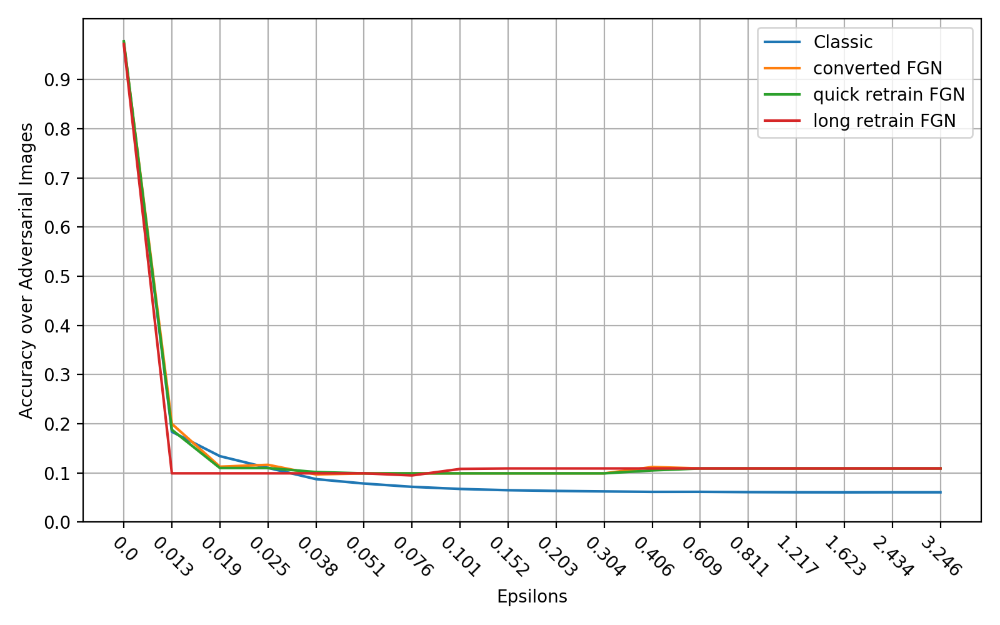

In [26]:
# compare raw success rates
print('Classic Accuracy per epsilon', 1.0 - classic_adv_success.cpu().numpy().mean(axis=-1))
print('FGN Accuracy per epsilon', 1.0 - fgn_adv_success.cpu().numpy().mean(axis=-1))
print('Quick Retrained FGN Accuracy per epsilon', 1.0 - ret_quick_fgn_adv_success.cpu().numpy().mean(axis=-1))
print('Long Retrained FGN Accuracy per epsilon', 1.0 - ret_fgn_adv_success.cpu().numpy().mean(axis=-1))

plt.plot(1.0 - classic_adv_success.cpu().numpy().mean(axis=-1), label=names[0])
plt.plot(1.0 - fgn_adv_success.cpu().numpy().mean(axis=-1), label=names[1])
plt.plot(1.0 - ret_quick_fgn_adv_success.cpu().numpy().mean(axis=-1), label=names[2])
plt.plot(1.0 - ret_fgn_adv_success.cpu().numpy().mean(axis=-1), label=names[3])
plt.legend()
plt.xticks(range(len(epsilons)), labels=np.round(epsilons,3), rotation=-45)
plt.xlabel('Epsilons')
plt.yticks([x/100 for x in range(0,100,10)])
plt.ylabel('Accuracy over Adversarial Images')
plt.tight_layout()
plt.grid()
plt.show()

In [37]:
# extract succesful adv indices
classic_successful_adv_indices = [np.flatnonzero(x) for x in classic_adv_success.cpu().numpy()]
fgn_successful_adv_indices = [np.flatnonzero(x) for x in fgn_adv_success.cpu().numpy()]
ret_quick_fgn_successful_adv_indices = [np.flatnonzero(x) for x in ret_quick_fgn_adv_success.cpu().numpy()]
ret_fgn_successful_adv_indices = [np.flatnonzero(x) for x in ret_fgn_adv_success.cpu().numpy()]

In [38]:
# extract succesful adv raw images
classic_raw_successful = [torch.stack([classic_raw[i][k] for k in j]) 
                          for i,j in enumerate(classic_successful_adv_indices)]
fgn_raw_successful = [torch.stack([fgn_raw[i][k] for k in j])
                      for i,j in enumerate(fgn_successful_adv_indices)]
ret_quick_fgn_raw_successful = [torch.stack([ret_quick_fgn_raw[i][k] for k in j])
                      for i,j in enumerate(ret_quick_fgn_successful_adv_indices)]
ret_fgn_raw_successful = [torch.stack([ret_fgn_raw[i][k] for k in j])
                      for i,j in enumerate(ret_fgn_successful_adv_indices)]

In [39]:
# per epsilon, number of attacks that both:
#  - change the class
#  - have over 0.5 confidence

per_epsilon = []

for i, clipped_images in enumerate(zip(classic_raw_successful, fgn_raw_successful, 
                                       ret_quick_fgn_raw_successful, ret_fgn_raw_successful)):
    
    per_model = [] 
    for n, model in enumerate([classic_model, fgn_model, ret_quick_fgn_model, ret_fgn_model]):
        
        # compute predictions
        model.eval()
        with torch.no_grad(): preds = model(clipped_images[n].to(device))
        preds = preds.cpu().detach().numpy()
        
        # apply softmax for probabilities
        preds_softmax = np.array([np.exp(x)/sum(np.exp(x)) for x in preds.astype('float128')])
        # get the maximums
        preds_maxes = np.max(preds_softmax, axis=1)
        
        per_model.append(len([x for x in preds_maxes if x>=0.5 ]))
    per_epsilon.append(per_model)

In [40]:
l = list(zip(*per_epsilon))

In [41]:
np.reshape(l, (3,-1))

array([[ 242, 7463, 7934, 8244, 8584, 8728, 8814, 8846, 8878, 8895, 8878,
        8887, 8901, 8911, 8922, 8926, 8929, 8933,  207, 1993,   13,    0,
           0,    0],
       [   0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,  202, 1538,    7,    0,    0,    0,    0,    0,    0,    0,
           0,    0],
       [   0,    0,    0,    0,    0,    0,  218,    0,    0,    0,    0,
           0,    0,    0,    0,    0,    0,    0,    0,    0,    0,    0,
           0,    0]])

/home/apps/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


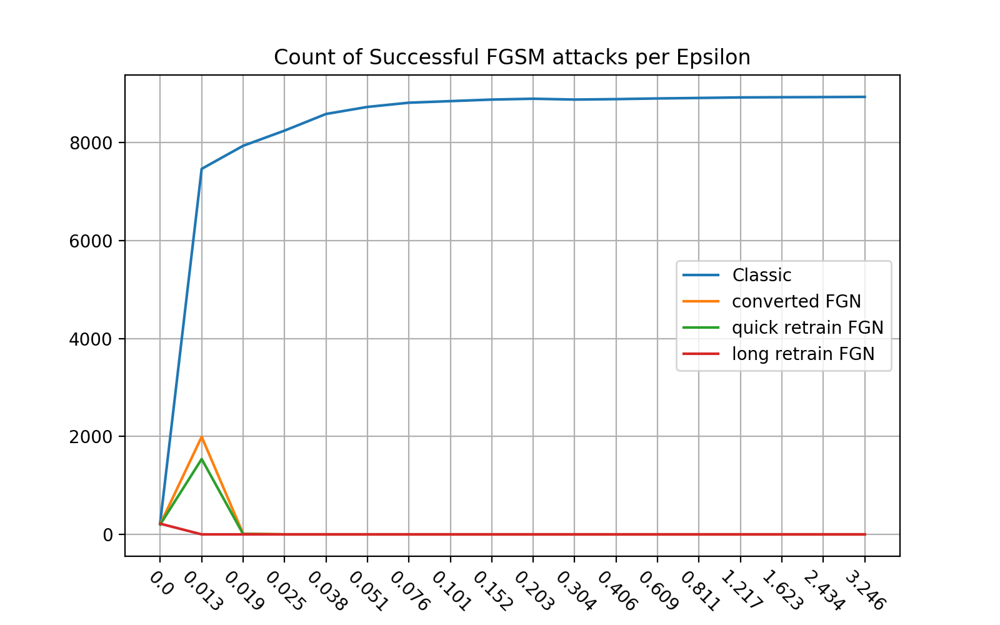

In [42]:
for n, p in enumerate(l):
    plt.plot(p, label=names[n])

plt.legend()
plt.grid()
plt.title('Count of Successful FGSM attacks per Epsilon')
plt.xticks(range(len(epsilons)), labels=np.round(epsilons,3), rotation=-45)
plt.show()

/home/felix/Research/Adversarial Research/FGN---Research/Finite_Gaussian_Network_lib/fgn_helper_lib/plot_pred_histogram.py:30: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  plt.hist(preds_maxes, bins=(np.arange(51)+1)/51.0, rwidth=0.9, align='mid', weights=weights)


<IPython.core.display.Javascript object>


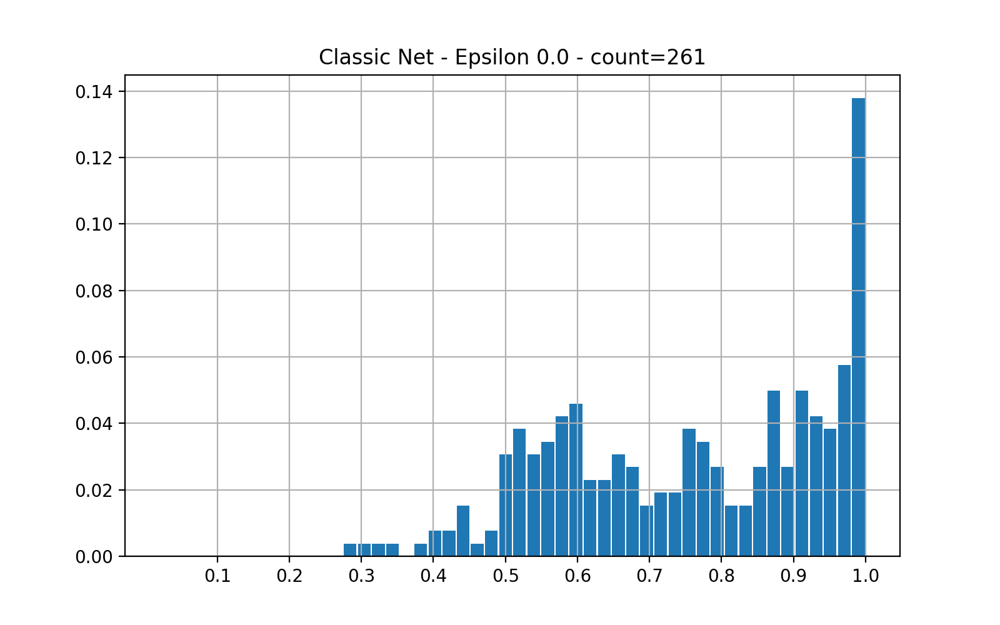

Statistical description of the predictions maximums
DescribeResult(nobs=261, minmax=(0.29110062067801978724, 0.99960376218482475415), mean=0.75990763422525877617, variance=0.03465638617347232819, skewness=-0.33914380812407944003, kurtosis=-1.0657851846726500489)

percentage of confident predictions (>=0.5): 0.9272030651340997

Sample predictions
index 132 prediction [0.   0.   0.   0.   0.   0.92 0.   0.   0.07 0.01]
index 176 prediction [0.01 0.   0.01 0.02 0.   0.96 0.   0.   0.   0.  ]
index 42 prediction [0.   0.   0.01 0.   0.34 0.   0.65 0.   0.   0.  ]
index 86 prediction [0.   0.   0.   0.13 0.   0.01 0.   0.   0.74 0.12]
index 75 prediction [0.   0.03 0.13 0.76 0.   0.   0.   0.07 0.   0.  ]


<IPython.core.display.Javascript object>


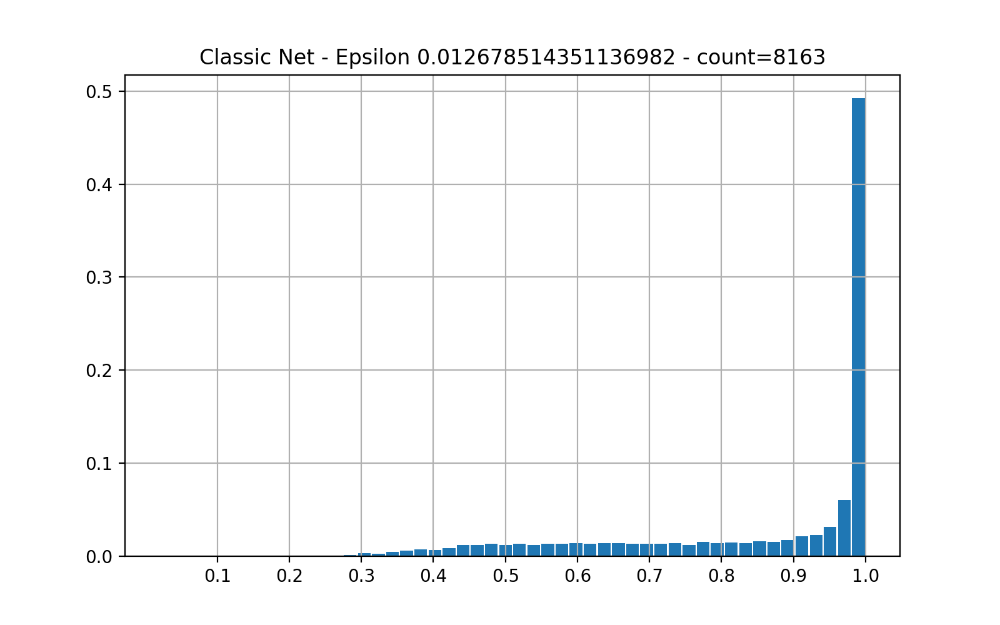

Statistical description of the predictions maximums
DescribeResult(nobs=8163, minmax=(0.24234735004618063902, 0.9998696784334175243), mean=0.8580919953165902582, variance=0.037384000194825769684, skewness=-1.2283772063002665578, kurtosis=0.18209235170406492372)

percentage of confident predictions (>=0.5): 0.9142472130344236

Sample predictions
index 1146 prediction [0.   0.02 0.06 0.04 0.   0.   0.   0.88 0.   0.  ]
index 7510 prediction [0.   0.1  0.46 0.02 0.   0.08 0.01 0.33 0.   0.  ]
index 7210 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 7872 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 7182 prediction [0.   0.12 0.1  0.13 0.   0.57 0.   0.07 0.   0.  ]


<IPython.core.display.Javascript object>


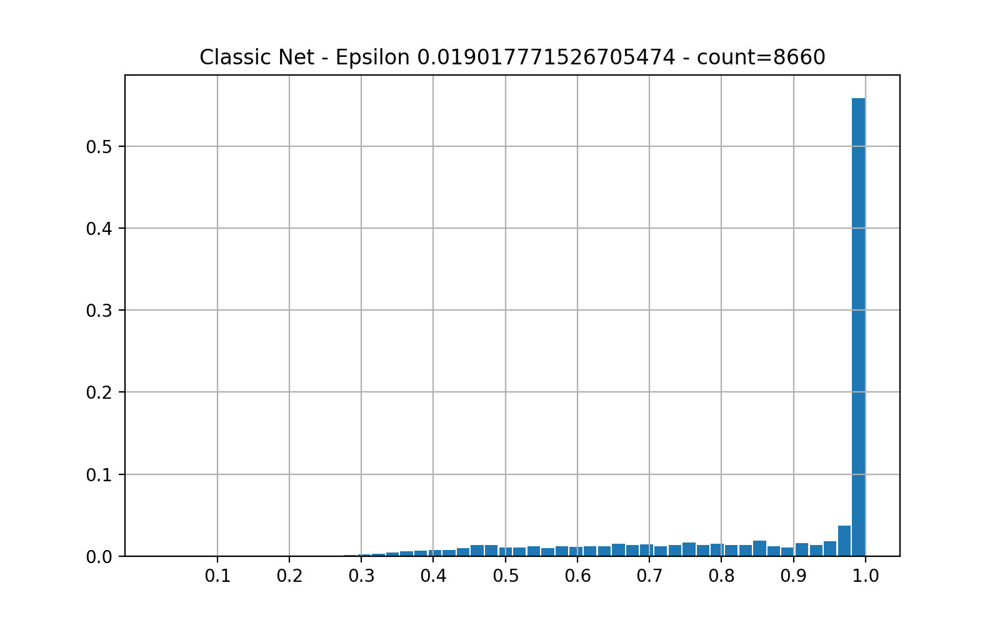

Statistical description of the predictions maximums
DescribeResult(nobs=8660, minmax=(0.21723399725246096986, 0.9996466356897758355), mean=0.8657111500915062601, variance=0.037145426587808304727, skewness=-1.2944602384869546575, kurtosis=0.37309972690717190013)

percentage of confident predictions (>=0.5): 0.9161662817551963

Sample predictions
index 6923 prediction [0.01 0.   0.   0.   0.   0.   0.   0.   0.99 0.  ]
index 4120 prediction [0.   0.   0.   0.   0.   0.   0.   0.   0.99 0.  ]
index 4340 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 7121 prediction [0.   0.03 0.05 0.02 0.   0.3  0.   0.59 0.   0.01]
index 191 prediction [0.   0.   0.   0.   0.   0.   0.   0.   0.99 0.  ]


<IPython.core.display.Javascript object>


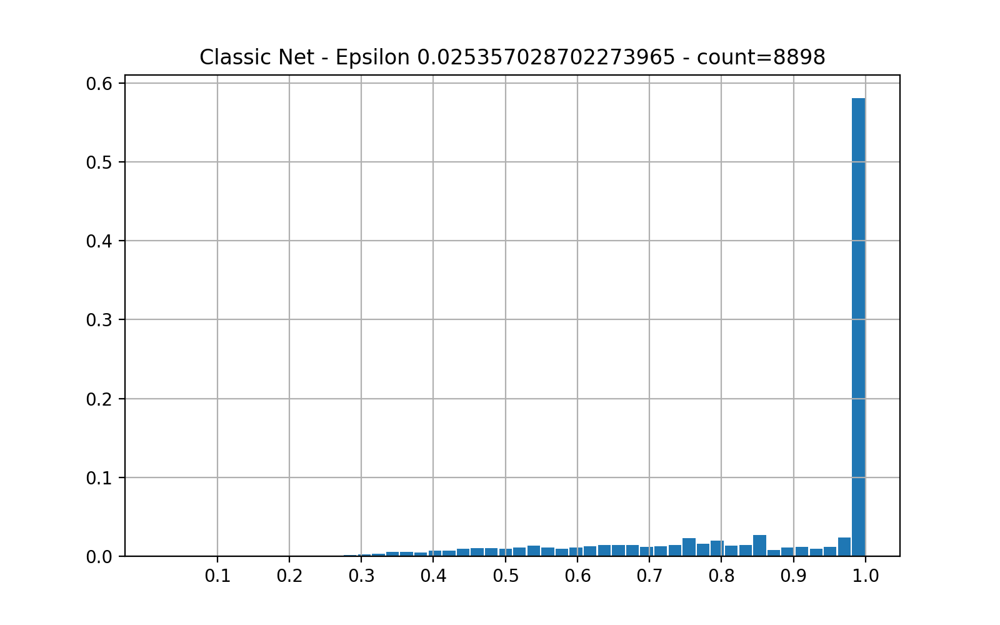

Statistical description of the predictions maximums
DescribeResult(nobs=8898, minmax=(0.2515904224163632132, 0.9997198955052326702), mean=0.8696057199124315215, variance=0.035676699488464048557, skewness=-1.3183477924527690802, kurtosis=0.50287045029452203293)

percentage of confident predictions (>=0.5): 0.9265003371544167

Sample predictions
index 6898 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 1344 prediction [0.   0.   0.   0.01 0.   0.   0.   0.   0.94 0.04]
index 566 prediction [0.   0.06 0.09 0.06 0.   0.1  0.   0.68 0.   0.  ]
index 4865 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 5633 prediction [0.   0.02 0.03 0.04 0.   0.11 0.   0.79 0.   0.  ]


<IPython.core.display.Javascript object>


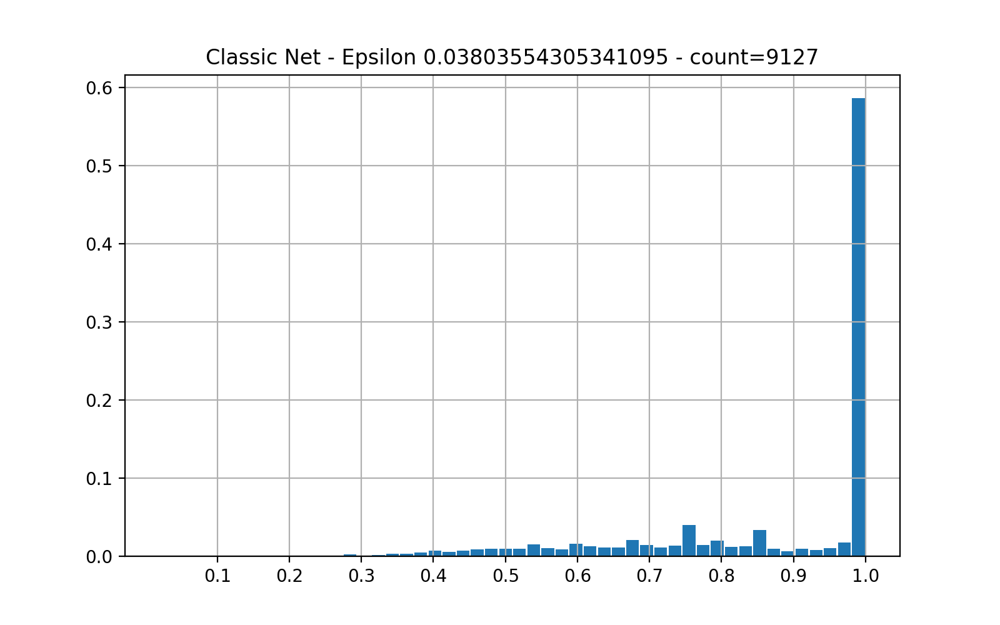

Statistical description of the predictions maximums
DescribeResult(nobs=9127, minmax=(0.23718455251017767215, 0.9998641337177069969), mean=0.8736070970019508841, variance=0.032887835624852128903, skewness=-1.2972791858069630792, kurtosis=0.52301772142957526934)

percentage of confident predictions (>=0.5): 0.9405061904240166

Sample predictions
index 6411 prediction [0.   0.   0.   0.   0.   0.04 0.   0.   0.95 0.  ]
index 4003 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 6808 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 4172 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 4536 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]


<IPython.core.display.Javascript object>


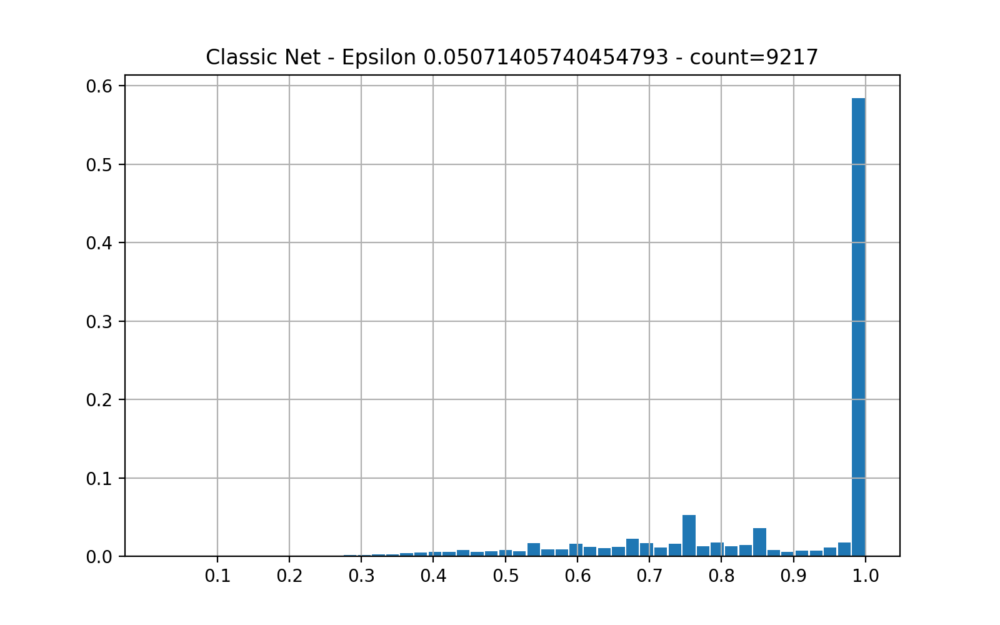

Statistical description of the predictions maximums
DescribeResult(nobs=9217, minmax=(0.24377980376579289194, 0.9997869631367292948), mean=0.875745406961459903, variance=0.031414708975562372343, skewness=-1.3078666404309832063, kurtosis=0.6471386451089075273)

percentage of confident predictions (>=0.5): 0.9469458609091895

Sample predictions
index 5395 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 7119 prediction [0.   0.03 0.06 0.05 0.   0.1  0.   0.75 0.   0.  ]
index 3746 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 5005 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 4958 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]


<IPython.core.display.Javascript object>


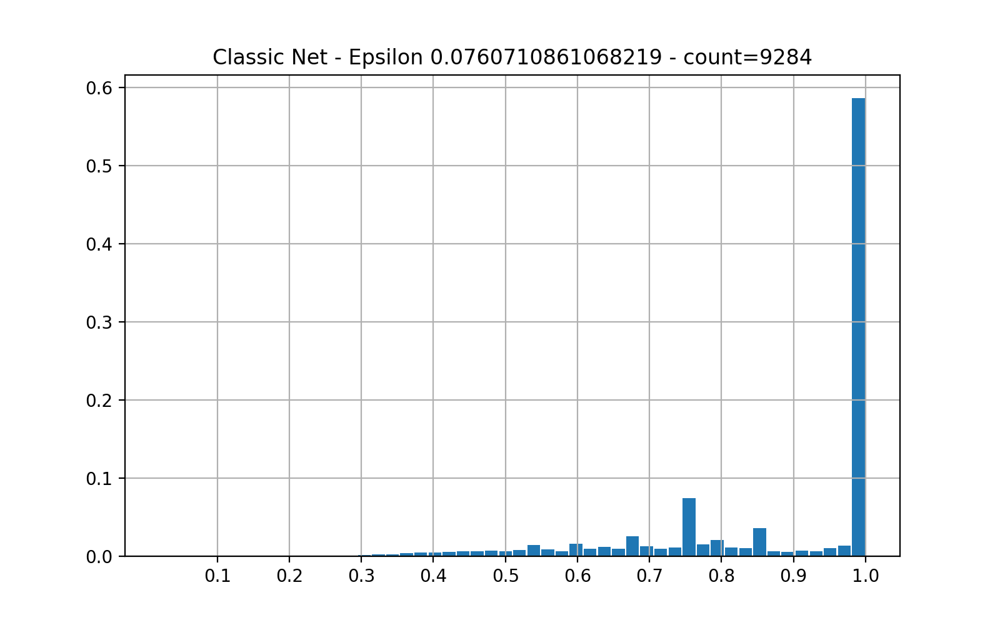

Statistical description of the predictions maximums
DescribeResult(nobs=9284, minmax=(0.21190654876305693077, 0.999862050542549372), mean=0.8764678847576499504, variance=0.030683432545097058307, skewness=-1.3046057742292204838, kurtosis=0.68954268322526926895)

percentage of confident predictions (>=0.5): 0.9493752692804825

Sample predictions
index 7346 prediction [0.05 0.04 0.   0.01 0.02 0.29 0.51 0.   0.09 0.  ]
index 5570 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 4690 prediction [0.   0.03 0.06 0.05 0.   0.1  0.   0.75 0.   0.  ]
index 5943 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 5626 prediction [0.   0.07 0.02 0.08 0.   0.08 0.   0.75 0.   0.  ]


<IPython.core.display.Javascript object>


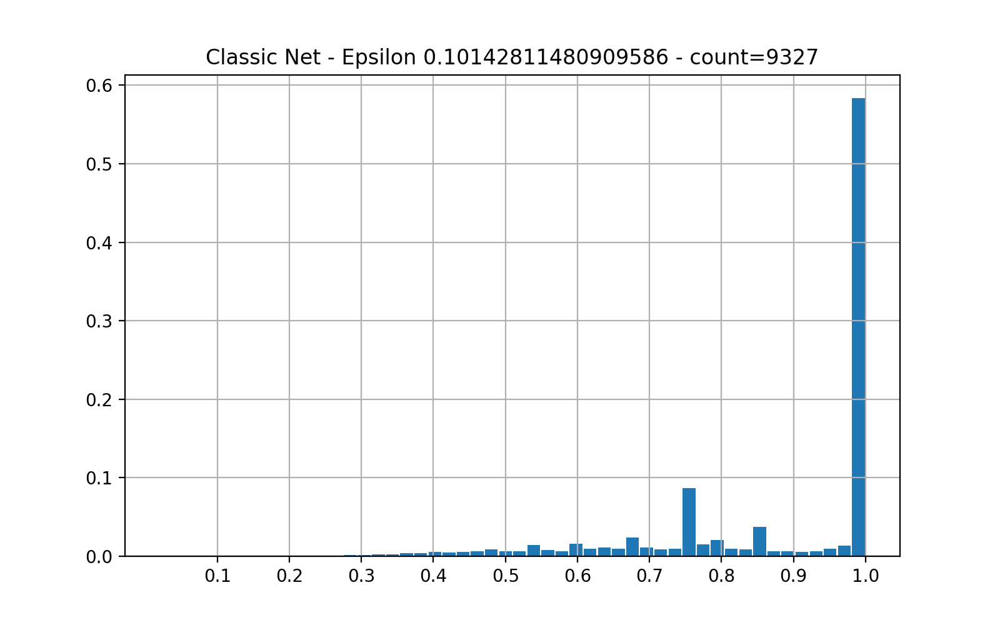

Statistical description of the predictions maximums
DescribeResult(nobs=9327, minmax=(0.2048357617407305321, 0.99986937926560629257), mean=0.87604665250580153295, variance=0.030690311013062304952, skewness=-1.3126304269155528921, kurtosis=0.75851536035514478687)

percentage of confident predictions (>=0.5): 0.948429291304814

Sample predictions
index 6564 prediction [0.   0.   0.   0.06 0.62 0.08 0.18 0.   0.06 0.  ]
index 343 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 5486 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 5147 prediction [0.   0.07 0.02 0.06 0.   0.05 0.   0.8  0.   0.  ]
index 1343 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]


<IPython.core.display.Javascript object>


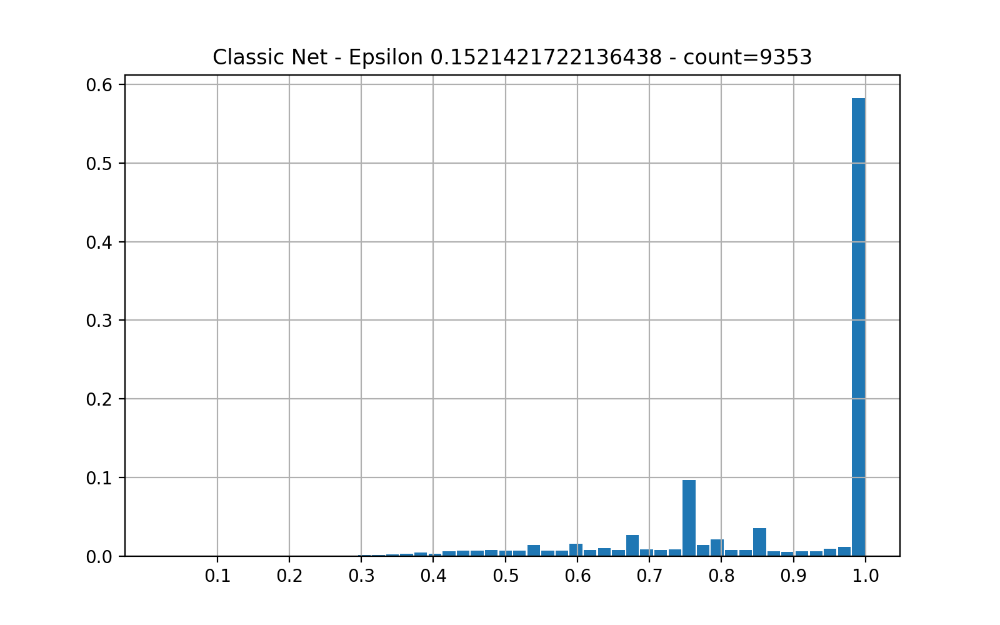

Statistical description of the predictions maximums
DescribeResult(nobs=9353, minmax=(0.2399972664868384006, 0.99986910007578511144), mean=0.8754643733774115304, variance=0.030427570442463029476, skewness=-1.2800745820501610498, kurtosis=0.64777903244101846204)

percentage of confident predictions (>=0.5): 0.949214155885812

Sample predictions
index 9038 prediction [0.   0.03 0.06 0.05 0.   0.1  0.   0.75 0.   0.  ]
index 3474 prediction [0.   0.03 0.06 0.05 0.   0.1  0.   0.75 0.   0.  ]
index 863 prediction [0.   0.15 0.   0.09 0.   0.53 0.16 0.   0.06 0.  ]
index 8494 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 3235 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]


<IPython.core.display.Javascript object>


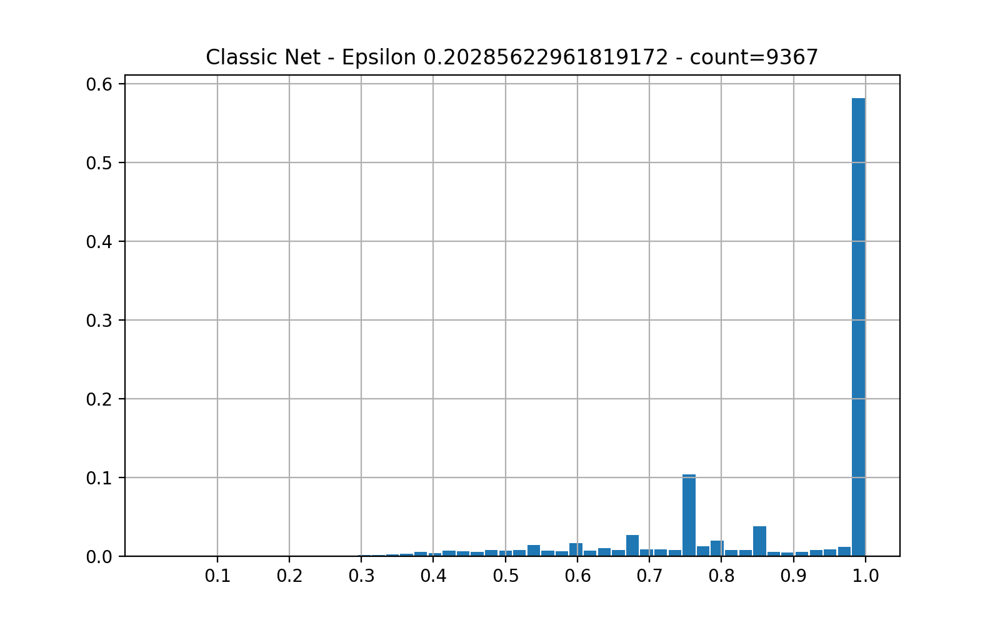

Statistical description of the predictions maximums
DescribeResult(nobs=9367, minmax=(0.22892521729146835208, 0.99986718995263410394), mean=0.87537127026707132874, variance=0.030260120253413125137, skewness=-1.271581189372201436, kurtosis=0.6265441410778887384)

percentage of confident predictions (>=0.5): 0.9496103341518095

Sample predictions
index 38 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 4992 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 1408 prediction [0.   0.03 0.01 0.1  0.   0.02 0.01 0.84 0.   0.  ]
index 8062 prediction [0.   0.03 0.03 0.03 0.   0.05 0.   0.86 0.   0.01]
index 1233 prediction [0.   0.02 0.   0.46 0.06 0.43 0.   0.02 0.   0.  ]


<IPython.core.display.Javascript object>


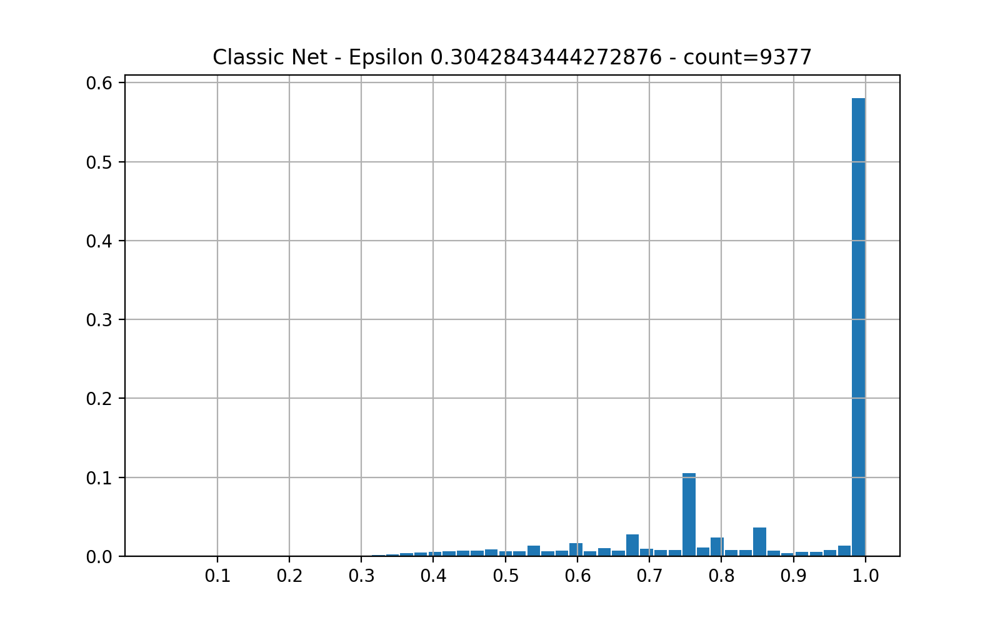

Statistical description of the predictions maximums
DescribeResult(nobs=9377, minmax=(0.21755882933953218167, 0.9998334722998722689), mean=0.875059048555337927, variance=0.030367401794373405604, skewness=-1.2785778819072407142, kurtosis=0.66714831944149094673)

percentage of confident predictions (>=0.5): 0.9467846859336675

Sample predictions
index 4990 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 6677 prediction [0.   0.   0.   0.   0.   0.   0.   0.   0.99 0.01]
index 5915 prediction [0.   0.01 0.04 0.04 0.   0.01 0.   0.89 0.   0.01]
index 5635 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 3560 prediction [0.   0.03 0.06 0.05 0.   0.1  0.   0.75 0.   0.  ]


<IPython.core.display.Javascript object>


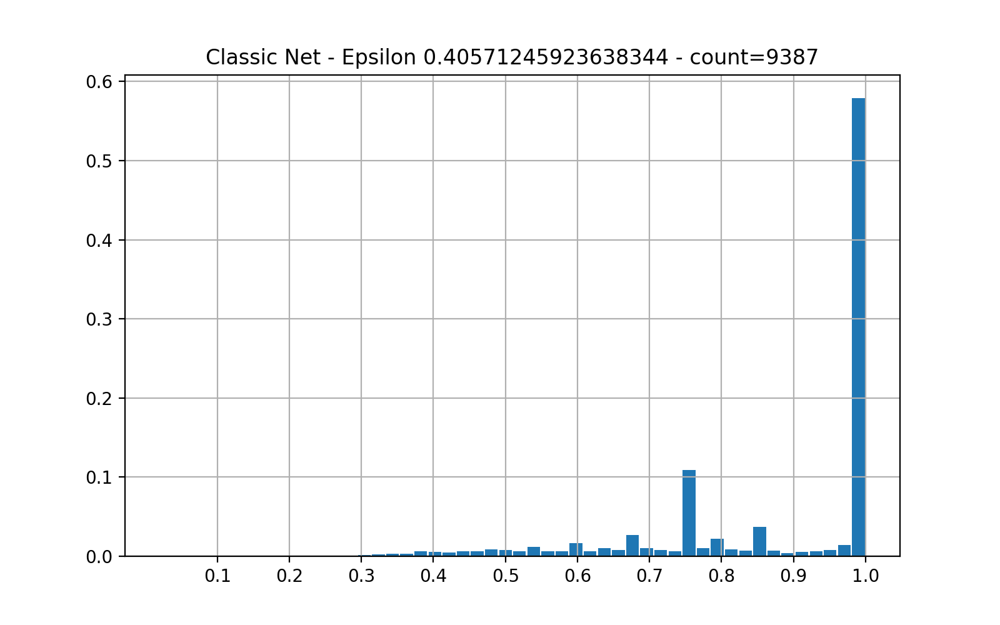

Statistical description of the predictions maximums
DescribeResult(nobs=9387, minmax=(0.21249728793518802415, 0.99976881740742580947), mean=0.8747544641510533945, variance=0.030458966531655704742, skewness=-1.2780446472674956088, kurtosis=0.6647473159744337113)

percentage of confident predictions (>=0.5): 0.9467348460637052

Sample predictions
index 8196 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 1655 prediction [0.03 0.   0.   0.   0.   0.06 0.6  0.   0.31 0.  ]
index 7297 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 8603 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 2600 prediction [0.   0.01 0.13 0.69 0.   0.15 0.01 0.01 0.   0.  ]


<IPython.core.display.Javascript object>


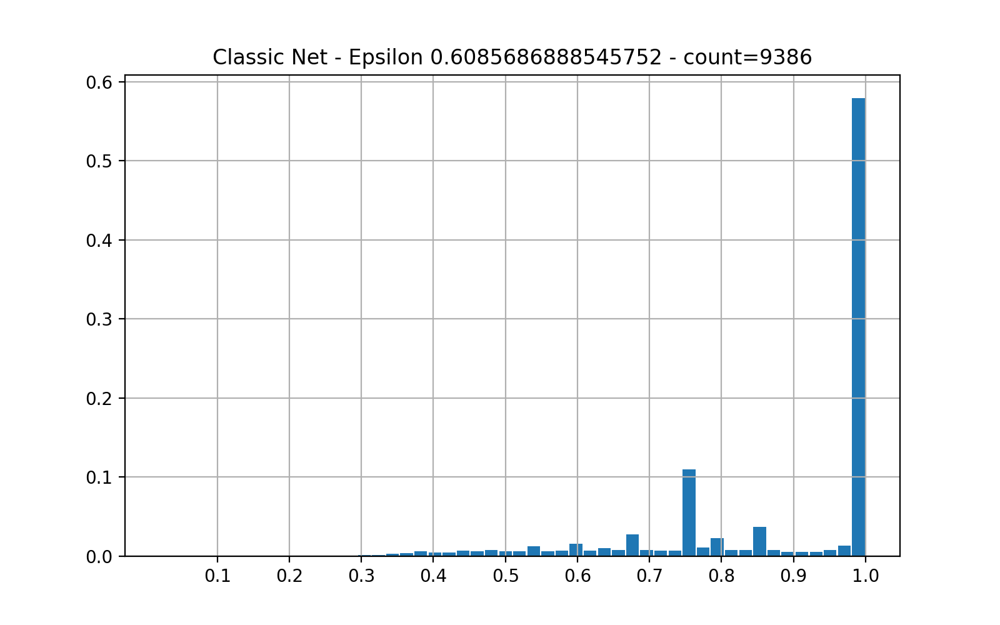

Statistical description of the predictions maximums
DescribeResult(nobs=9386, minmax=(0.2416423828566353983, 0.99970949001864415484), mean=0.87544583386566154085, variance=0.030093097037025388914, skewness=-1.2807364608842161809, kurtosis=0.68157291051545114196)

percentage of confident predictions (>=0.5): 0.9483272959727254

Sample predictions
index 5037 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 7397 prediction [0.   0.07 0.05 0.09 0.   0.1  0.   0.69 0.   0.  ]
index 1416 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 2319 prediction [0.   0.04 0.04 0.06 0.   0.04 0.   0.81 0.   0.  ]
index 7706 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]


<IPython.core.display.Javascript object>


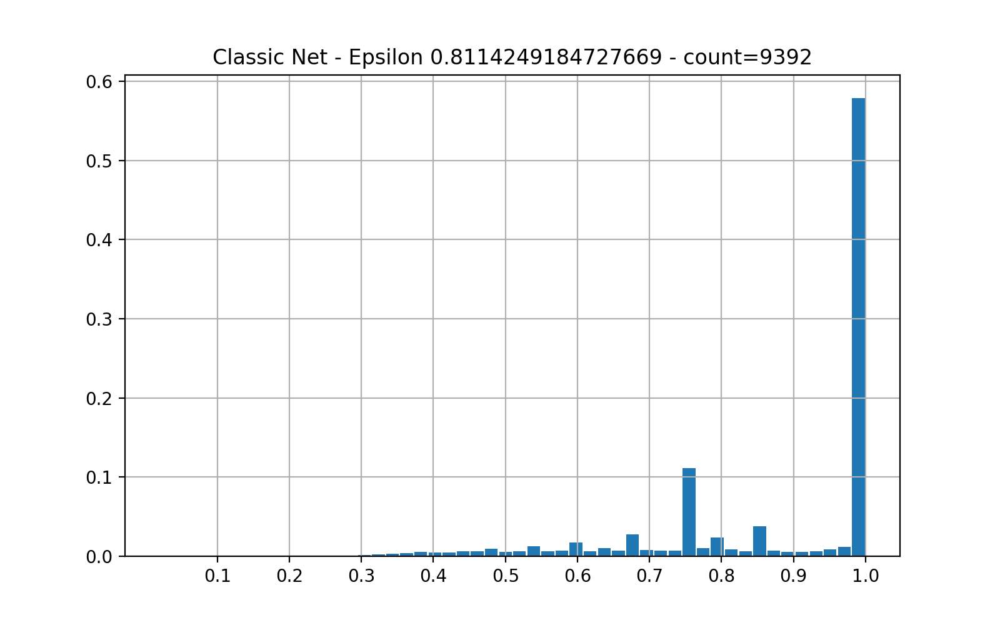

Statistical description of the predictions maximums
DescribeResult(nobs=9392, minmax=(0.2401489941131703215, 0.9995791154130413218), mean=0.8756965236369960792, variance=0.029909906630423214253, skewness=-1.2789354266383225911, kurtosis=0.67889724431423857784)

percentage of confident predictions (>=0.5): 0.9487862010221465

Sample predictions
index 7220 prediction [0.   0.   0.   0.01 0.   0.   0.   0.   0.93 0.06]
index 8585 prediction [0.   0.03 0.02 0.03 0.   0.06 0.   0.85 0.   0.01]
index 410 prediction [0.   0.03 0.05 0.08 0.   0.23 0.   0.6  0.   0.  ]
index 5458 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 7365 prediction [0.   0.16 0.08 0.08 0.   0.14 0.   0.54 0.   0.  ]


<IPython.core.display.Javascript object>


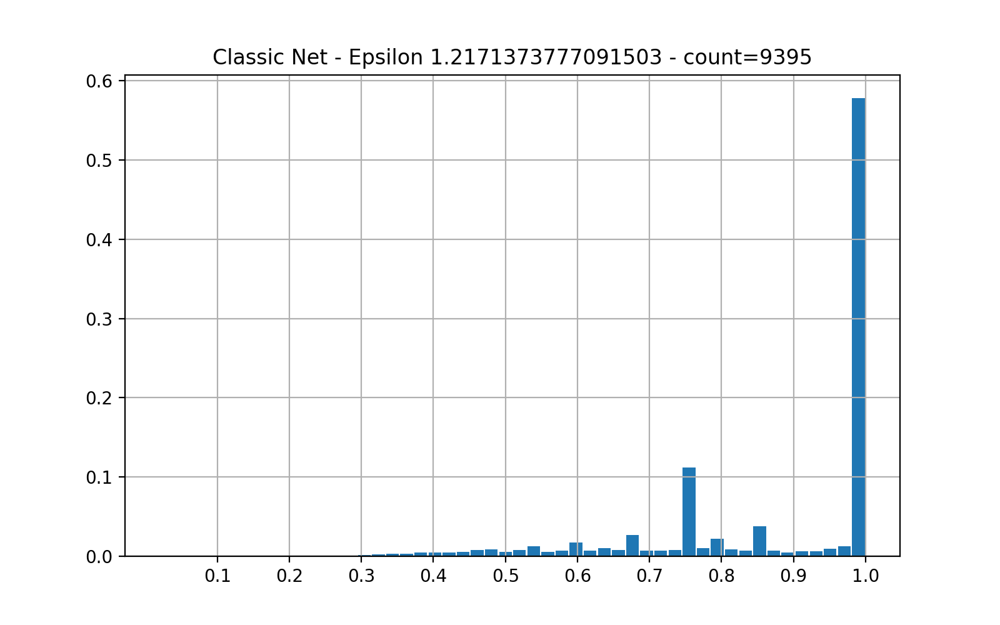

Statistical description of the predictions maximums
DescribeResult(nobs=9395, minmax=(0.2416423828566353983, 0.9995106057663546467), mean=0.8757818333206410624, variance=0.029784302453469422281, skewness=-1.2720552273104890311, kurtosis=0.65373680812436170905)

percentage of confident predictions (>=0.5): 0.9496540713145291

Sample predictions
index 4715 prediction [0.   0.03 0.06 0.05 0.   0.1  0.   0.75 0.   0.  ]
index 1368 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 3961 prediction [0.   0.07 0.01 0.89 0.   0.   0.   0.03 0.   0.01]
index 6561 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 4954 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]


<IPython.core.display.Javascript object>


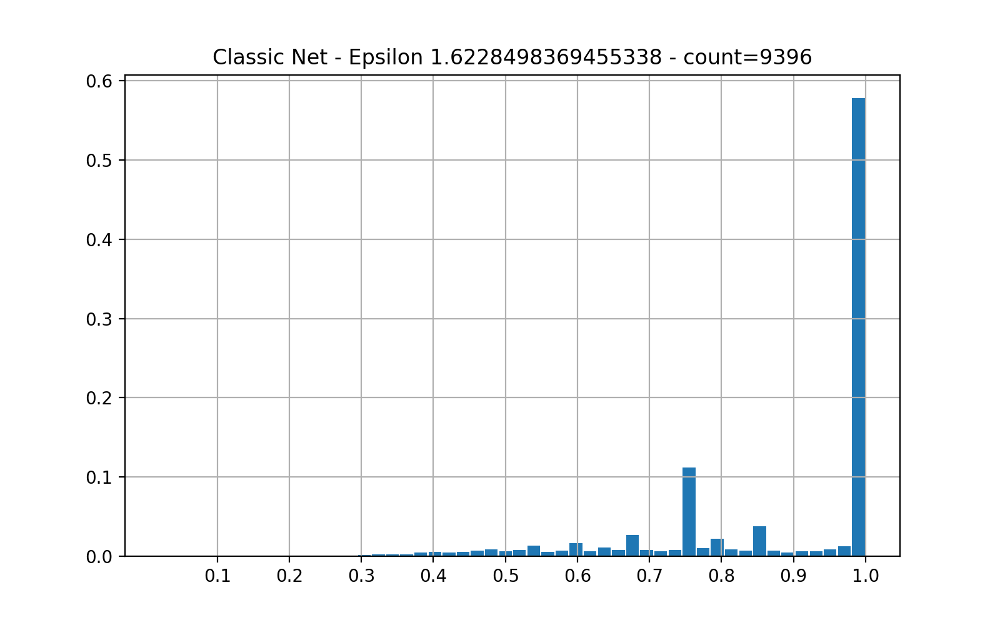

Statistical description of the predictions maximums
DescribeResult(nobs=9396, minmax=(0.2416423828566353983, 0.9995106057663546467), mean=0.8757638731608990615, variance=0.029691506307888222992, skewness=-1.2640152433207661924, kurtosis=0.622708547374410636)

percentage of confident predictions (>=0.5): 0.9499787143465305

Sample predictions
index 1679 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 8638 prediction [0.01 0.07 0.   0.5  0.   0.04 0.   0.24 0.   0.14]
index 7927 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 2390 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 7637 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]


<IPython.core.display.Javascript object>


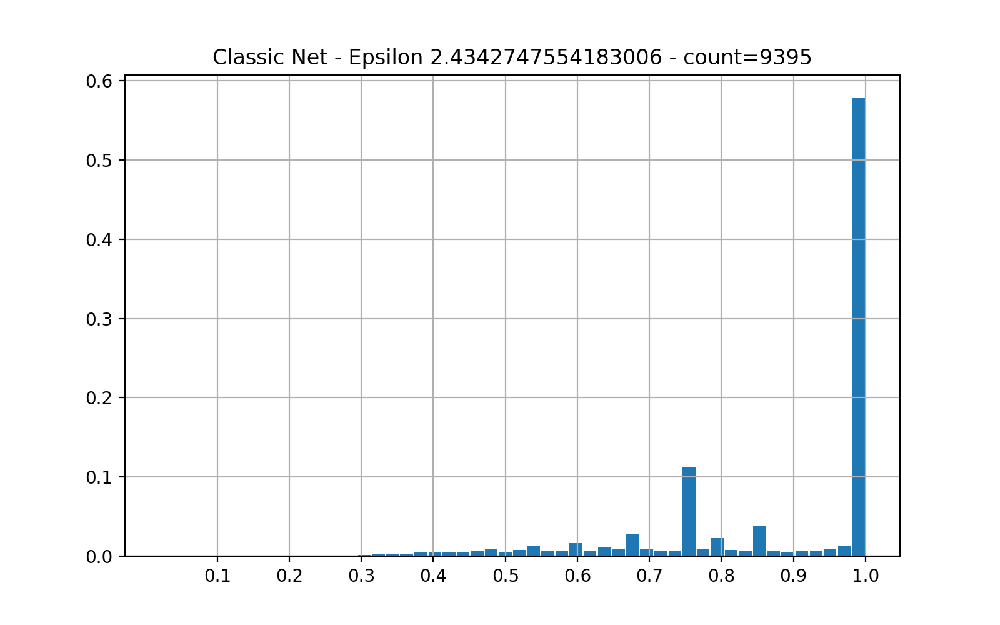

Statistical description of the predictions maximums
DescribeResult(nobs=9395, minmax=(0.22862904268671197637, 0.9995106057663546467), mean=0.8759822725966795068, variance=0.029589211543660459795, skewness=-1.2665730654014446774, kurtosis=0.64215834088087174144)

percentage of confident predictions (>=0.5): 0.9503991484832358

Sample predictions
index 8673 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 4460 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 5614 prediction [0.   0.14 0.04 0.08 0.   0.26 0.   0.47 0.   0.01]
index 6582 prediction [0.   0.01 0.   0.02 0.   0.   0.   0.97 0.   0.01]
index 9190 prediction [0.   0.06 0.02 0.06 0.   0.09 0.   0.76 0.   0.01]


<IPython.core.display.Javascript object>


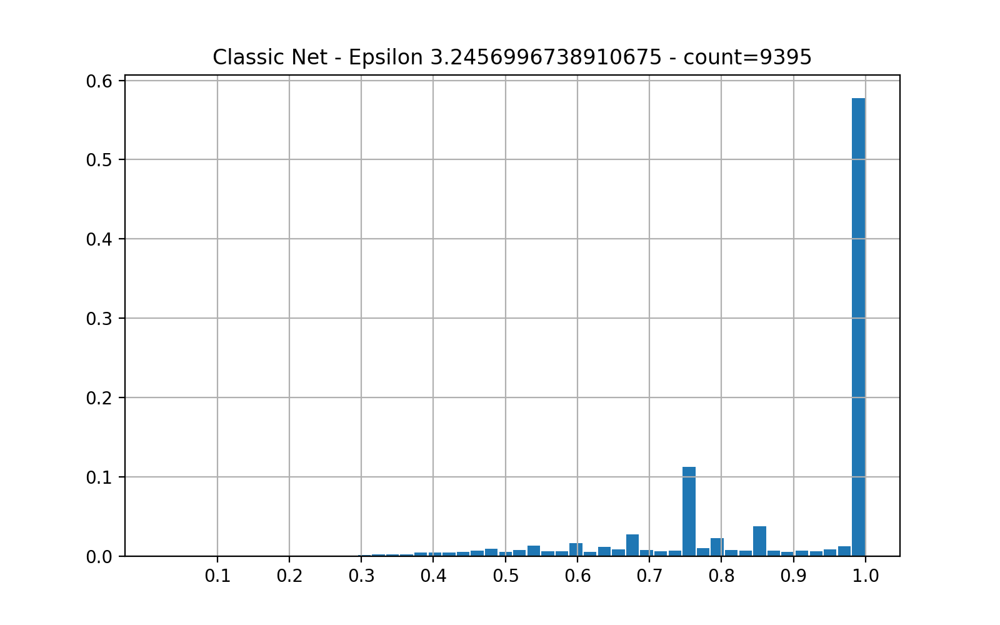

Statistical description of the predictions maximums
DescribeResult(nobs=9395, minmax=(0.22862325577531491341, 0.9995106057663546467), mean=0.8760283150098049014, variance=0.029531344198071698828, skewness=-1.2653247297980488185, kurtosis=0.63886439206015957124)

percentage of confident predictions (>=0.5): 0.9508249068653539

Sample predictions
index 638 prediction [0.   0.   0.   0.   0.   0.01 0.   0.   0.94 0.03]
index 7685 prediction [0.   0.   0.   0.   0.01 0.06 0.05 0.   0.87 0.  ]
index 509 prediction [0. 0. 0. 0. 0. 0. 0. 0. 1. 0.]
index 2260 prediction [0.02 0.   0.   0.   0.   0.   0.01 0.   0.96 0.  ]
index 1944 prediction [0.   0.25 0.06 0.05 0.   0.2  0.   0.43 0.   0.01]


In [43]:
# rerun the classic model on adv examples
for i ,classic_raw_images in enumerate(classic_raw_successful):
    # turn to dataloader
    dl =  torch.utils.data.DataLoader(torch.utils.data.TensorDataset(classic_raw_images))
    t = 'Classic Net - Epsilon {} - count={}'.format(epsilons[i], len(dl))
    fgnh.plot_pred_histogram(classic_model, dl, title=t, verbose=True)

<IPython.core.display.Javascript object>


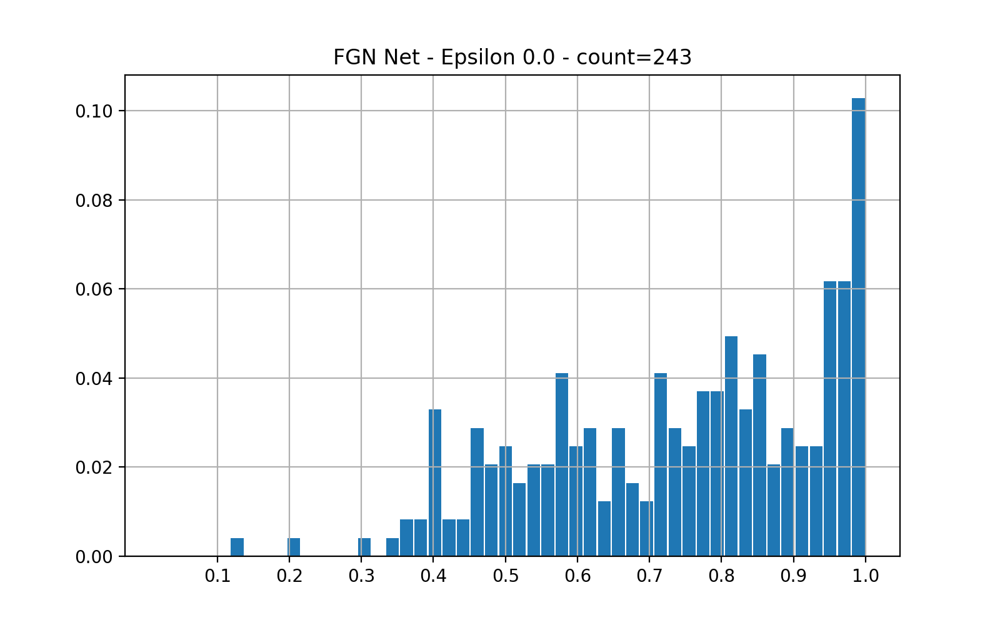

Statistical description of the predictions maximums
DescribeResult(nobs=243, minmax=(0.1278283620822914825, 0.9998896555482145453), mean=0.7439788654759911372, variance=0.03811680174748319724, skewness=-0.49364816728419867606, kurtosis=-0.6669432676242308894)

percentage of confident predictions (>=0.5): 0.8518518518518519

Sample predictions
index 182 prediction [0.01 0.   0.02 0.   0.01 0.   0.   0.01 0.   0.96]
index 104 prediction [0.   0.   0.09 0.47 0.02 0.01 0.   0.   0.3  0.11]
index 37 prediction [0.   0.   0.   0.   0.   0.03 0.16 0.   0.79 0.  ]
index 65 prediction [0.   0.   0.   0.05 0.   0.   0.   0.   0.9  0.04]
index 113 prediction [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]


<IPython.core.display.Javascript object>


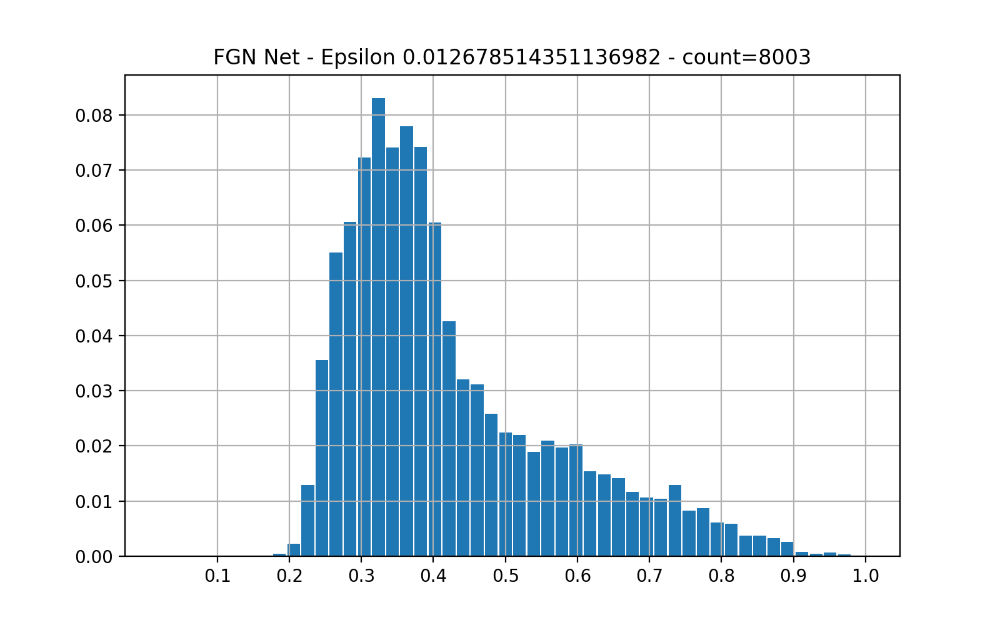

Statistical description of the predictions maximums
DescribeResult(nobs=8003, minmax=(0.12829334344250521401, 0.9749657640679447299), mean=0.42293706220718253766, variance=0.02189047033291983041, skewness=1.1106098522797080099, kurtosis=0.61293482474176906637)

percentage of confident predictions (>=0.5): 0.2490316131450706

Sample predictions
index 4230 prediction [0.07 0.24 0.14 0.05 0.02 0.06 0.03 0.36 0.02 0.02]
index 4127 prediction [0.08 0.   0.02 0.   0.47 0.11 0.23 0.07 0.01 0.01]
index 4820 prediction [0.01 0.08 0.22 0.25 0.02 0.07 0.05 0.26 0.03 0.01]
index 7418 prediction [0.11 0.28 0.17 0.03 0.01 0.1  0.02 0.26 0.01 0.01]
index 2313 prediction [0.01 0.05 0.16 0.29 0.02 0.06 0.03 0.35 0.02 0.01]


<IPython.core.display.Javascript object>


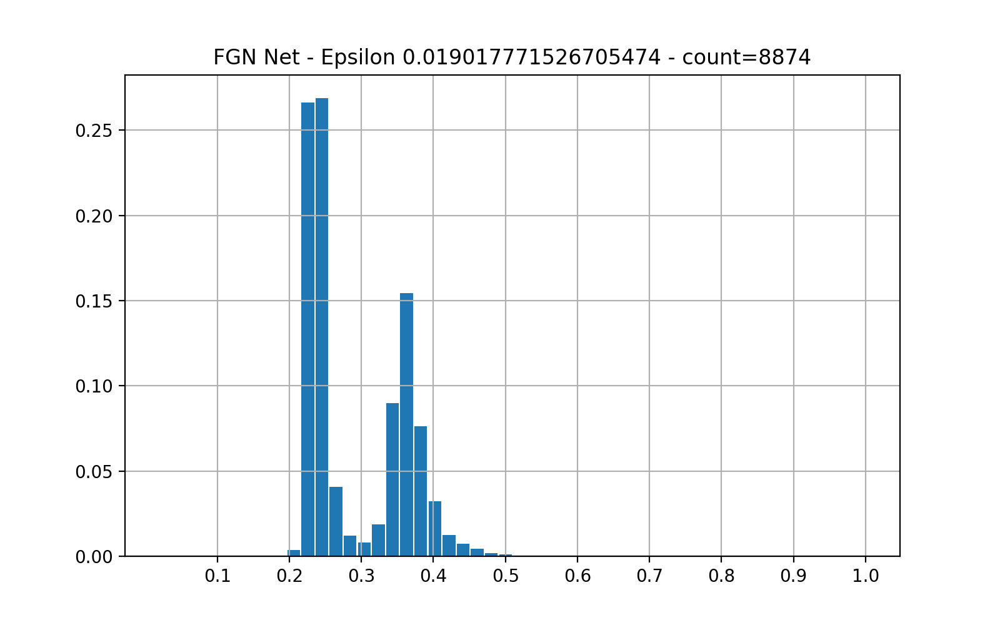

Statistical description of the predictions maximums
DescribeResult(nobs=8874, minmax=(0.12770103441185061746, 0.5611177549228595292), mean=0.29110155835465274305, variance=0.004520083220173039546, skewness=0.60494180186889005927, kurtosis=-1.0049675416562886529)

percentage of confident predictions (>=0.5): 0.0014649537976109985

Sample predictions
index 431 prediction [0.02 0.13 0.19 0.2  0.02 0.08 0.06 0.24 0.03 0.01]
index 4901 prediction [0.02 0.13 0.19 0.21 0.02 0.08 0.06 0.25 0.03 0.01]
index 5156 prediction [0.05 0.14 0.14 0.1  0.03 0.08 0.02 0.38 0.03 0.03]
index 718 prediction [0.02 0.13 0.2  0.2  0.03 0.08 0.06 0.24 0.03 0.01]
index 6102 prediction [0.06 0.14 0.14 0.1  0.03 0.08 0.02 0.37 0.03 0.03]


<IPython.core.display.Javascript object>


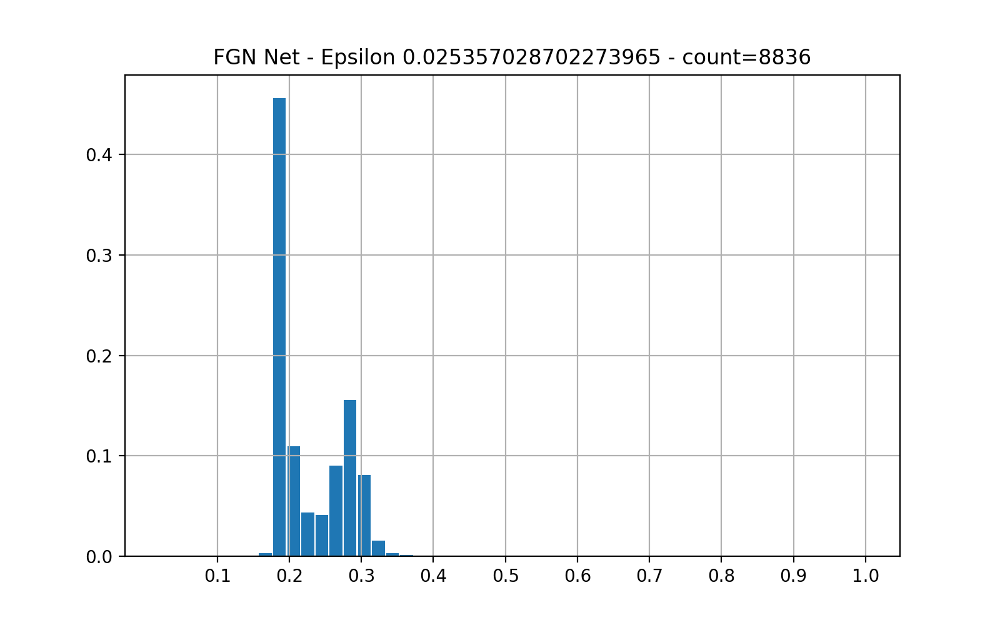

Statistical description of the predictions maximums
DescribeResult(nobs=8836, minmax=(0.12463108587029313592, 0.3685269060444373883), mean=0.22636477879813223692, variance=0.0022116436089978675249, skewness=0.56061129219296789247, kurtosis=-1.2692017049816054341)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 3830 prediction [0.05 0.11 0.15 0.13 0.05 0.1  0.04 0.27 0.06 0.04]
index 3577 prediction [0.03 0.13 0.18 0.17 0.05 0.1  0.07 0.19 0.05 0.03]
index 4996 prediction [0.06 0.12 0.15 0.12 0.04 0.09 0.03 0.33 0.04 0.03]
index 816 prediction [0.05 0.11 0.16 0.13 0.05 0.1  0.04 0.24 0.06 0.05]
index 5991 prediction [0.03 0.13 0.19 0.17 0.05 0.1  0.07 0.19 0.05 0.03]


<IPython.core.display.Javascript object>


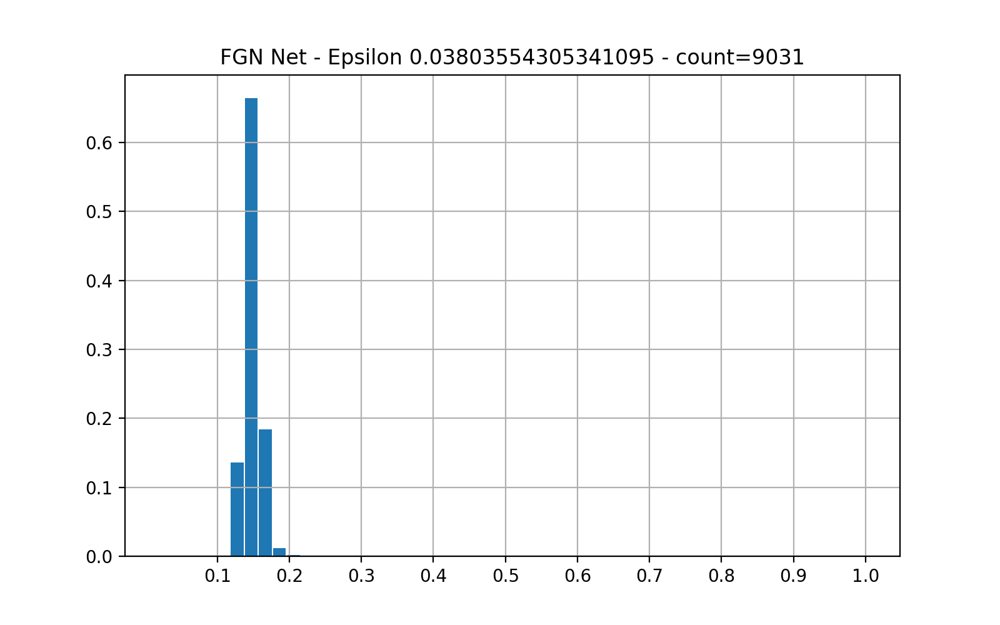

Statistical description of the predictions maximums
DescribeResult(nobs=9031, minmax=(0.11681762921942036051, 0.255402631738155586), mean=0.14787186820551987464, variance=0.000118626740303307435466, skewness=1.2736181187088678804, kurtosis=3.5770292131298512396)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 1527 prediction [0.06 0.11 0.15 0.12 0.08 0.11 0.07 0.14 0.08 0.07]
index 1713 prediction [0.04 0.12 0.17 0.15 0.07 0.1  0.08 0.15 0.07 0.05]
index 3976 prediction [0.06 0.11 0.14 0.12 0.09 0.11 0.09 0.12 0.09 0.08]
index 4859 prediction [0.05 0.11 0.16 0.14 0.08 0.11 0.08 0.14 0.08 0.07]
index 4425 prediction [0.05 0.11 0.15 0.13 0.08 0.11 0.09 0.13 0.08 0.07]


<IPython.core.display.Javascript object>


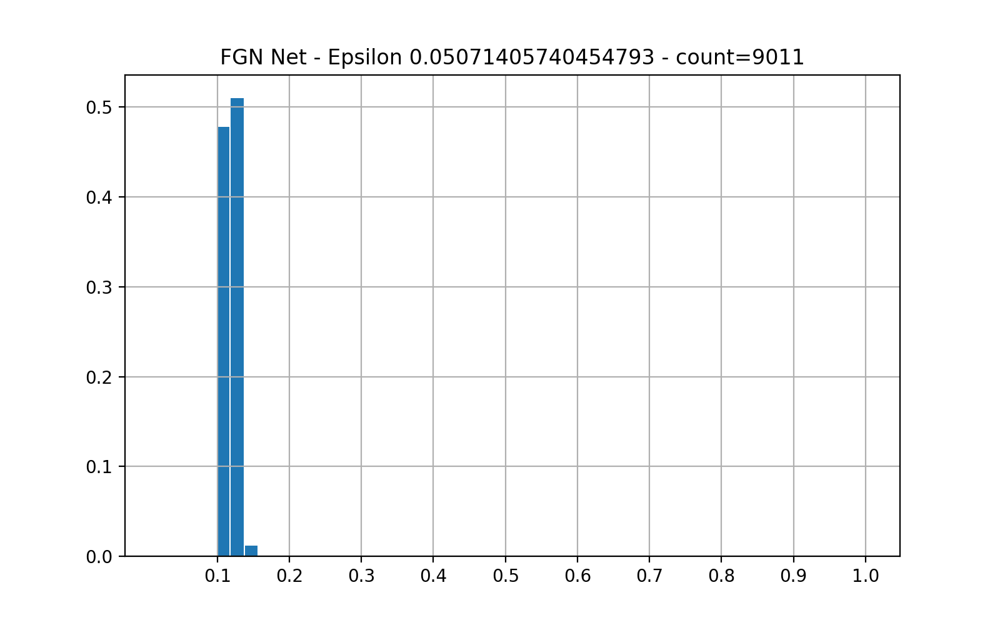

Statistical description of the predictions maximums
DescribeResult(nobs=9011, minmax=(0.107352174383813185394, 0.16869688474331266109), mean=0.120219395444366267626, variance=5.949194707255857481e-05, skewness=0.52718273741254488297, kurtosis=-0.5649465334035101854)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 2428 prediction [0.07 0.1  0.12 0.11 0.1  0.1  0.09 0.11 0.1  0.09]
index 6206 prediction [0.06 0.11 0.14 0.12 0.09 0.11 0.08 0.12 0.09 0.08]
index 572 prediction [0.09 0.1  0.11 0.1  0.1  0.1  0.1  0.1  0.1  0.1 ]
index 3314 prediction [0.07 0.1  0.13 0.12 0.09 0.11 0.09 0.12 0.09 0.09]
index 8904 prediction [0.08 0.1  0.11 0.11 0.1  0.1  0.1  0.1  0.1  0.1 ]


<IPython.core.display.Javascript object>


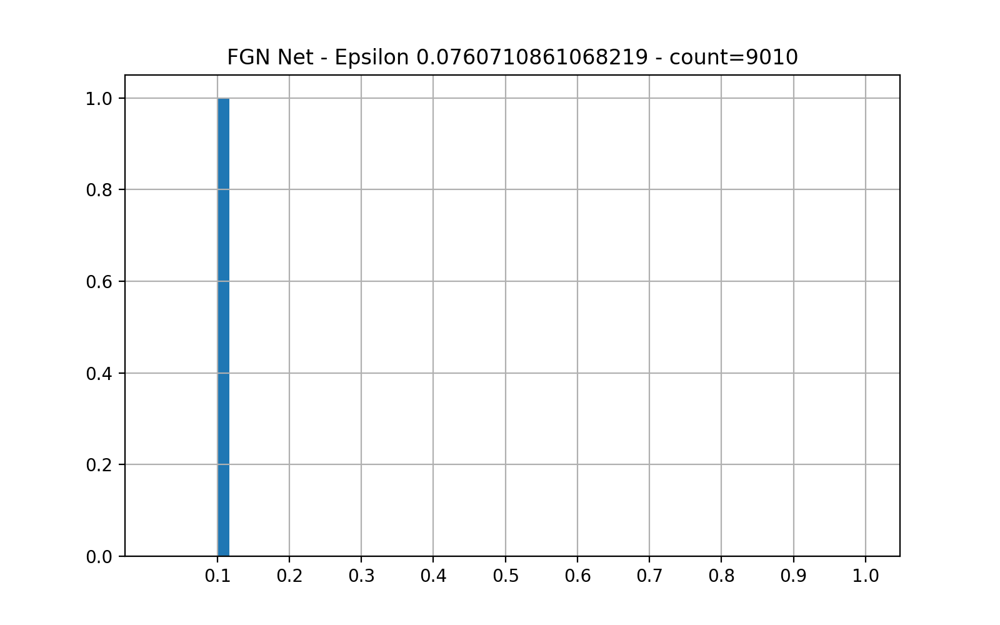

Statistical description of the predictions maximums
DescribeResult(nobs=9010, minmax=(0.10019893499642042608, 0.12592743603542103498), mean=0.10221465885591425648, variance=3.3649005055403526453e-06, skewness=1.5077472409221090994, kurtosis=5.4409852806234827918)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 6399 prediction [0.09 0.1  0.1  0.1  0.1  0.1  0.1  0.1  0.1  0.1 ]
index 6708 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3141 prediction [0.09 0.1  0.1  0.1  0.1  0.1  0.1  0.1  0.1  0.1 ]
index 3378 prediction [0.09 0.1  0.1  0.1  0.1  0.1  0.1  0.1  0.1  0.1 ]
index 6115 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


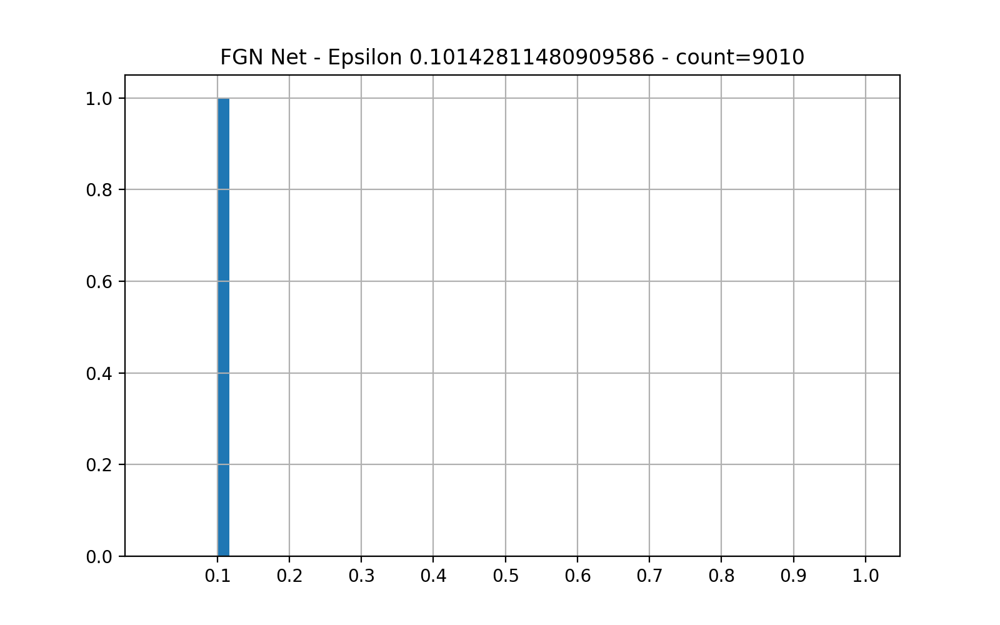

Statistical description of the predictions maximums
DescribeResult(nobs=9010, minmax=(0.1000013107580254892, 0.106869991157986061045), mean=0.100135836230203556995, variance=4.200840589325980322e-08, skewness=7.0356780598992295114, kurtosis=151.39504597974329356)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 865 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4176 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5111 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6657 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 327 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


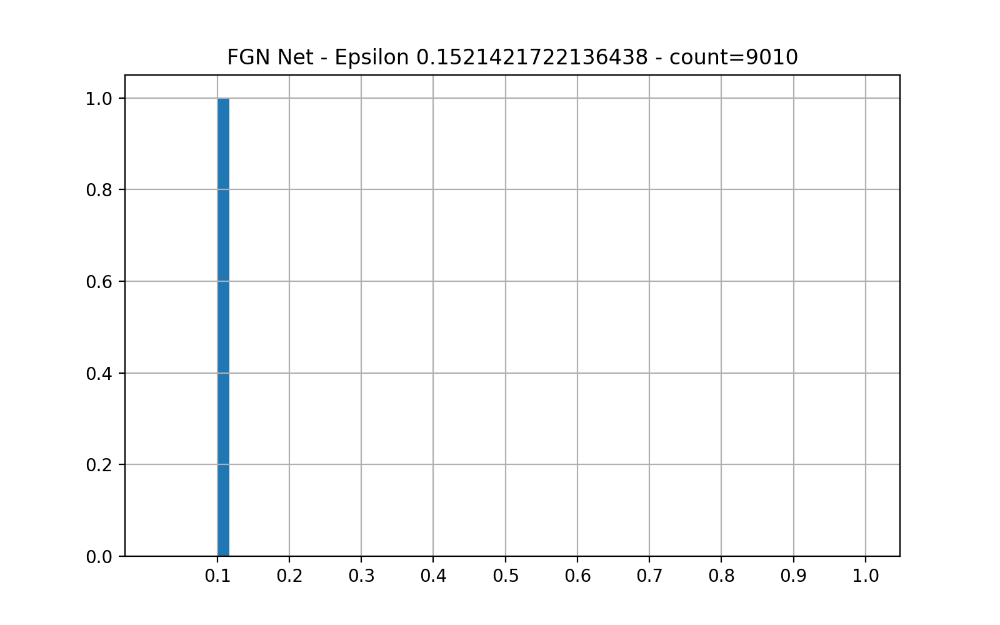

Statistical description of the predictions maximums
DescribeResult(nobs=9010, minmax=(0.10000000000077019755, 0.10017686732083279704), mean=0.100000135302110291854, variance=3.9290425928700647774e-12, skewness=79.697807003578563075, kurtosis=7025.307868397702973)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 5893 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4760 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7892 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1481 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 733 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


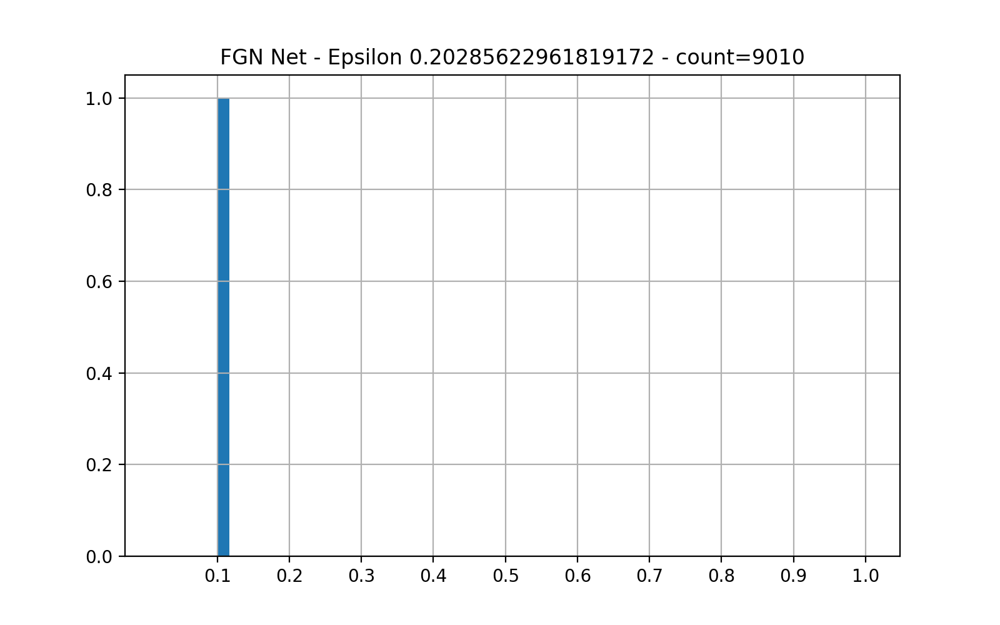

Statistical description of the predictions maximums
DescribeResult(nobs=9010, minmax=(0.1, 0.100001081114387470416), mean=0.10000000015080304894, variance=1.3026030585056890504e-16, skewness=94.32590618291926768, kurtosis=8929.948520846068397)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 3992 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5196 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1224 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7799 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3638 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


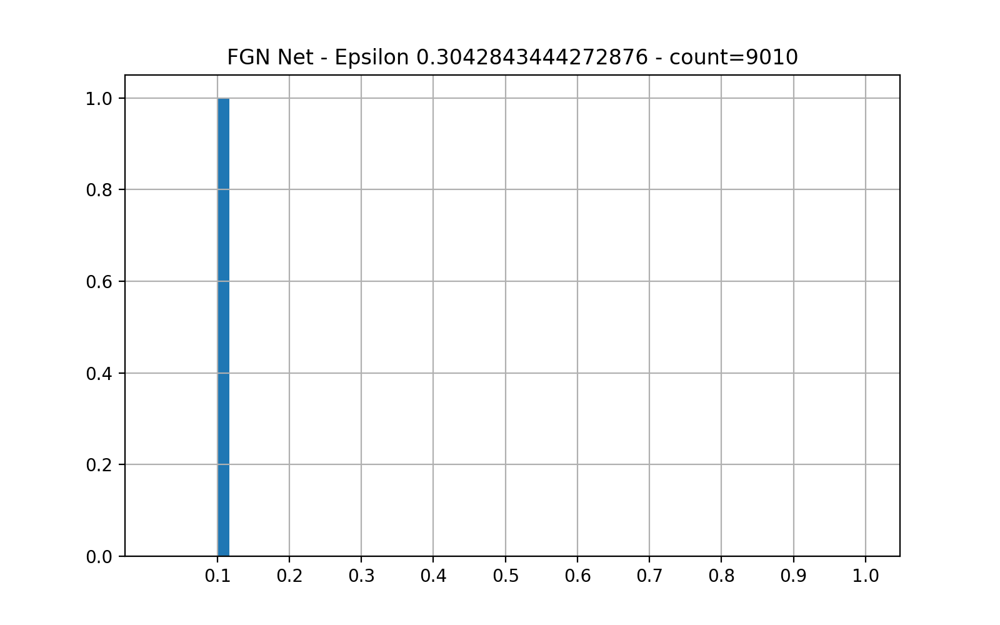

Statistical description of the predictions maximums
DescribeResult(nobs=9010, minmax=(0.1, 0.100000000000510959616), mean=0.10000000000000005683, variance=2.8976695226050882152e-29, skewness=94.9049909288405483, kurtosis=9004.971554295220838)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 8780 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5488 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 330 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4612 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4408 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


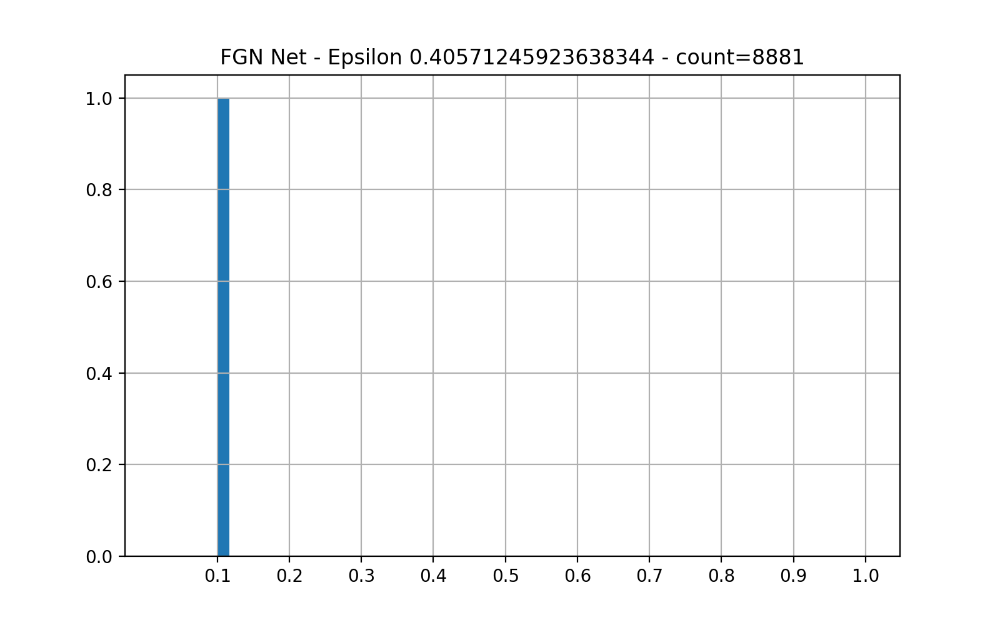

Statistical description of the predictions maximums
DescribeResult(nobs=8881, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.83691675986288277e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 8076 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7611 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1400 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1131 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7871 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


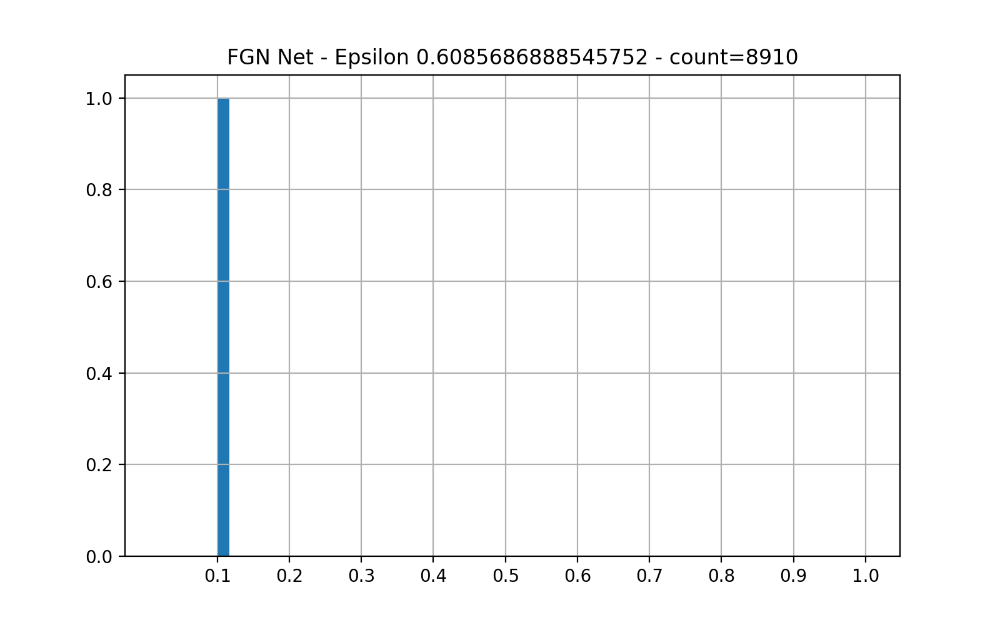

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 1382 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 164 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7188 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8109 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6406 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


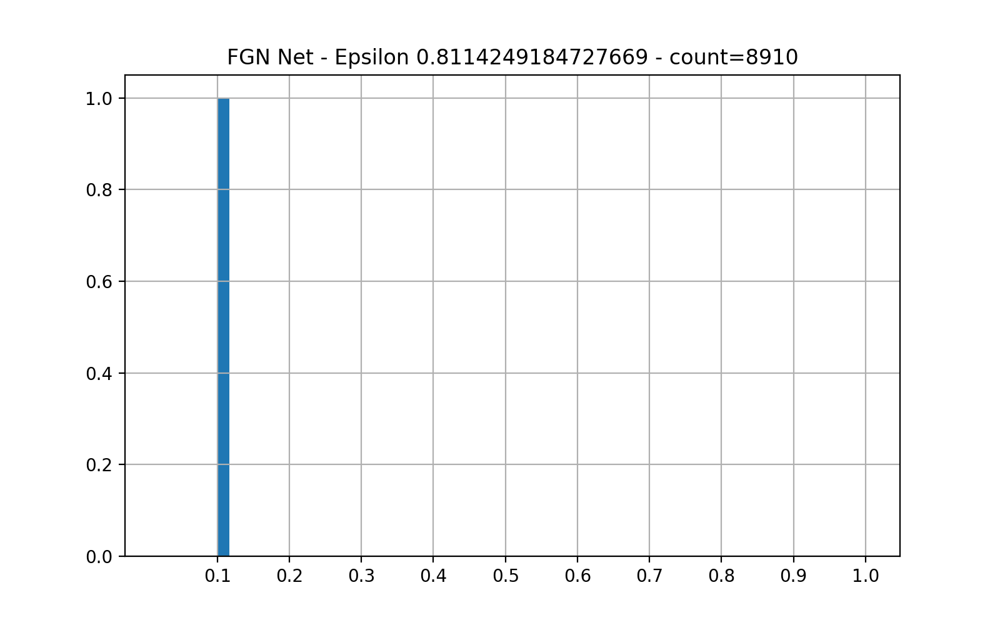

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 6696 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4086 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7563 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7533 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4284 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


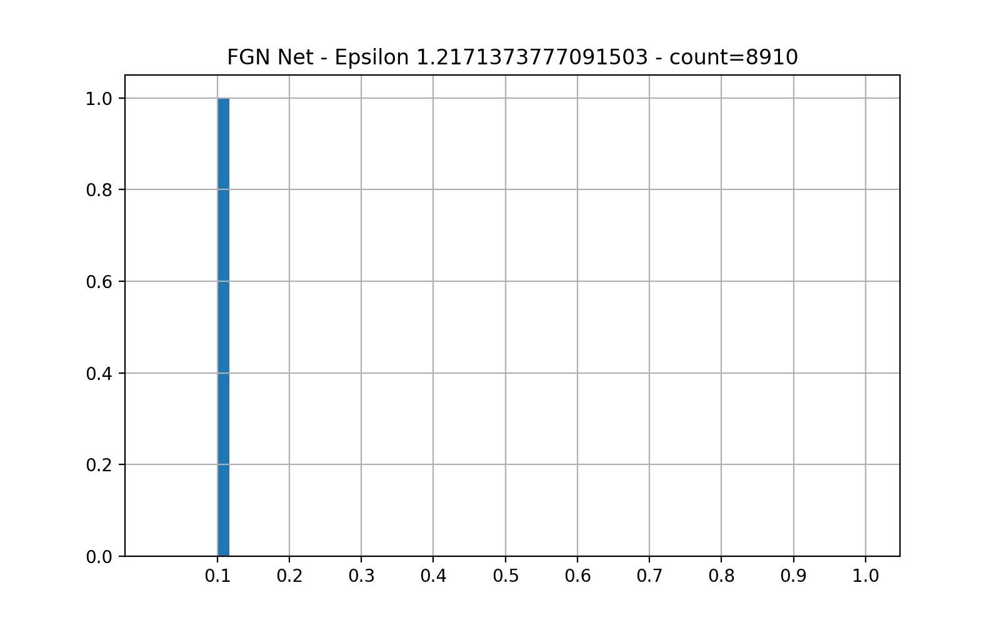

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 2330 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 398 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4976 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7270 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6889 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


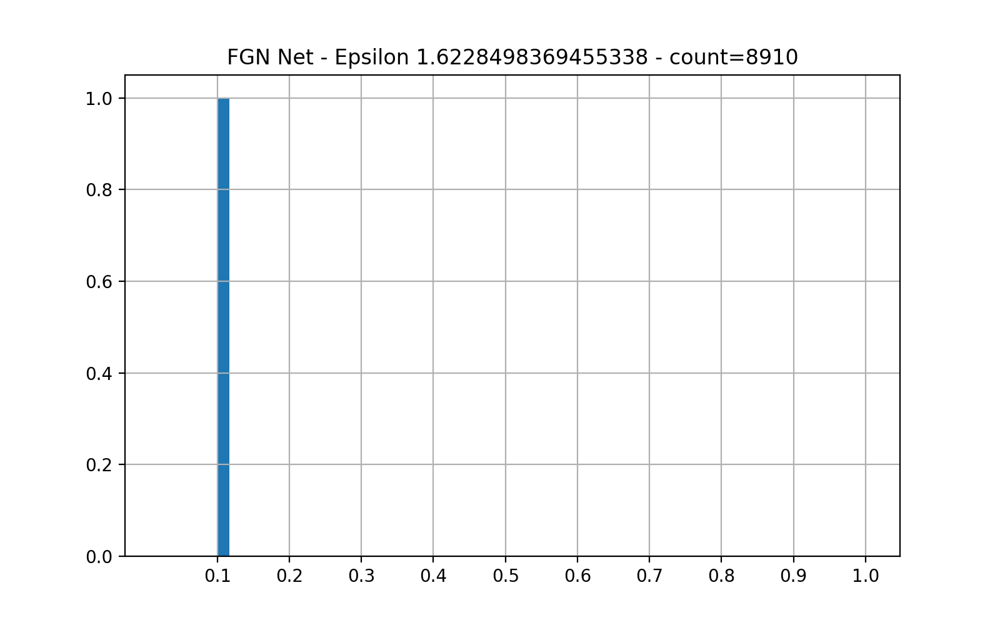

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 485 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6928 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4001 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5225 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5548 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


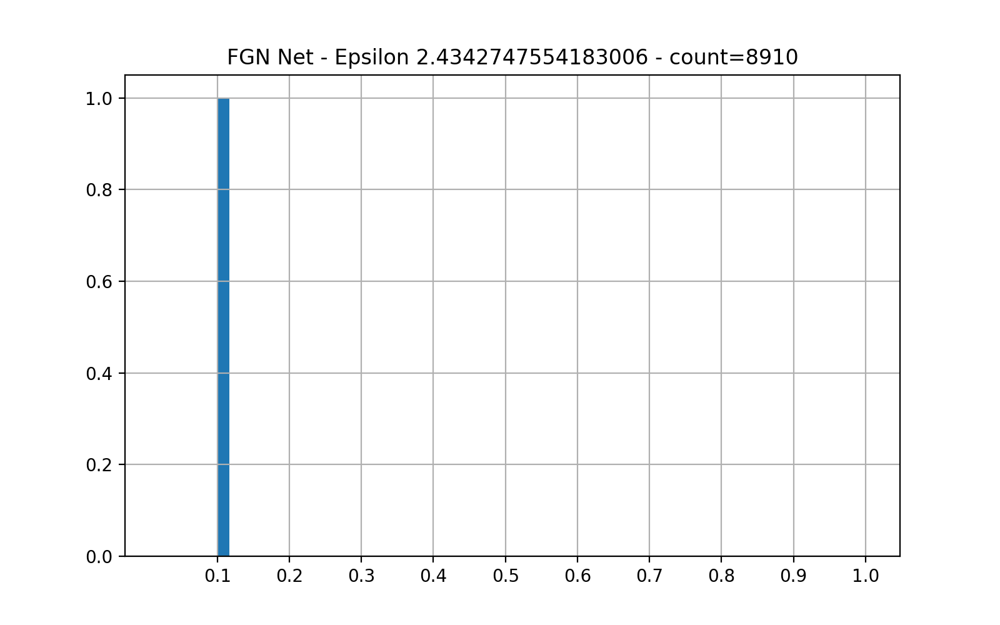

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 1770 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1055 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6180 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1109 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5830 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


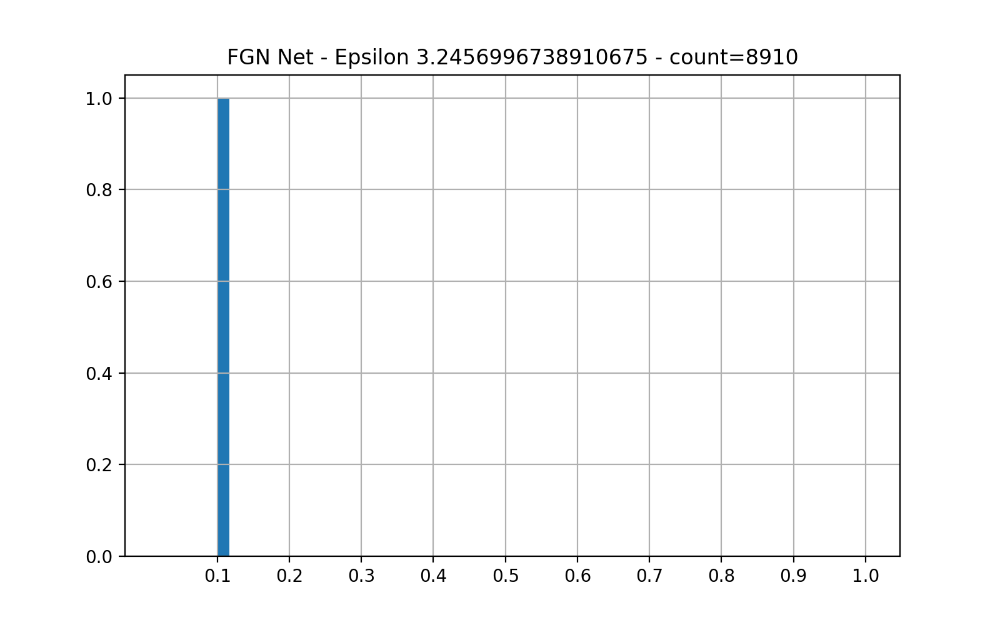

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 7870 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6787 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5970 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 635 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2207 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


In [44]:
# rerun the fgn model on adv examples
for i ,fgn_raw_images in enumerate(fgn_raw_successful):
    # turn to dataloader
    dl =  torch.utils.data.DataLoader(torch.utils.data.TensorDataset(fgn_raw_images))
    t = 'FGN Net - Epsilon {} - count={}'.format(epsilons[i], len(dl))
    fgnh.plot_pred_histogram(fgn_model, dl, title=t, verbose=True)

<IPython.core.display.Javascript object>


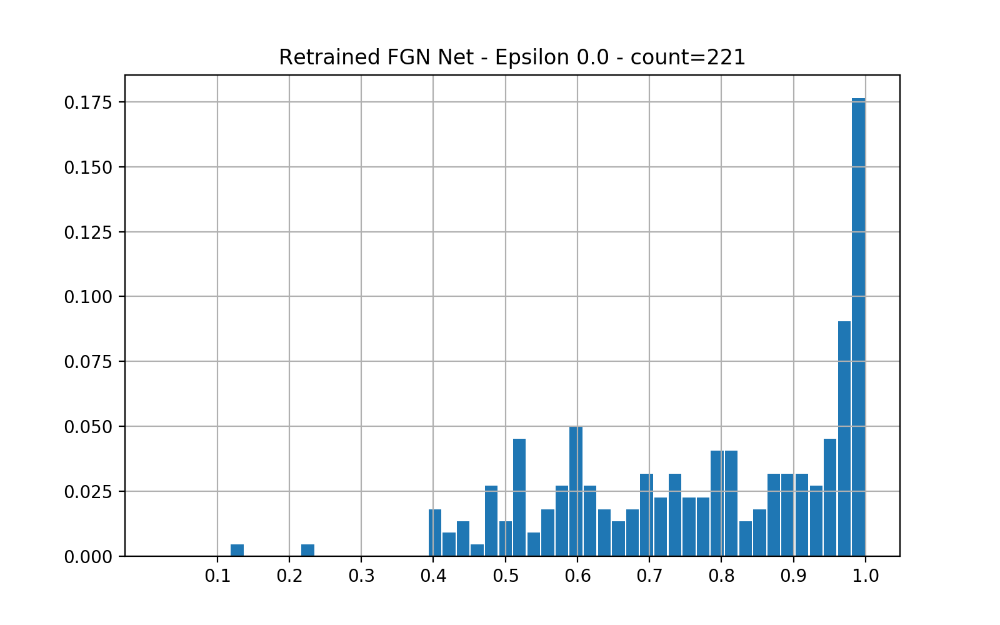

Statistical description of the predictions maximums
DescribeResult(nobs=221, minmax=(0.1340415212765276653, 0.99996062826547299176), mean=0.7780237408133215639, variance=0.036571741799177218405, skewness=-0.5792410632791759497, kurtosis=-0.5600309764448992639)

percentage of confident predictions (>=0.5): 0.9140271493212669

Sample predictions
index 53 prediction [0.   0.   0.   0.04 0.   0.96 0.   0.   0.   0.  ]
index 65 prediction [0.   0.   0.12 0.03 0.   0.   0.   0.   0.85 0.  ]
index 176 prediction [0.   0.   0.   0.01 0.   0.98 0.   0.   0.01 0.  ]
index 163 prediction [0.   0.   0.   0.   0.01 0.   0.   0.   0.   0.99]
index 211 prediction [0.   0.   0.   0.   0.07 0.   0.93 0.   0.   0.  ]


<IPython.core.display.Javascript object>


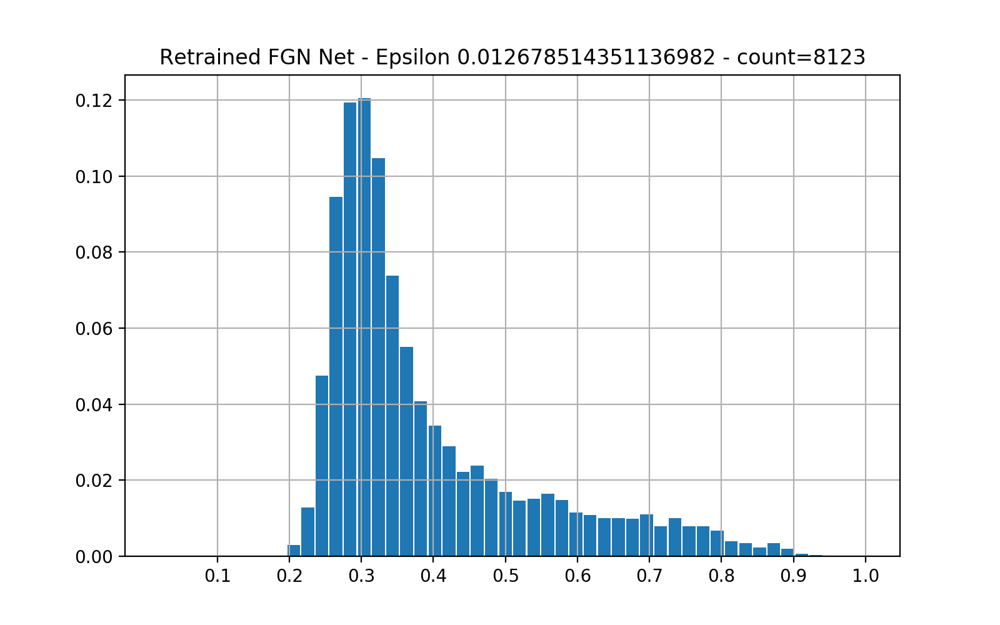

Statistical description of the predictions maximums
DescribeResult(nobs=8123, minmax=(0.13464965349373529347, 0.9726815894214630845), mean=0.38949069851146668142, variance=0.021139629456739453849, skewness=1.4463275276759790898, kurtosis=1.3837285233386168379)

percentage of confident predictions (>=0.5): 0.1893389141942632

Sample predictions
index 3490 prediction [0.01 0.11 0.13 0.26 0.01 0.07 0.05 0.33 0.02 0.01]
index 125 prediction [0.02 0.03 0.03 0.01 0.03 0.01 0.   0.82 0.   0.03]
index 4153 prediction [0.08 0.07 0.03 0.08 0.02 0.09 0.01 0.57 0.02 0.05]
index 4550 prediction [0.01 0.12 0.16 0.26 0.01 0.08 0.06 0.27 0.02 0.01]
index 6681 prediction [0.01 0.09 0.16 0.25 0.02 0.07 0.06 0.32 0.02 0.01]


<IPython.core.display.Javascript object>


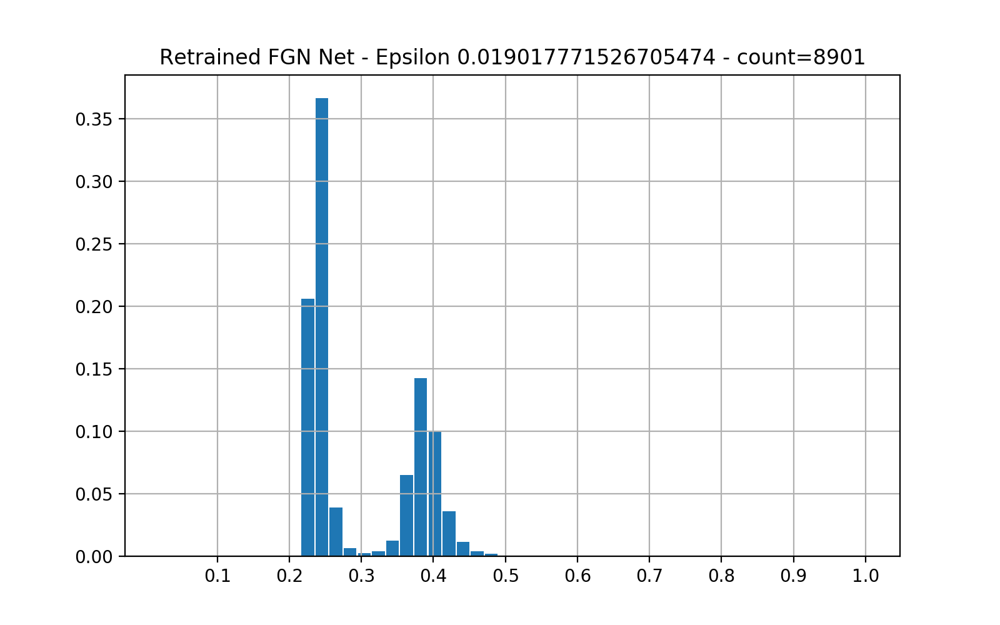

Statistical description of the predictions maximums
DescribeResult(nobs=8901, minmax=(0.13372589488941668767, 0.5614587277609545384), mean=0.29659726106206642842, variance=0.0055549535730982490573, skewness=0.59986576809149418413, kurtosis=-1.3668221449928092795)

percentage of confident predictions (>=0.5): 0.0007864284911807662

Sample predictions
index 8182 prediction [0.01 0.14 0.19 0.2  0.02 0.08 0.07 0.25 0.03 0.01]
index 7253 prediction [0.01 0.14 0.19 0.2  0.03 0.08 0.08 0.24 0.03 0.01]
index 8655 prediction [0.01 0.14 0.19 0.2  0.02 0.08 0.08 0.24 0.03 0.01]
index 2323 prediction [0.01 0.14 0.19 0.2  0.02 0.08 0.08 0.24 0.03 0.01]
index 6155 prediction [0.01 0.14 0.19 0.19 0.03 0.08 0.08 0.23 0.03 0.01]


<IPython.core.display.Javascript object>


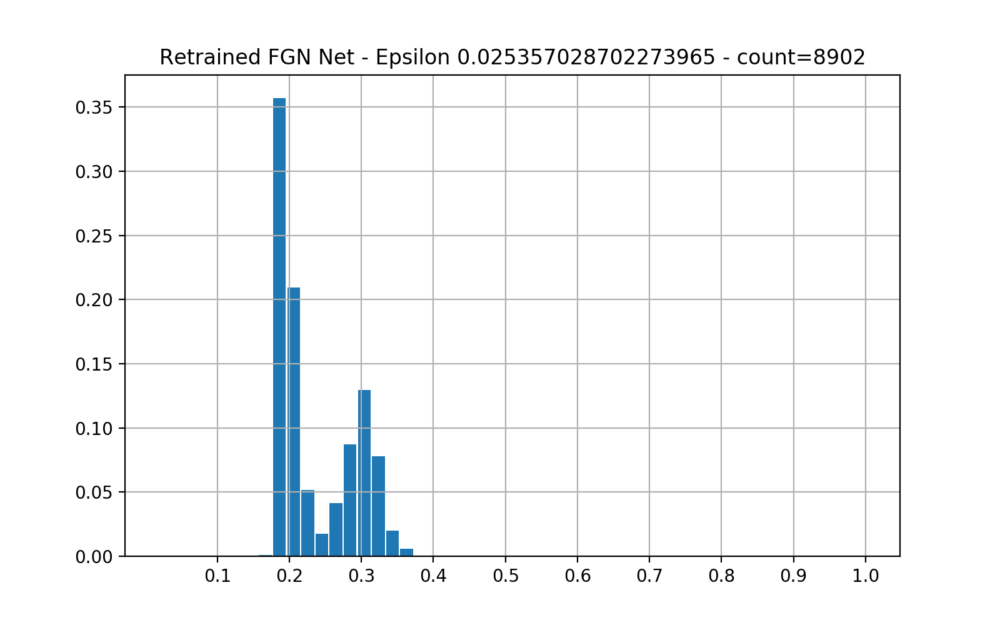

Statistical description of the predictions maximums
DescribeResult(nobs=8902, minmax=(0.13322515659604183046, 0.40370114547092024788), mean=0.23607491515527565425, variance=0.0027959204048035461724, skewness=0.64537599922780654, kurtosis=-1.1884697763757413487)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 6685 prediction [0.01 0.14 0.19 0.19 0.03 0.09 0.08 0.23 0.03 0.01]
index 3166 prediction [0.02 0.13 0.18 0.17 0.05 0.1  0.08 0.19 0.05 0.03]
index 3819 prediction [0.02 0.13 0.18 0.17 0.04 0.1  0.08 0.19 0.05 0.03]
index 609 prediction [0.02 0.13 0.18 0.17 0.05 0.1  0.08 0.19 0.05 0.03]
index 357 prediction [0.05 0.11 0.14 0.12 0.05 0.1  0.04 0.28 0.06 0.04]


<IPython.core.display.Javascript object>


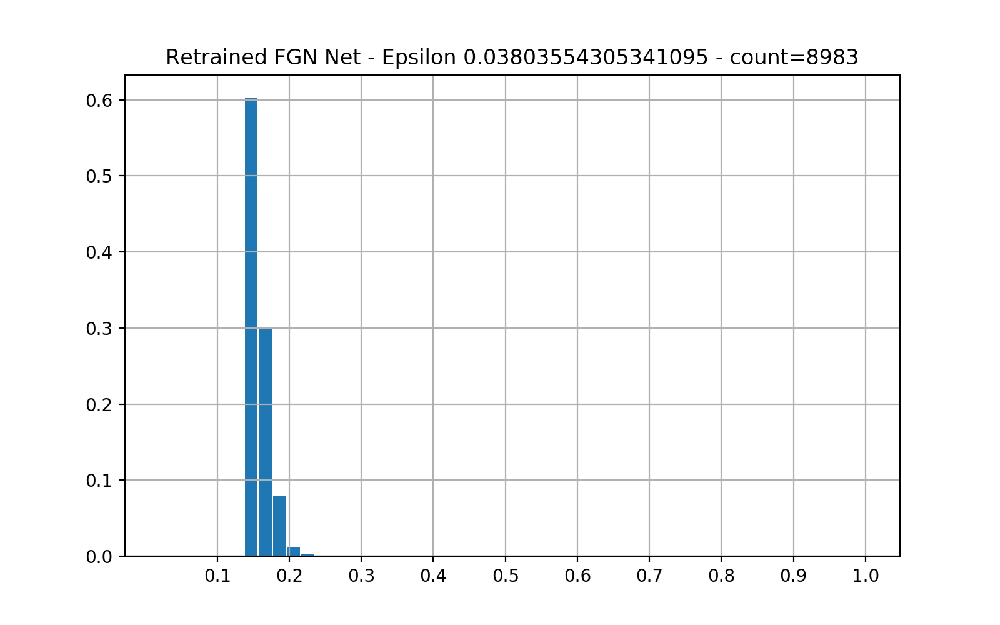

Statistical description of the predictions maximums
DescribeResult(nobs=8983, minmax=(0.12505270705115741889, 0.25533153453514475012), mean=0.1569922428850127828, variance=0.00019070489397580283964, skewness=1.5333616209856965258, kurtosis=3.5447770793392670338)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 8544 prediction [0.05 0.11 0.15 0.13 0.08 0.11 0.09 0.13 0.08 0.07]
index 5179 prediction [0.05 0.11 0.14 0.13 0.09 0.11 0.09 0.12 0.08 0.07]
index 3190 prediction [0.05 0.11 0.15 0.13 0.09 0.11 0.09 0.13 0.08 0.07]
index 8620 prediction [0.05 0.11 0.15 0.13 0.07 0.11 0.06 0.18 0.07 0.06]
index 1680 prediction [0.05 0.11 0.14 0.12 0.09 0.11 0.09 0.12 0.09 0.08]


<IPython.core.display.Javascript object>


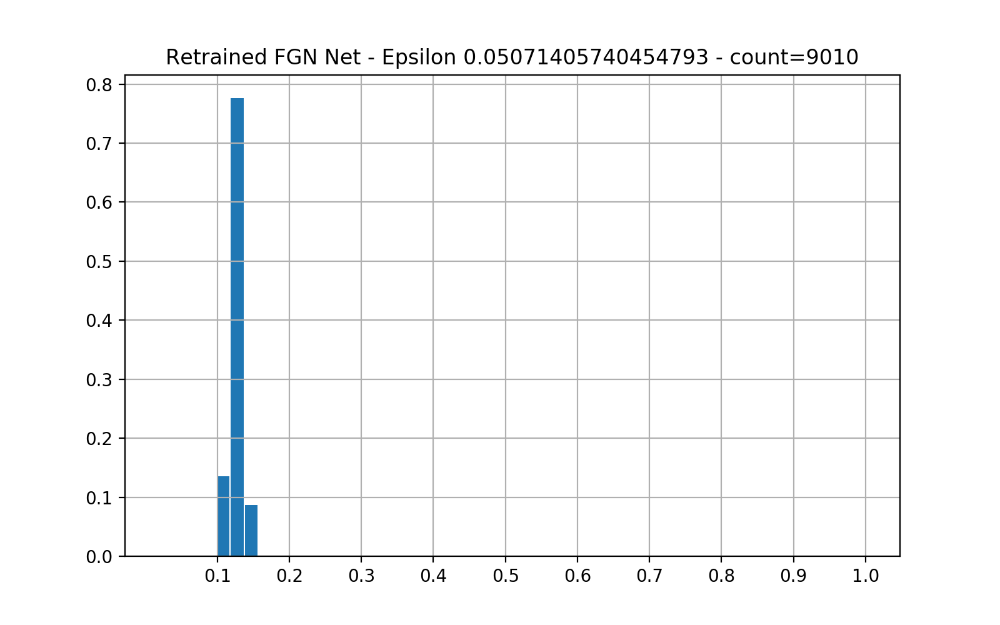

Statistical description of the predictions maximums
DescribeResult(nobs=9010, minmax=(0.11069191968964682868, 0.16622572250850483192), mean=0.12619725798520416759, variance=6.206944044751070737e-05, skewness=0.5020168136573776413, kurtosis=-0.4953652241781624447)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 1409 prediction [0.06 0.11 0.13 0.12 0.09 0.11 0.09 0.12 0.09 0.09]
index 2474 prediction [0.06 0.1  0.13 0.12 0.09 0.11 0.09 0.12 0.09 0.09]
index 2648 prediction [0.06 0.11 0.14 0.12 0.09 0.11 0.08 0.13 0.09 0.08]
index 4014 prediction [0.07 0.1  0.13 0.11 0.1  0.11 0.09 0.11 0.09 0.09]
index 8634 prediction [0.06 0.11 0.14 0.12 0.09 0.11 0.09 0.12 0.09 0.08]


<IPython.core.display.Javascript object>


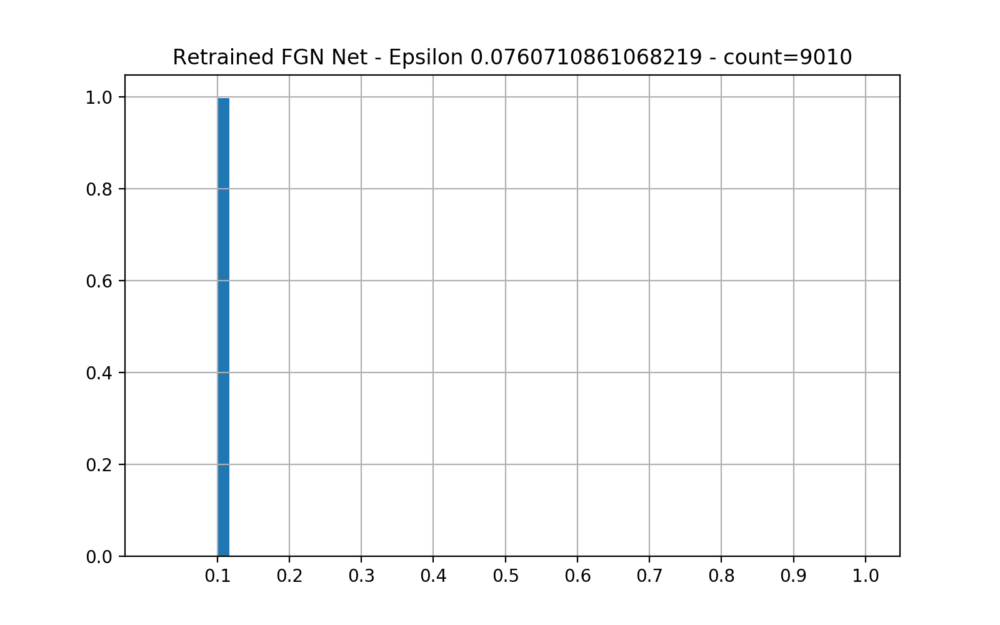

Statistical description of the predictions maximums
DescribeResult(nobs=9010, minmax=(0.100454957806177773616, 0.124703399557676719825), mean=0.10398069613596898784, variance=8.428880437541717169e-06, skewness=1.3300246574210962835, kurtosis=2.4460347784587712309)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 4118 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8684 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4726 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2858 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 594 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


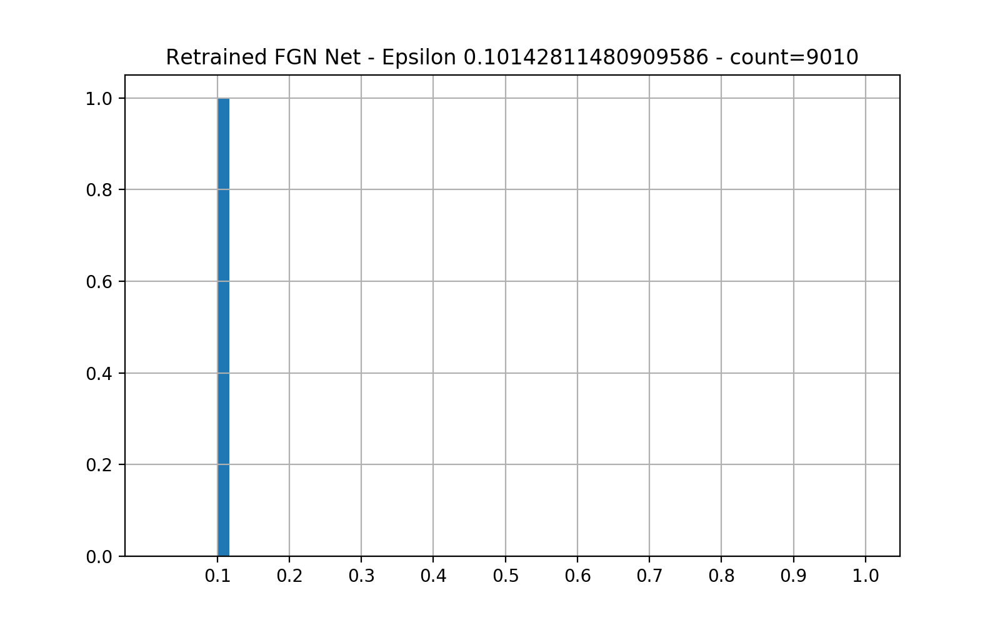

Statistical description of the predictions maximums
DescribeResult(nobs=9010, minmax=(0.100005610815427396135, 0.10638352891228692595), mean=0.10035428020744760778, variance=2.190454967903279924e-07, skewness=3.4016344280366160007, kurtosis=21.965639864519455585)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 1640 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1079 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4938 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4347 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5793 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


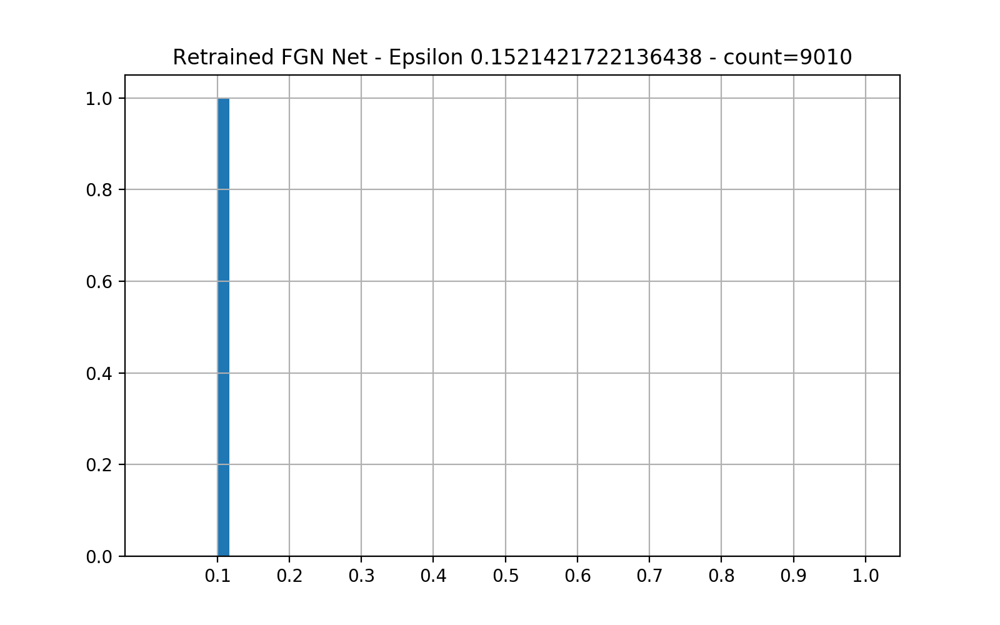

Statistical description of the predictions maximums
DescribeResult(nobs=9010, minmax=(0.10000000001975549025, 0.10014670505898108446), mean=0.10000086405444901243, variance=1.81787673059700101e-11, skewness=18.4704864174255374, kurtosis=465.95821356296018922)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 168 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5733 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3540 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1386 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8918 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


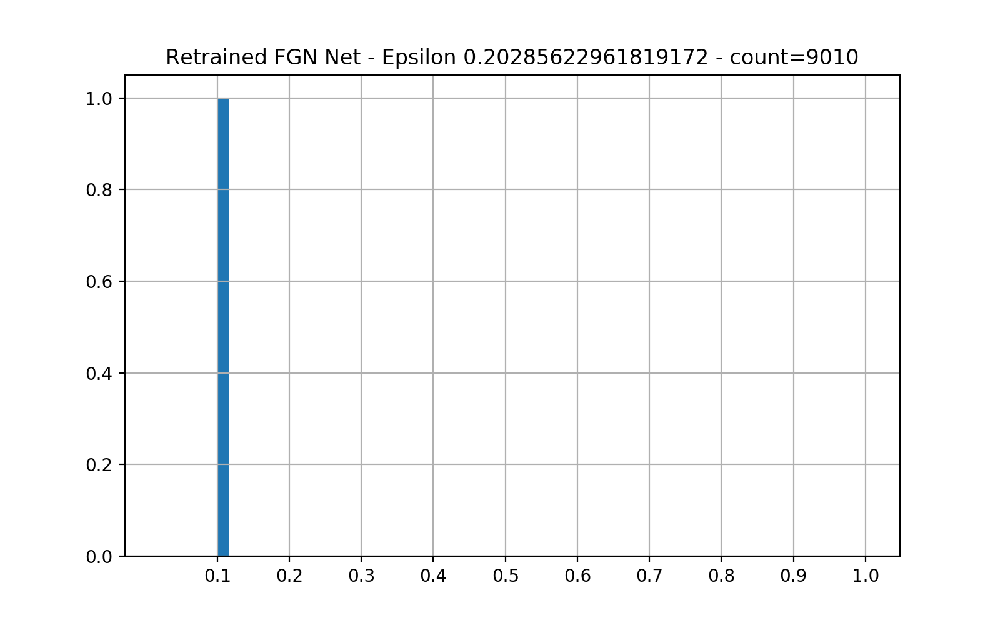

Statistical description of the predictions maximums
DescribeResult(nobs=9010, minmax=(0.10000000000000000046, 0.10000075540300312748), mean=0.10000000084985000927, variance=2.186757339500032173e-16, skewness=35.59103469216222629, kurtosis=1479.1379594839420674)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 975 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5493 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8857 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5619 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 487 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


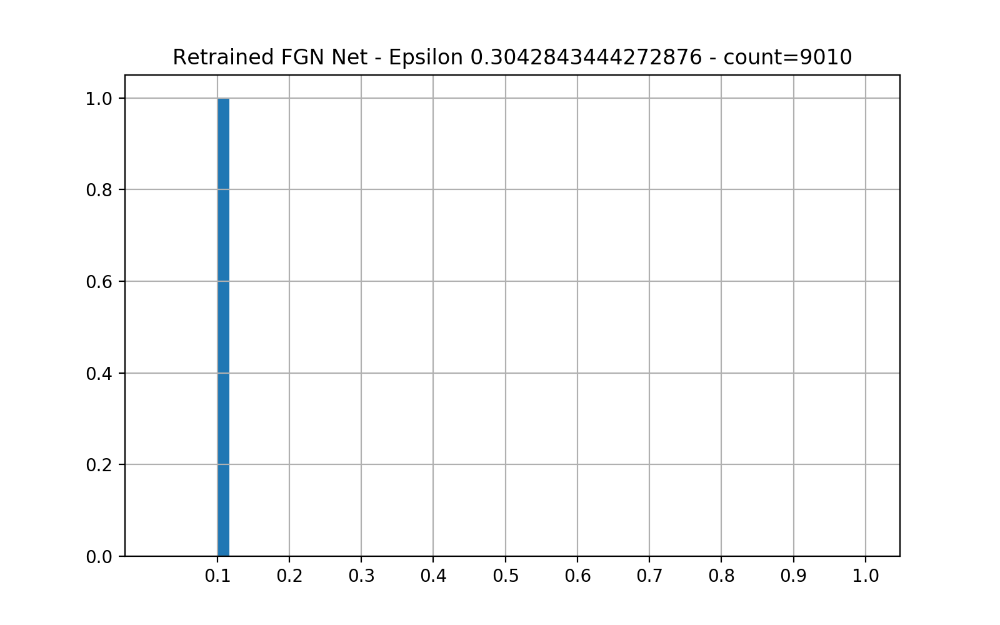

Statistical description of the predictions maximums
DescribeResult(nobs=9010, minmax=(0.1, 0.10000000000021862432), mean=0.10000000000000007446, variance=9.647638265453112389e-30, skewness=56.850002696710560626, kurtosis=3556.8681386407397302)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 6593 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1724 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7446 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3711 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 149 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


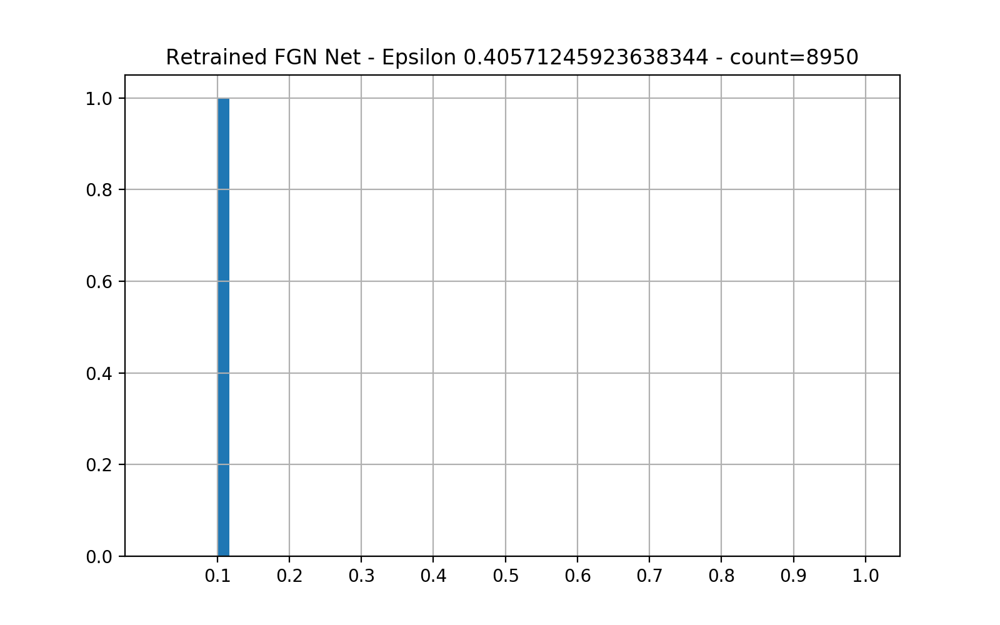

Statistical description of the predictions maximums
DescribeResult(nobs=8950, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369151650777100088e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 4485 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2060 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1901 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7089 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2646 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


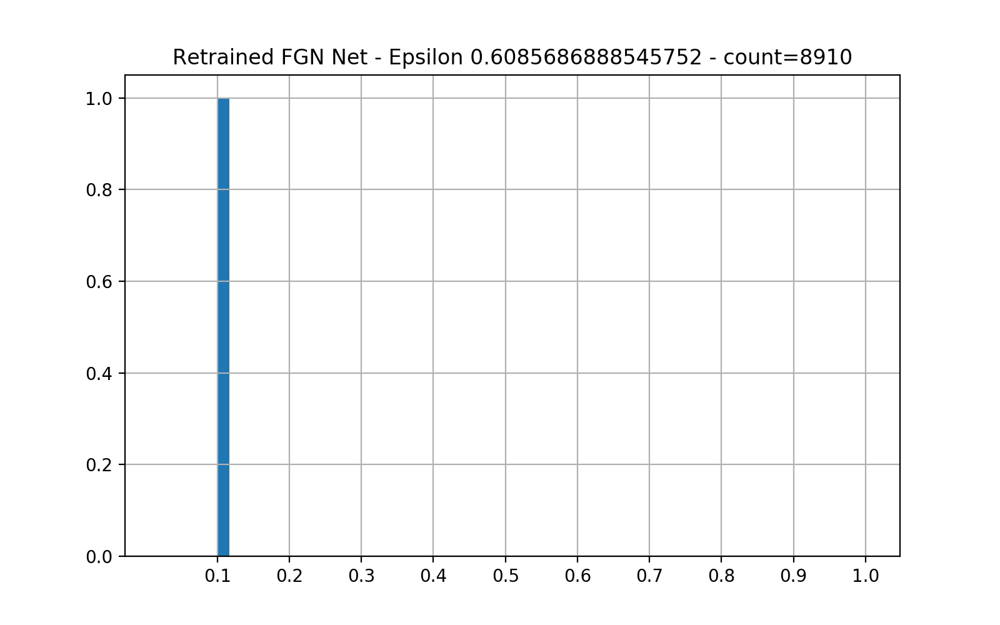

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 3687 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2780 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4570 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8573 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1668 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


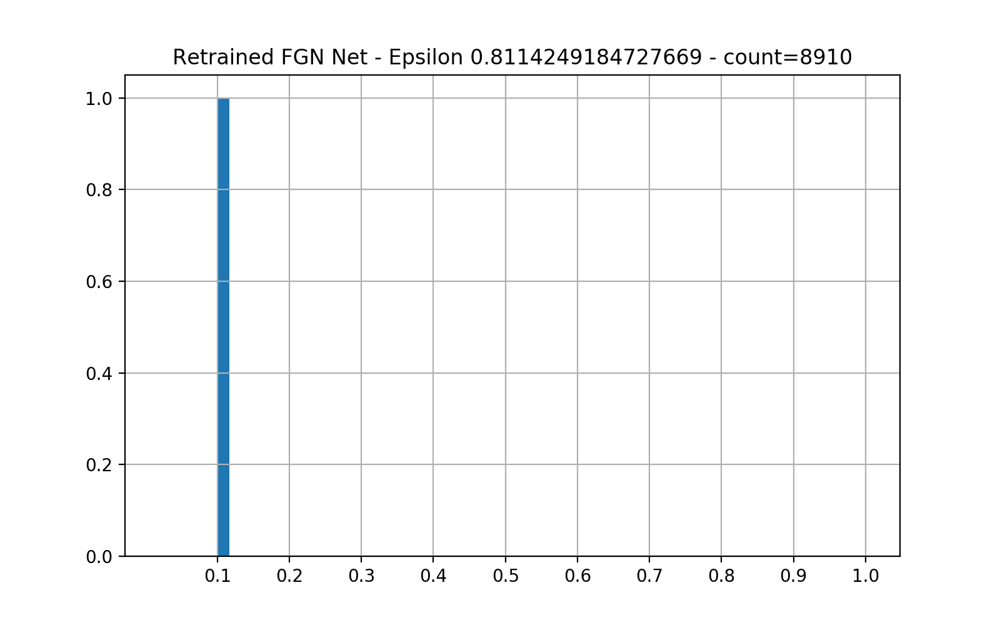

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 1833 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3440 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8645 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6544 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 390 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


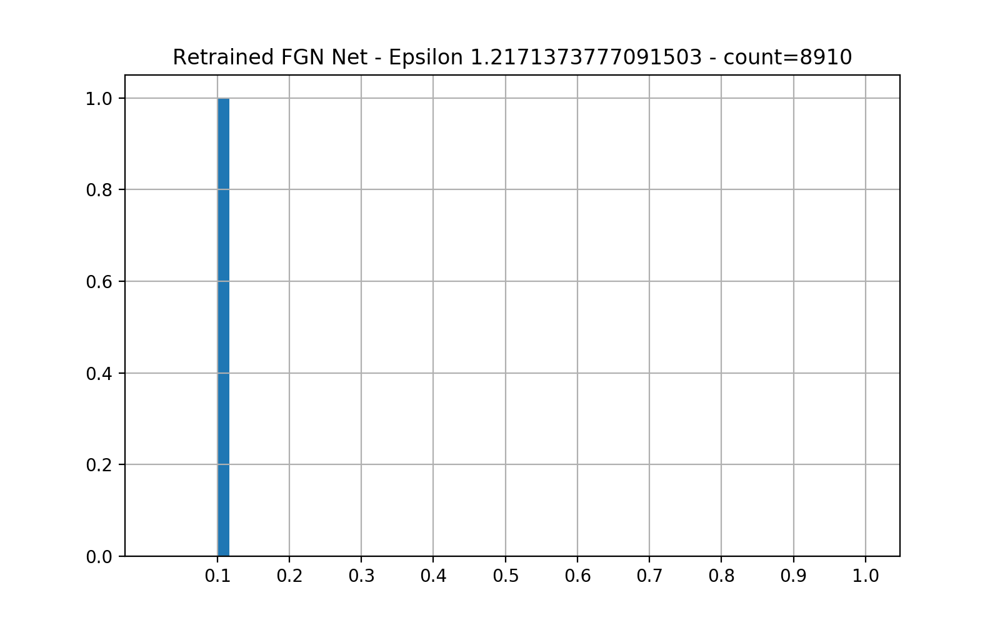

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 6776 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5300 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7666 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4101 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4934 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


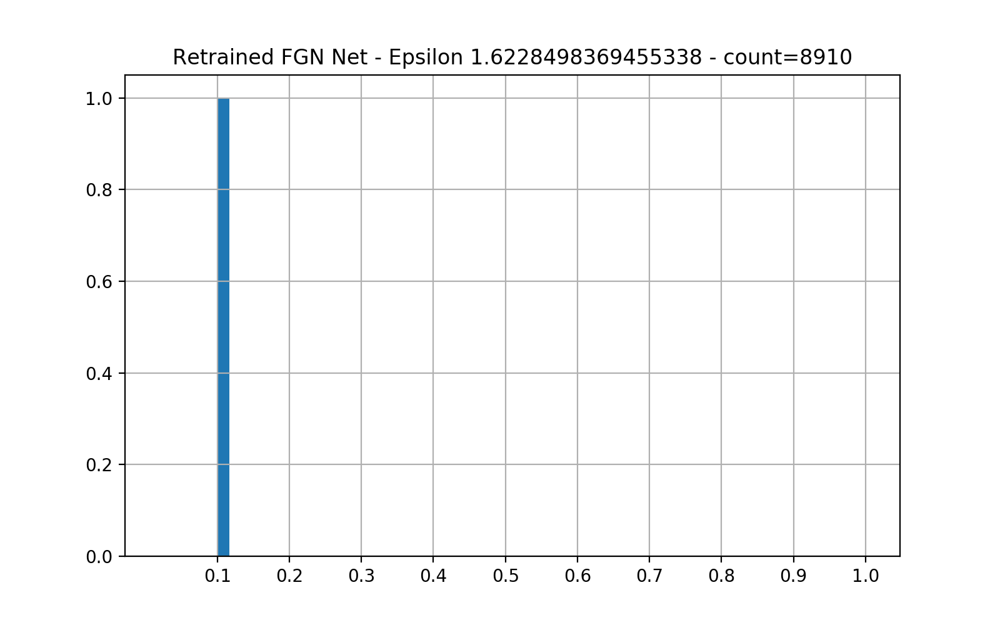

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 5394 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2651 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8382 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5550 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 342 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


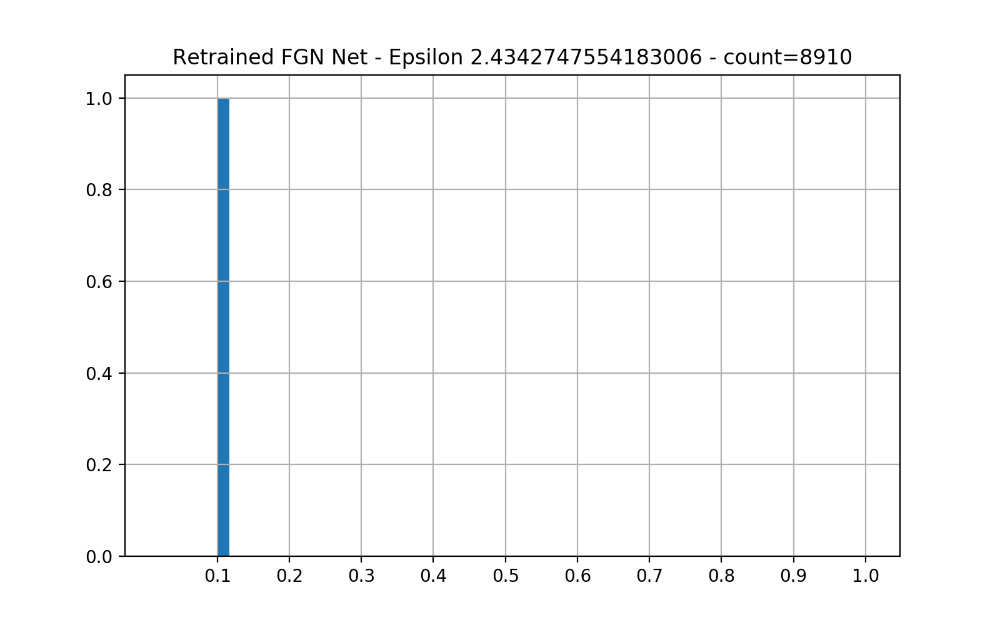

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 1464 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7047 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6160 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8453 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3800 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


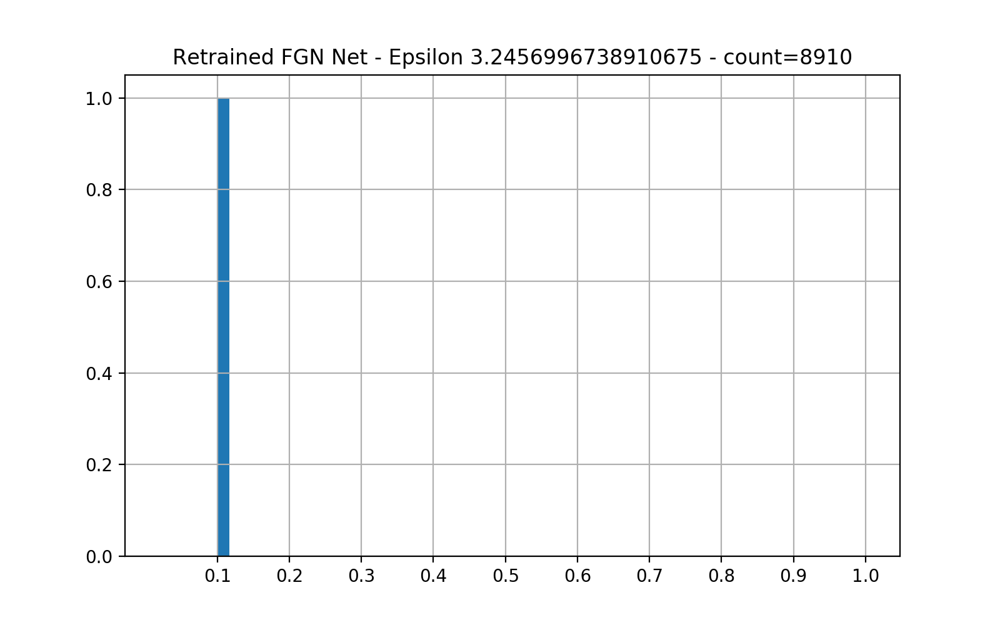

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 1441 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1544 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2625 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2822 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1835 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


In [45]:
# rerun the ret_quick_fgn model on adv examples
for i, ret_quick_fgn_raw_images in enumerate(ret_quick_fgn_raw_successful):
    # turn to dataloader
    dl =  torch.utils.data.DataLoader(torch.utils.data.TensorDataset(ret_quick_fgn_raw_images))
    t = 'Retrained FGN Net - Epsilon {} - count={}'.format(epsilons[i], len(dl))
    fgnh.plot_pred_histogram(ret_quick_fgn_model, dl, title=t, verbose=True)

<IPython.core.display.Javascript object>


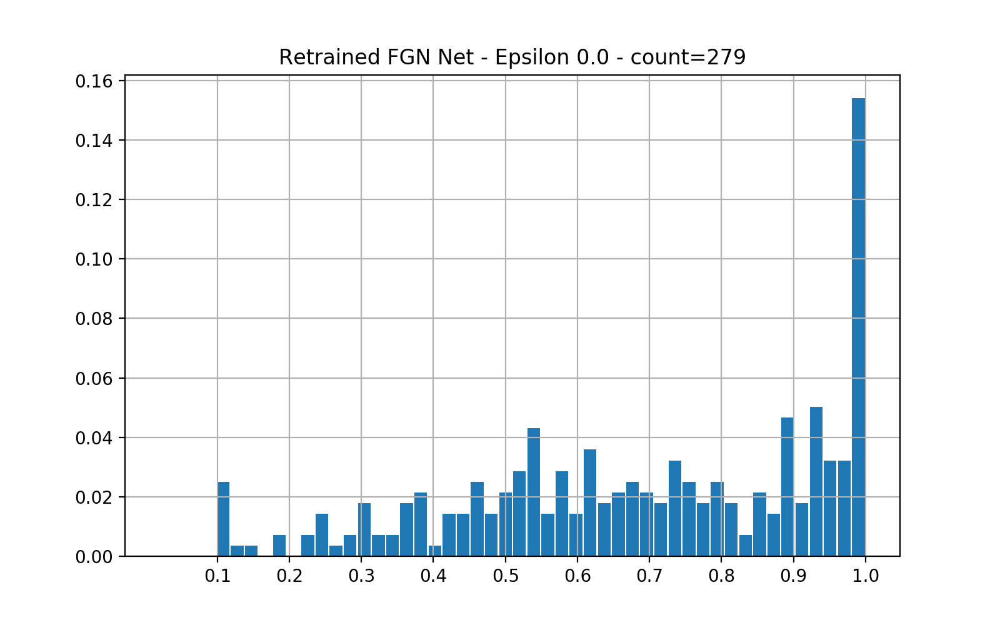

Statistical description of the predictions maximums
DescribeResult(nobs=279, minmax=(0.10000000419920520635, 0.99988657294808429684), mean=0.6927479353642409839, variance=0.061756916568108609022, skewness=-0.5073659633392420421, kurtosis=-0.6997307545237051525)

percentage of confident predictions (>=0.5): 0.7813620071684588

Sample predictions
index 136 prediction [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
index 120 prediction [0.   0.   0.   0.   0.   0.   0.   0.29 0.   0.71]
index 133 prediction [0.   0.01 0.76 0.11 0.02 0.   0.   0.01 0.02 0.06]
index 68 prediction [0.02 0.05 0.04 0.01 0.01 0.01 0.02 0.82 0.01 0.02]
index 46 prediction [0.   0.   0.   0.   0.53 0.   0.   0.   0.   0.46]


<IPython.core.display.Javascript object>


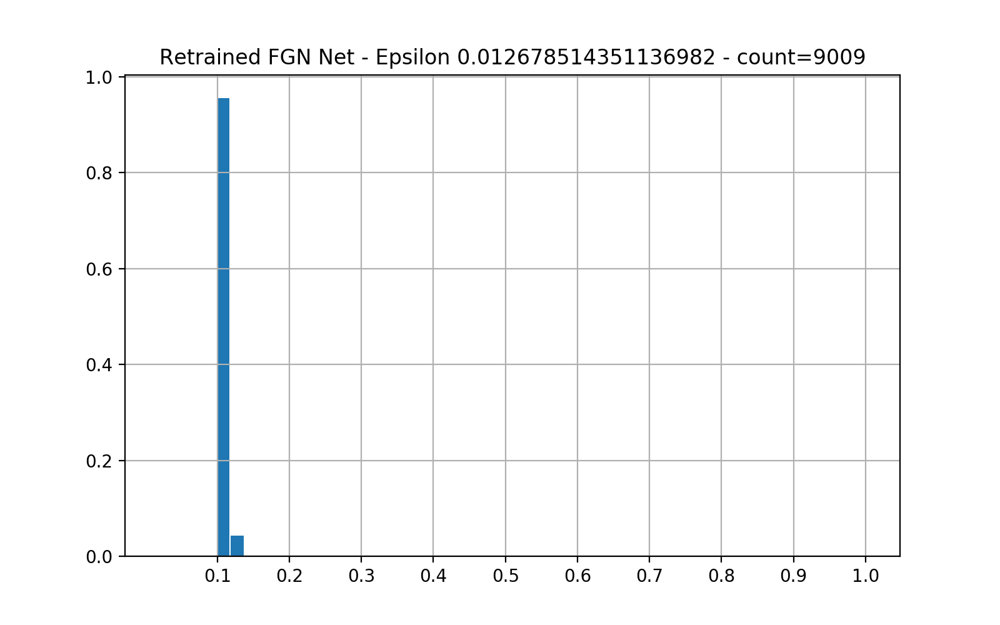

Statistical description of the predictions maximums
DescribeResult(nobs=9009, minmax=(0.10000000122178145892, 0.15908324922501694727), mean=0.108606886115664813984, variance=2.313208532685784478e-05, skewness=1.0951321572967702276, kurtosis=2.3498888677737178347)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 8641 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8483 prediction [0.11 0.1  0.1  0.1  0.1  0.1  0.11 0.1  0.1  0.1 ]
index 7800 prediction [0.12 0.09 0.11 0.1  0.09 0.1  0.11 0.1  0.09 0.09]
index 3214 prediction [0.11 0.1  0.1  0.1  0.1  0.1  0.1  0.1  0.1  0.1 ]
index 5421 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


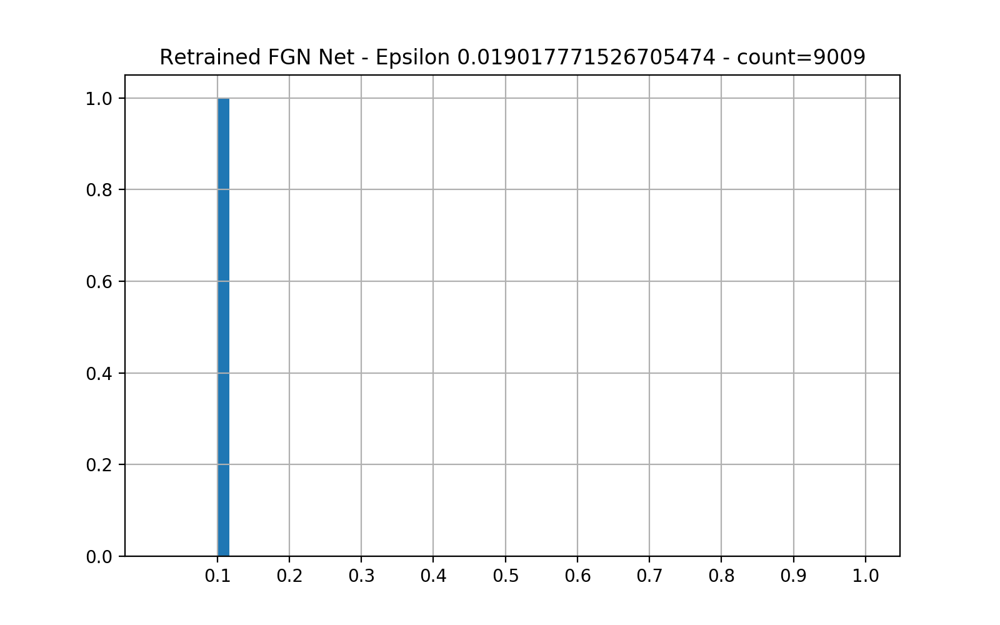

Statistical description of the predictions maximums
DescribeResult(nobs=9009, minmax=(0.100000000110569604736, 0.10654302036758859548), mean=0.10039849370224674622, variance=1.1882083335576629701e-07, skewness=2.1951029606779082555, kurtosis=15.730553150135267568)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 5852 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7799 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5668 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1344 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 148 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


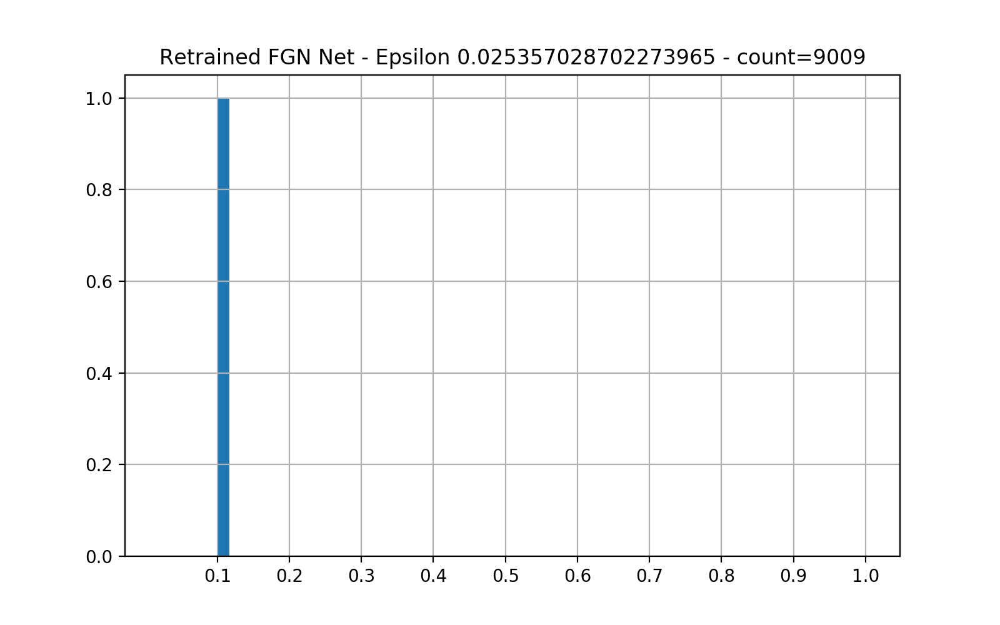

Statistical description of the predictions maximums
DescribeResult(nobs=9009, minmax=(0.10000000000304511132, 0.100713704365535370355), mean=0.10001325128002361471, variance=4.1124453528888416466e-10, skewness=7.714230581636753503, kurtosis=179.4784996660333417)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 3041 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4069 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7415 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 788 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8486 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


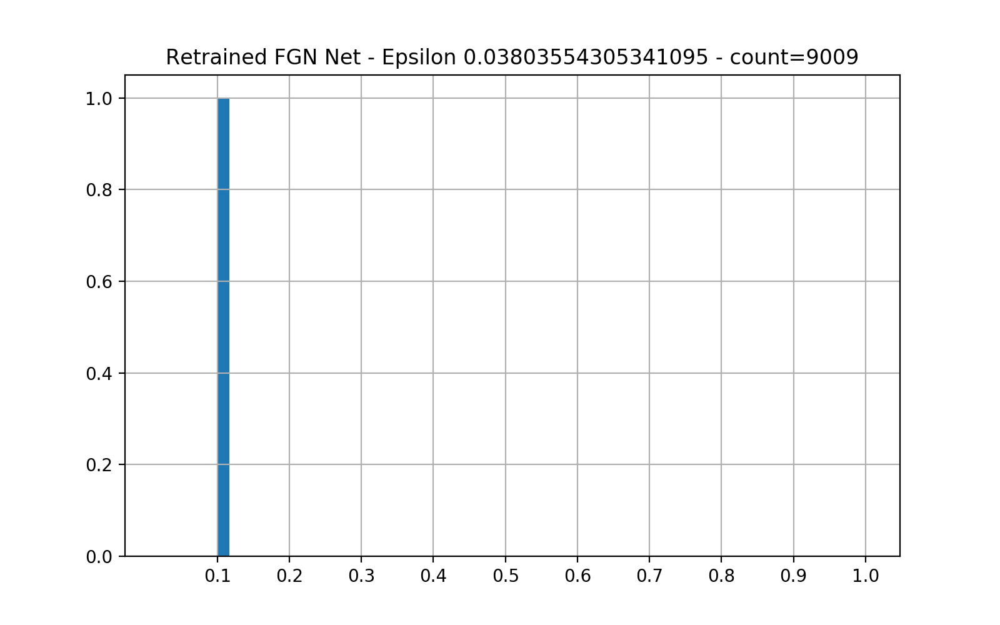

Statistical description of the predictions maximums
DescribeResult(nobs=9009, minmax=(0.10000000000000006511, 0.10000341416121195763), mean=0.10000000272919587097, variance=1.4690656881313193825e-15, skewness=79.17959838774711705, kurtosis=6974.0495274742156724)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 6322 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5744 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1082 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4524 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1641 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


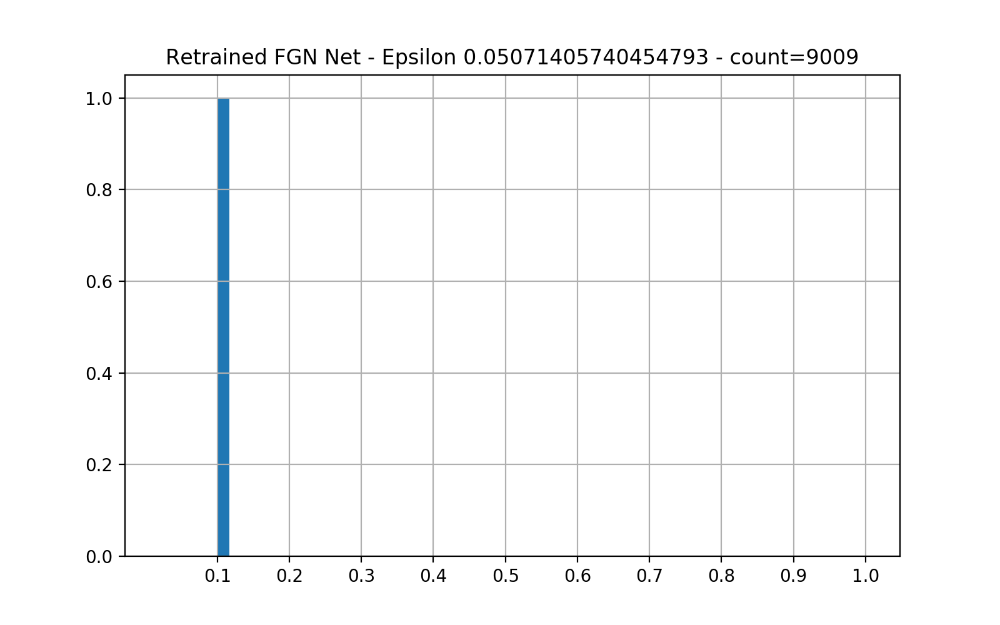

Statistical description of the predictions maximums
DescribeResult(nobs=9009, minmax=(0.1, 0.100000002134435667546), mean=0.10000000000030373522, variance=5.0748748268376574423e-22, skewness=94.39822531062126994, kurtosis=8939.432292139358666)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 4508 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4209 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1927 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4480 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1412 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


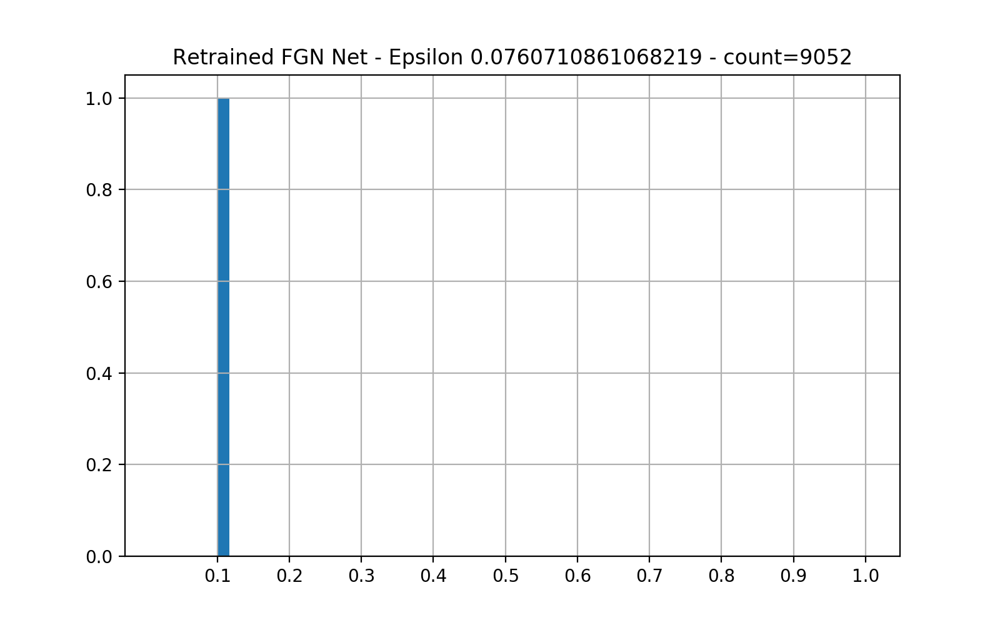

Statistical description of the predictions maximums
DescribeResult(nobs=9052, minmax=(0.1, 0.100000000000000001485), mean=0.10000000000000000002, variance=6.499560595669563622e-40, skewness=20.401985260735651474, kurtosis=1197.8971992110453649)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 6907 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1248 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3205 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8644 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7271 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


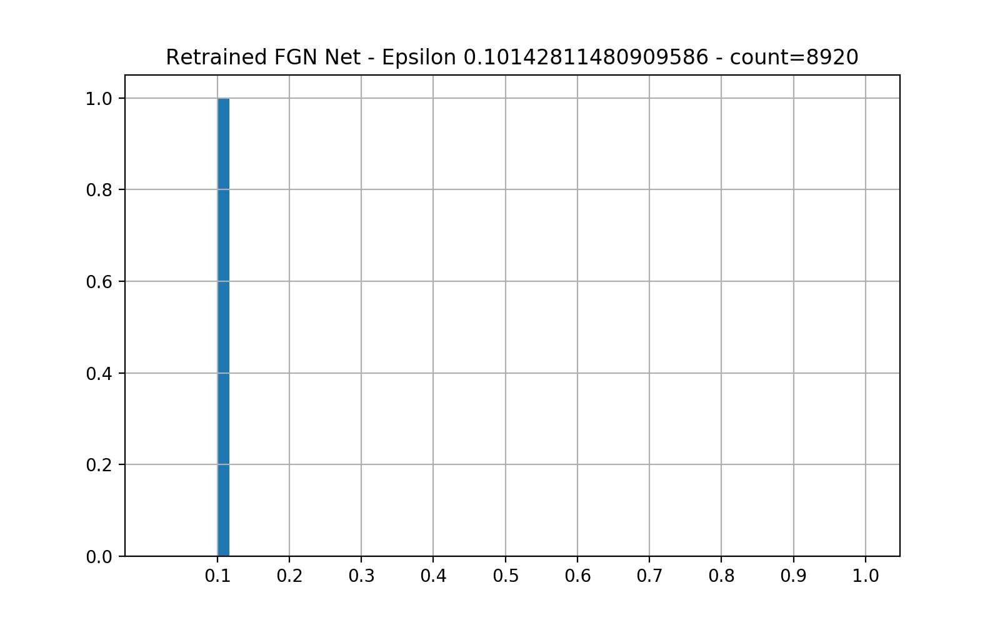

Statistical description of the predictions maximums
DescribeResult(nobs=8920, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369158554306124165e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 5029 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1877 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3839 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4877 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3512 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


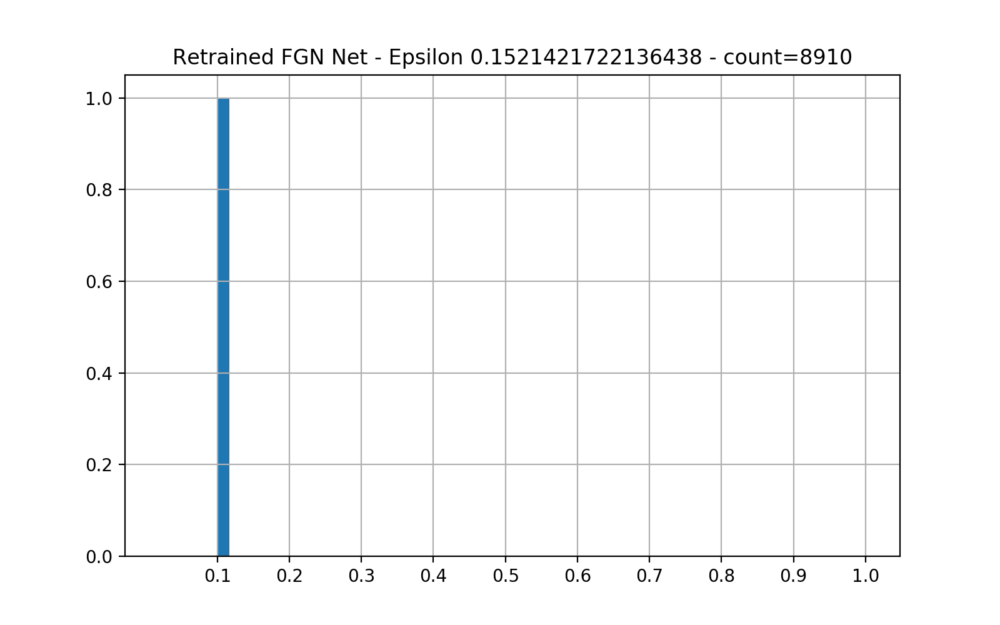

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 4659 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5688 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2431 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 102 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 584 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


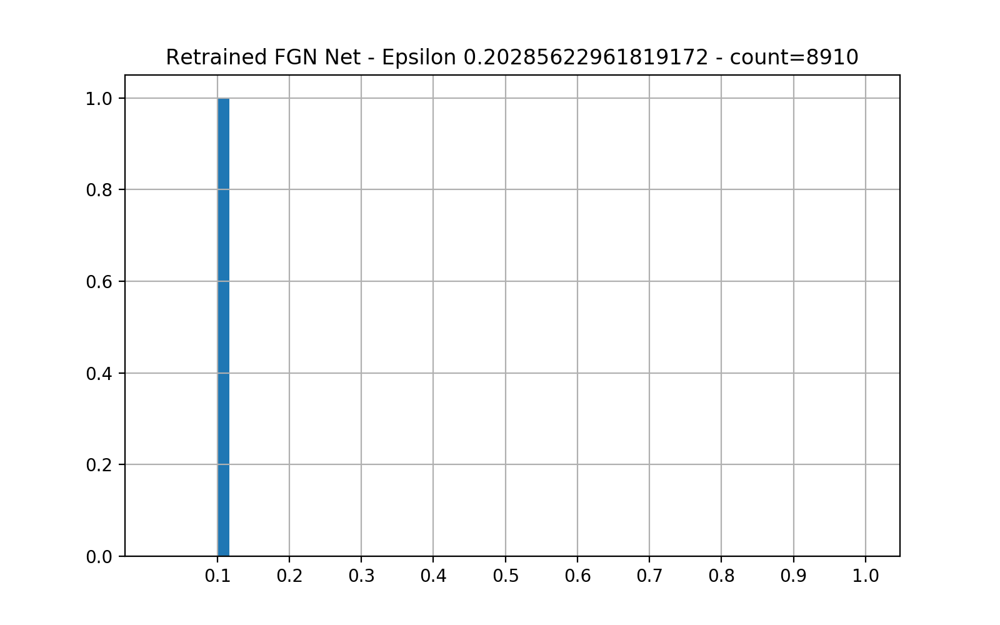

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 6435 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7946 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 45 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7086 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5014 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


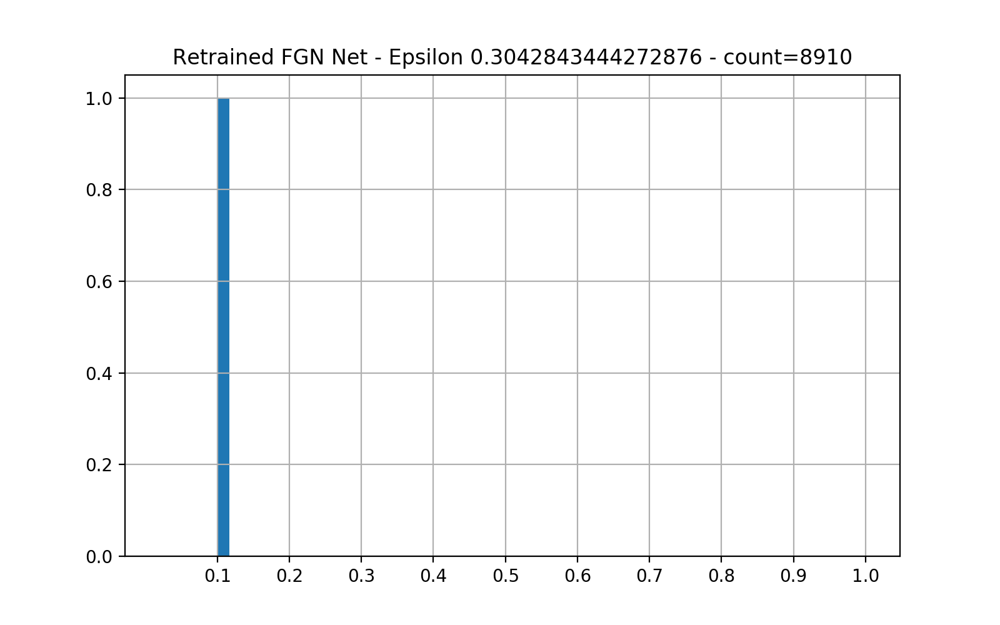

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 1648 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1570 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8451 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 404 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1201 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


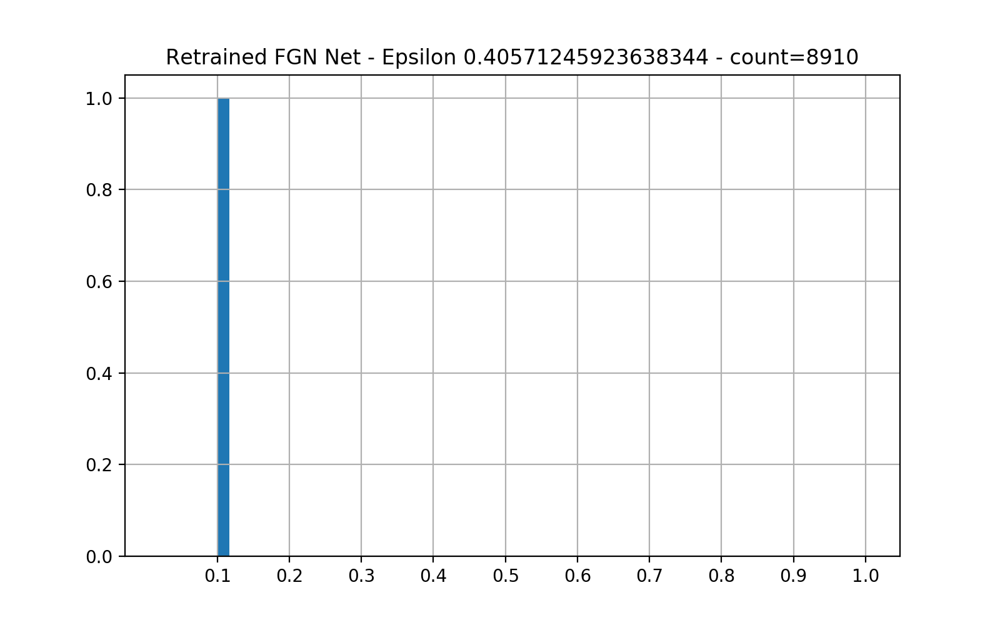

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 1314 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2789 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 139 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4566 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2798 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


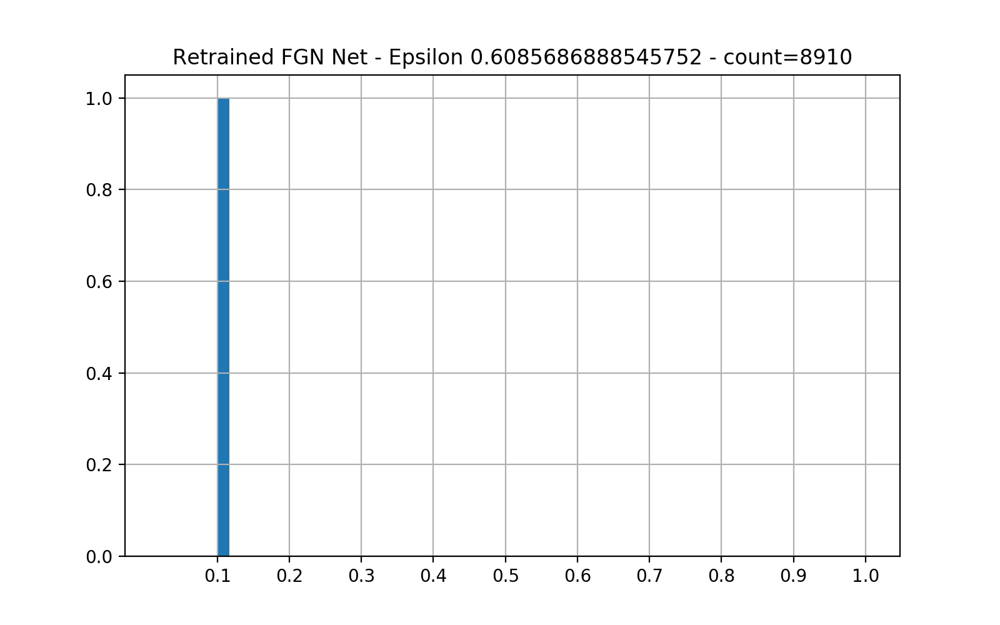

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 6820 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4033 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3621 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 1634 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


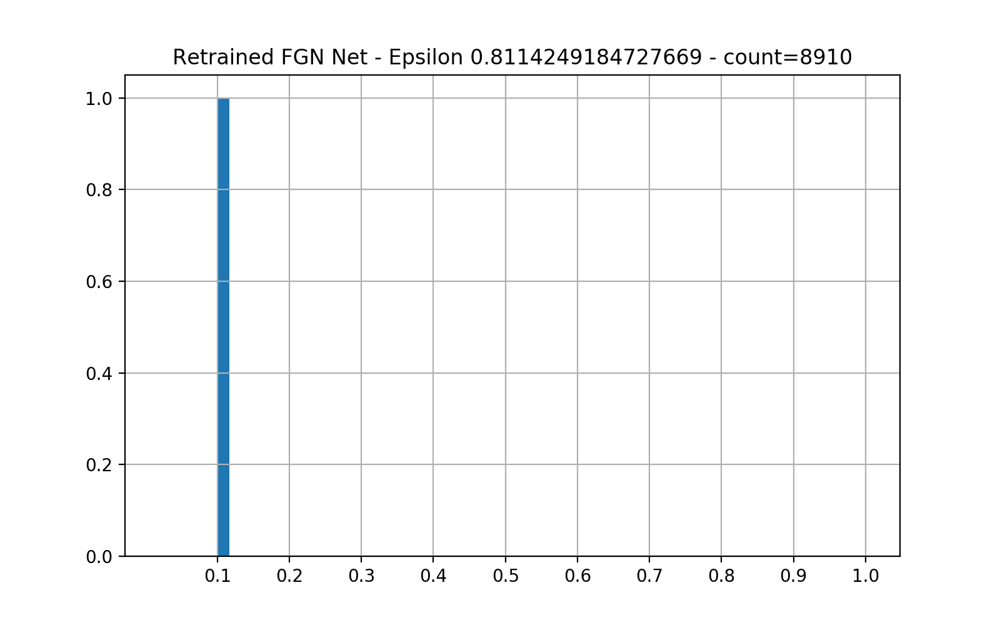

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 2645 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3592 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6282 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 5035 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4978 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


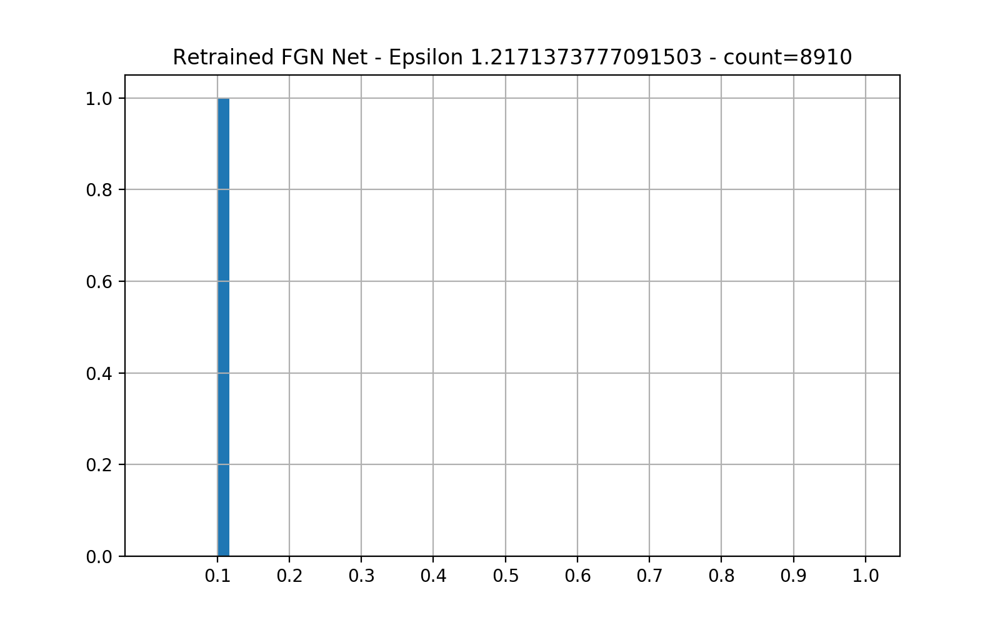

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 5614 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7003 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6901 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 3108 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6114 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


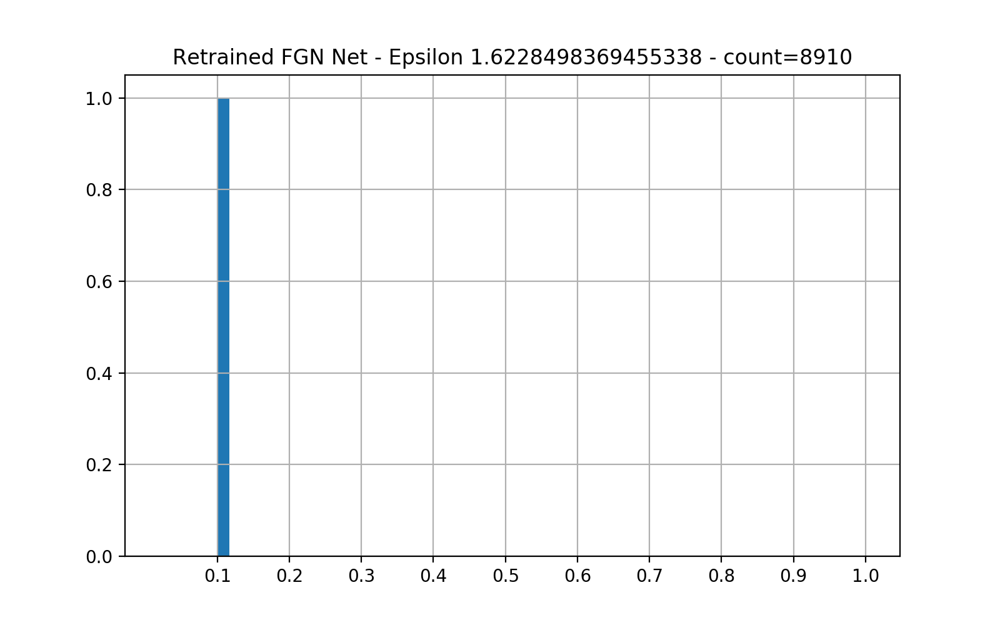

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 5763 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2281 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2457 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 7902 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 8795 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


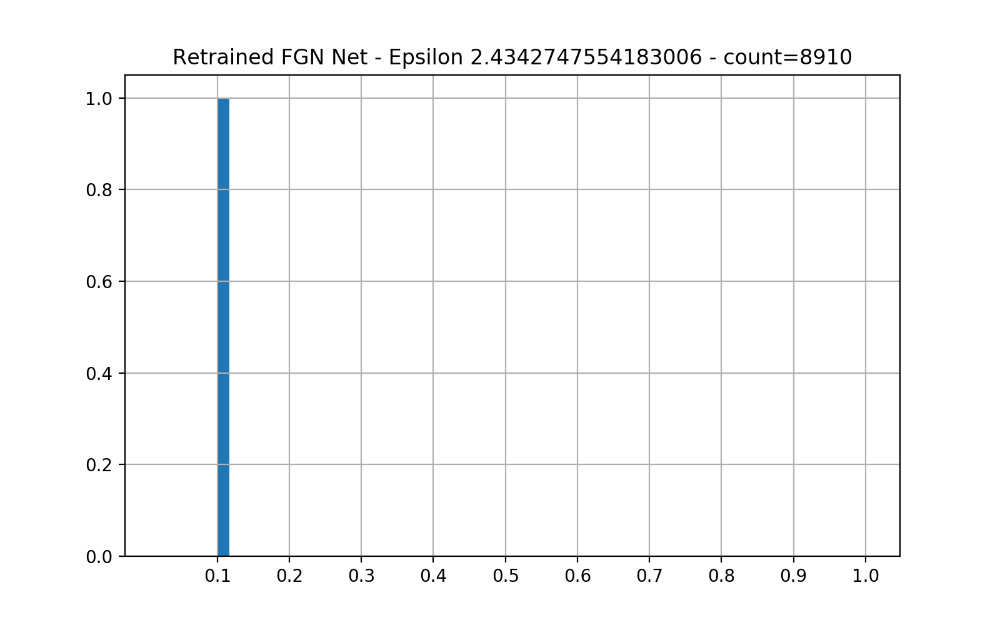

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 5387 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2636 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4700 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4825 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 2014 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


<IPython.core.display.Javascript object>


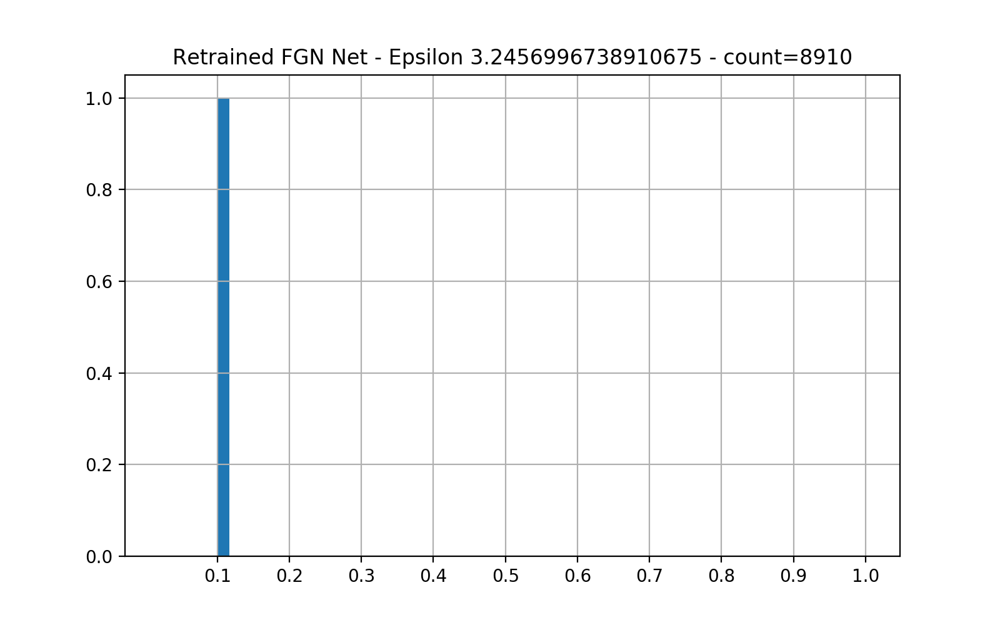

Statistical description of the predictions maximums
DescribeResult(nobs=8910, minmax=(0.1, 0.1), mean=0.100000000000000000015, variance=1.8369160865814383096e-40, skewness=-1.0, kurtosis=-2.0)

percentage of confident predictions (>=0.5): 0.0

Sample predictions
index 8532 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 6582 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 623 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4891 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]
index 4972 prediction [0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1 0.1]


In [46]:
# rerun the ret_fgn model on adv examples
for i, ret_fgn_raw_images in enumerate(ret_fgn_raw_successful):
    # turn to dataloader
    dl =  torch.utils.data.DataLoader(torch.utils.data.TensorDataset(ret_fgn_raw_images))
    t = 'Retrained FGN Net - Epsilon {} - count={}'.format(epsilons[i], len(dl))
    fgnh.plot_pred_histogram(ret_fgn_model, dl, title=t, verbose=True)

In [47]:
ret_fgn_f_model(ret_fgn_raw[1][0])

tensor([[ 0.1490, -0.0249,  0.0527, -0.0038, -0.0289,  0.0142,  0.0996, -0.0044,
         -0.0226, -0.0184]], device='cuda:1')

In [48]:
labels[0]

tensor(3, device='cuda:1')

In [49]:
ret_fgn_adv_success[1][0]

tensor(True, device='cuda:1')

/home/apps/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


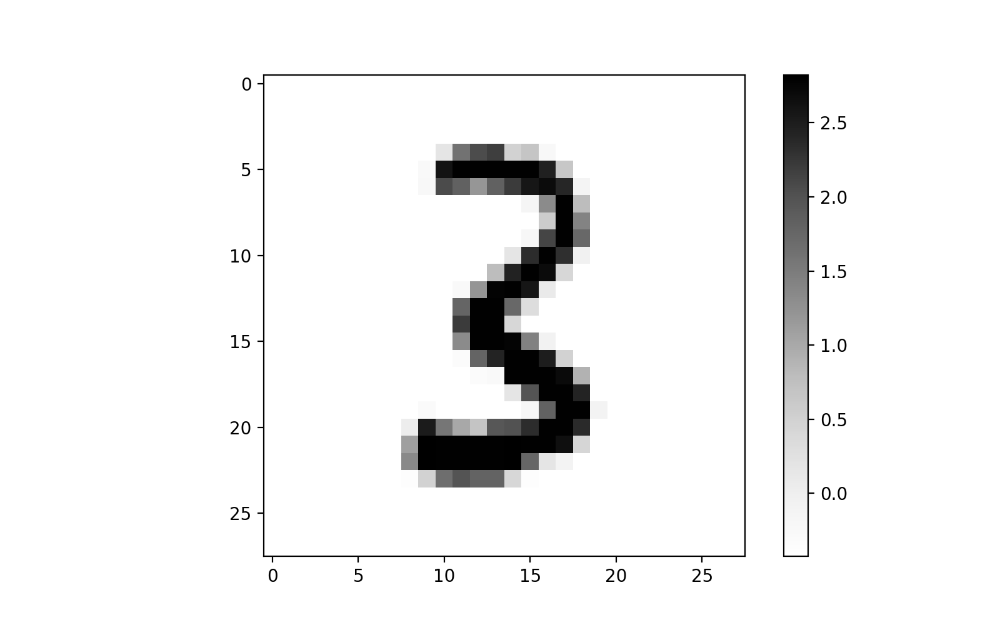

In [50]:
# original image
plt.imshow(images[0].cpu().numpy(), vmin=min_pix, vmax=max_pix, cmap='Greys')
plt.colorbar()
plt.show()

/home/apps/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


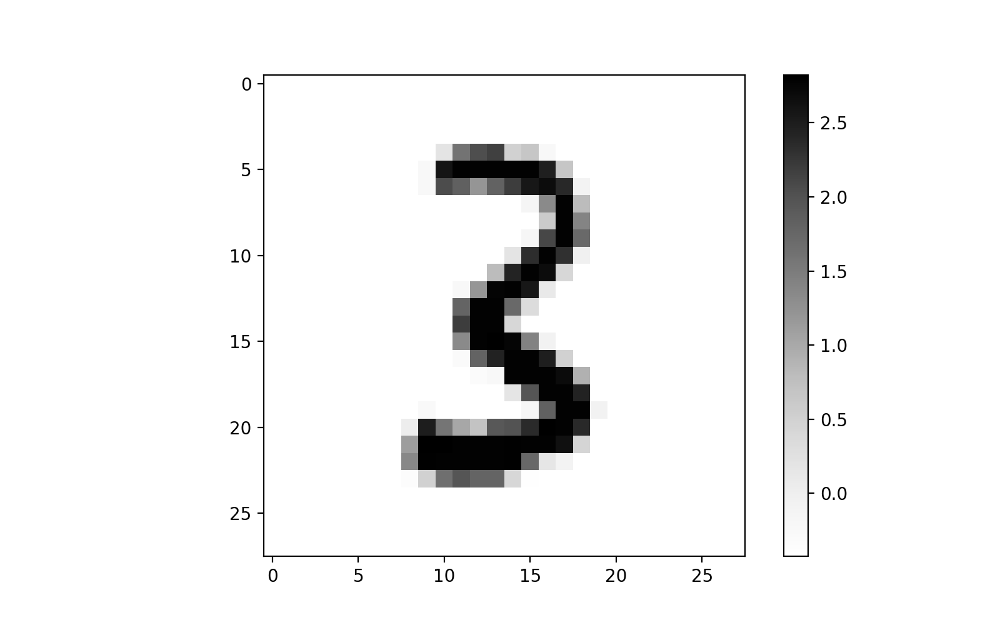

In [51]:
# adversarial image
plt.imshow(ret_fgn_raw[1][0].cpu().numpy(), vmin=min_pix, vmax=max_pix, cmap='Greys')
plt.colorbar()
plt.show()

/home/apps/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


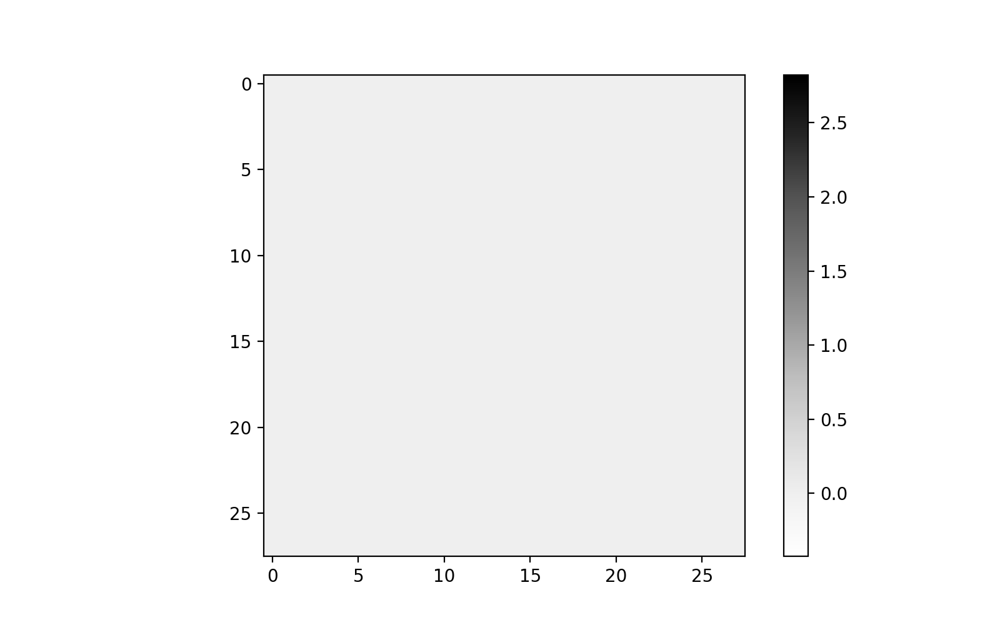

In [52]:
# noise
plt.imshow(images[0].cpu().numpy()-ret_fgn_raw[0][0].cpu().numpy(), vmin=min_pix, vmax=max_pix, cmap='Greys')
plt.colorbar()
plt.show()

/home/apps/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  


<IPython.core.display.Javascript object>


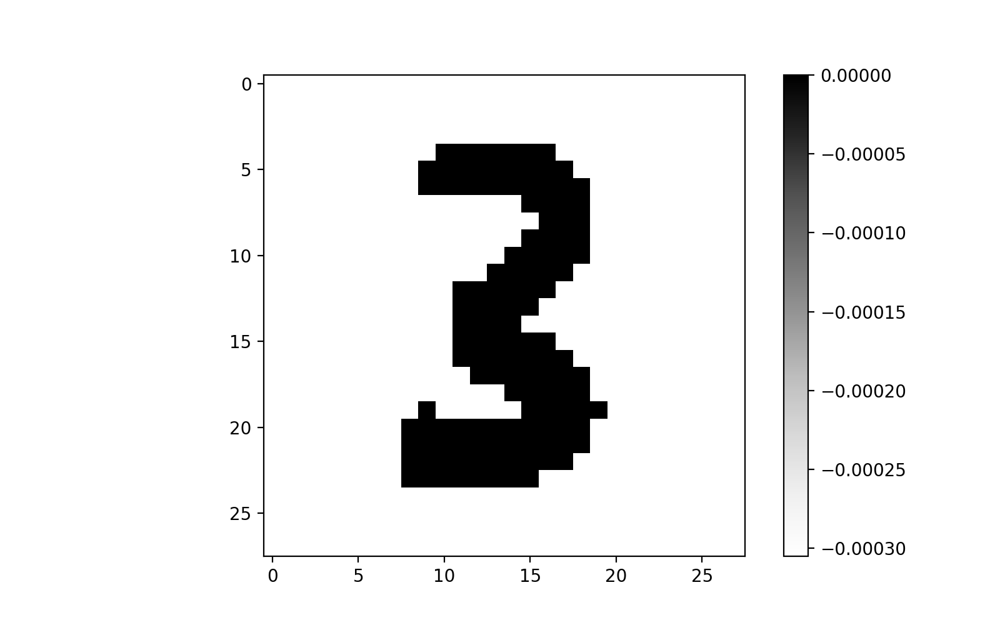

In [53]:
# noise with exagerated contrast
plt.imshow(images[0].cpu().numpy()-ret_fgn_raw[0][0].cpu().numpy(), cmap='Greys')
plt.colorbar()
plt.show()

In [54]:
# compare prediction confidences 

In [55]:
names = ['classic', 'fgn', 'retrained']
al = ['right', 'mid', 'left']

/home/apps/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:25: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


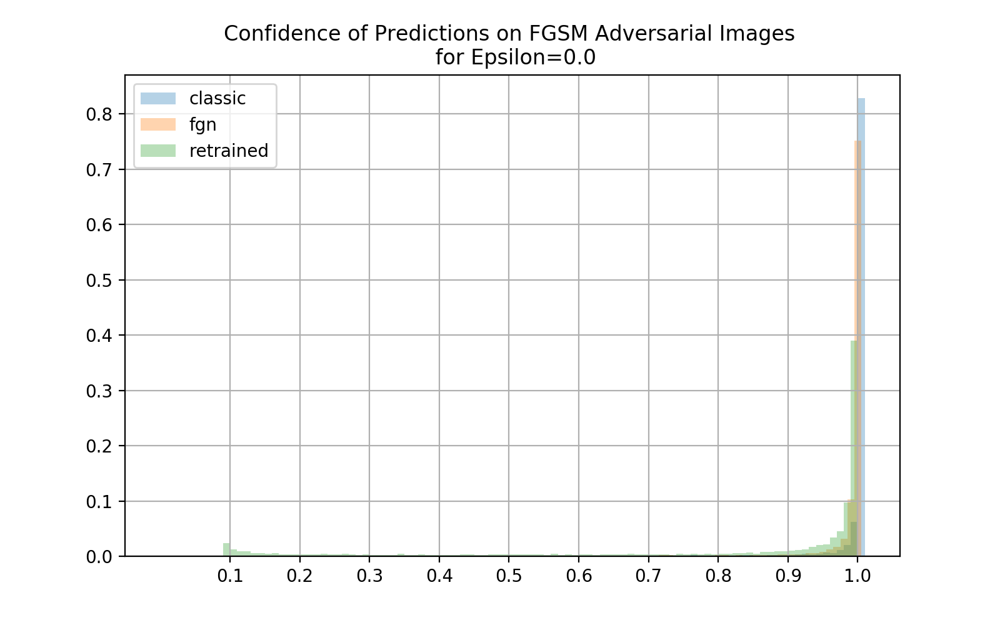

/home/apps/anaconda/lib/python3.6/site-packages/ipykernel_launcher.py:38: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


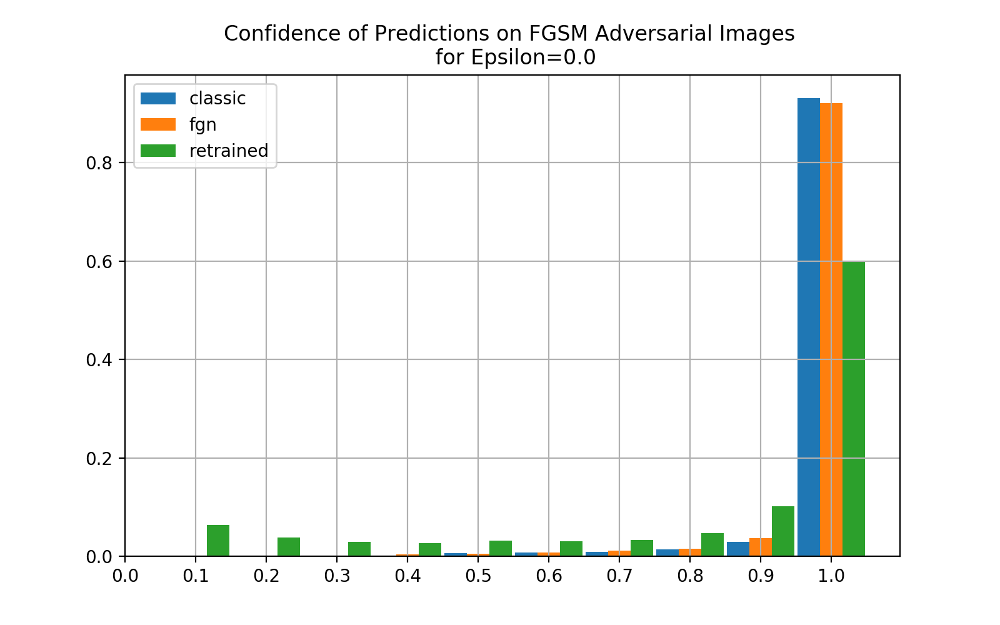

<IPython.core.display.Javascript object>


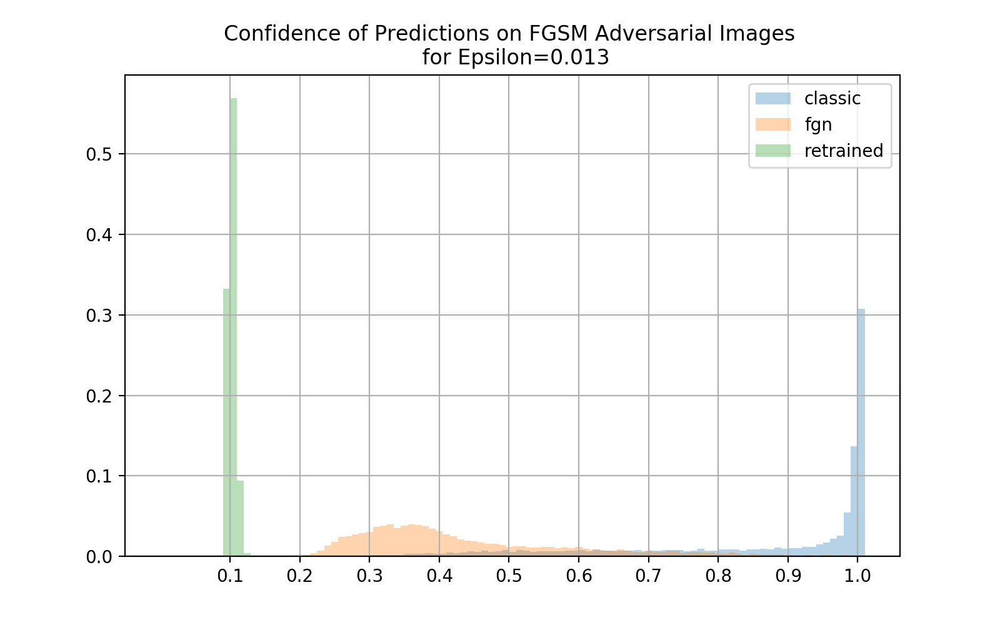

<IPython.core.display.Javascript object>


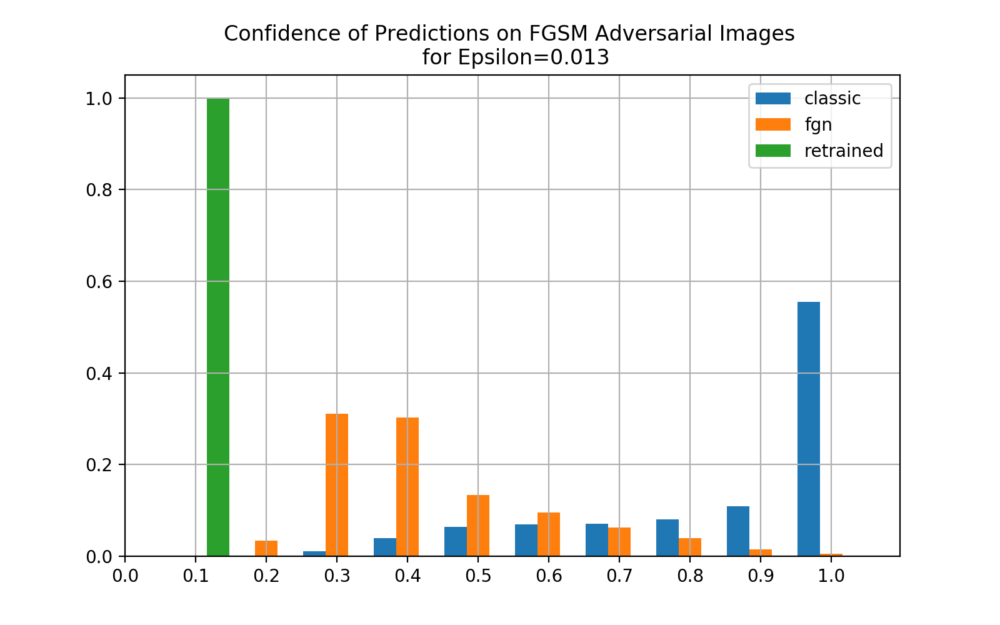

<IPython.core.display.Javascript object>


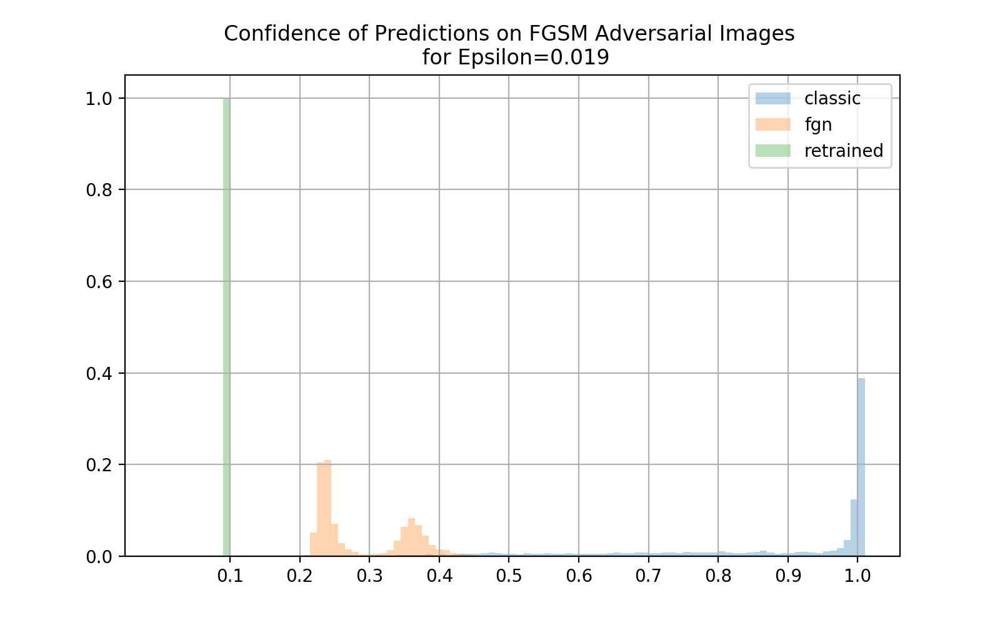

<IPython.core.display.Javascript object>


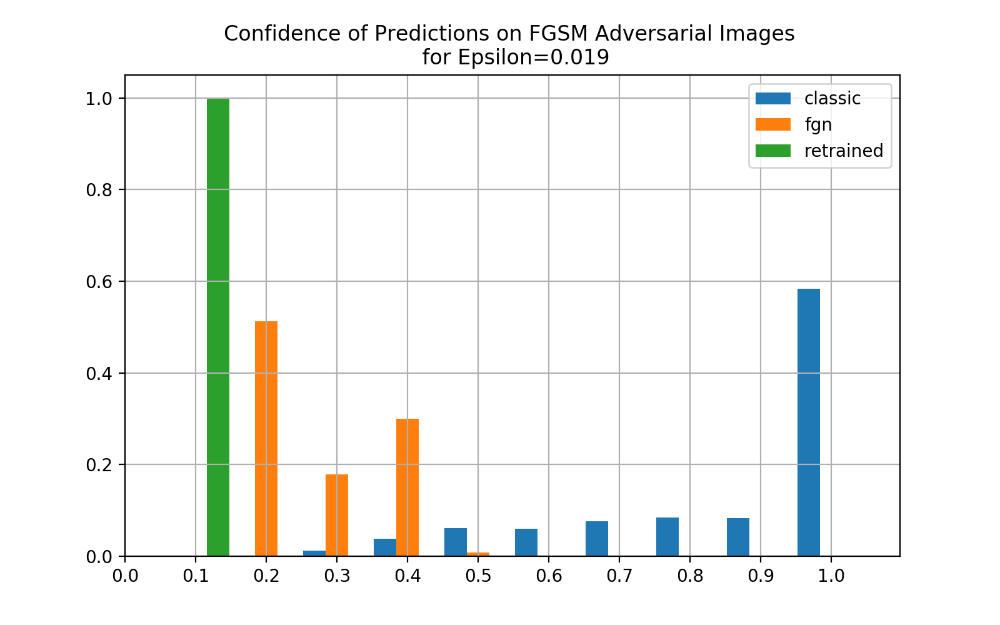

<IPython.core.display.Javascript object>


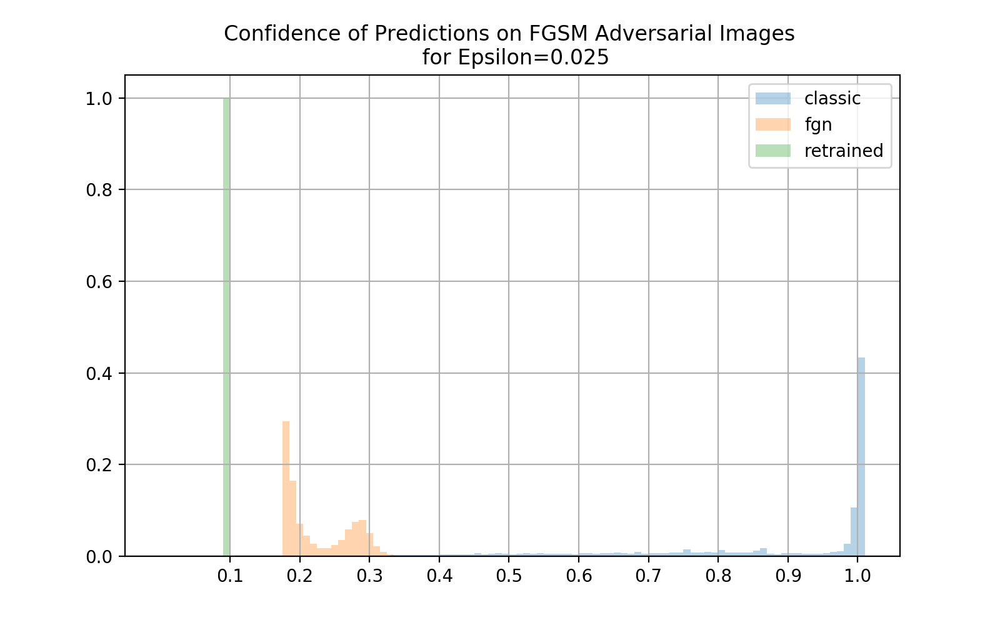

<IPython.core.display.Javascript object>


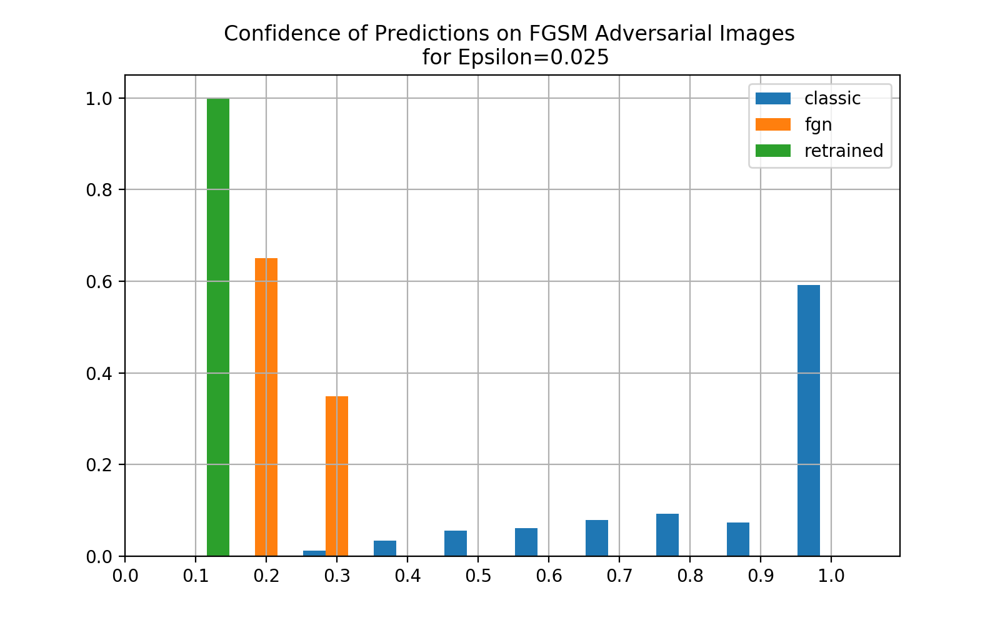

<IPython.core.display.Javascript object>


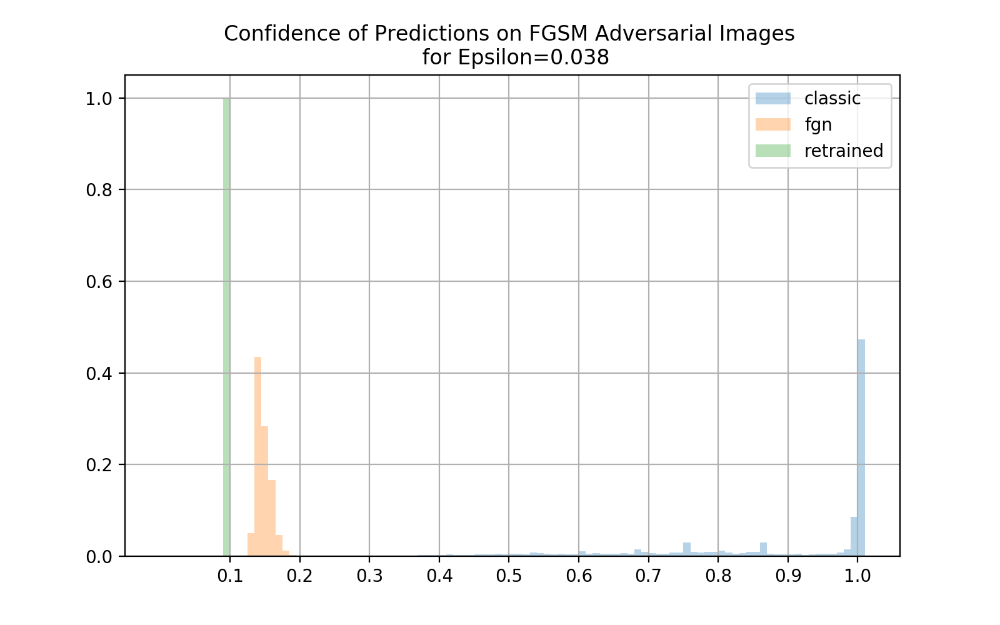

<IPython.core.display.Javascript object>


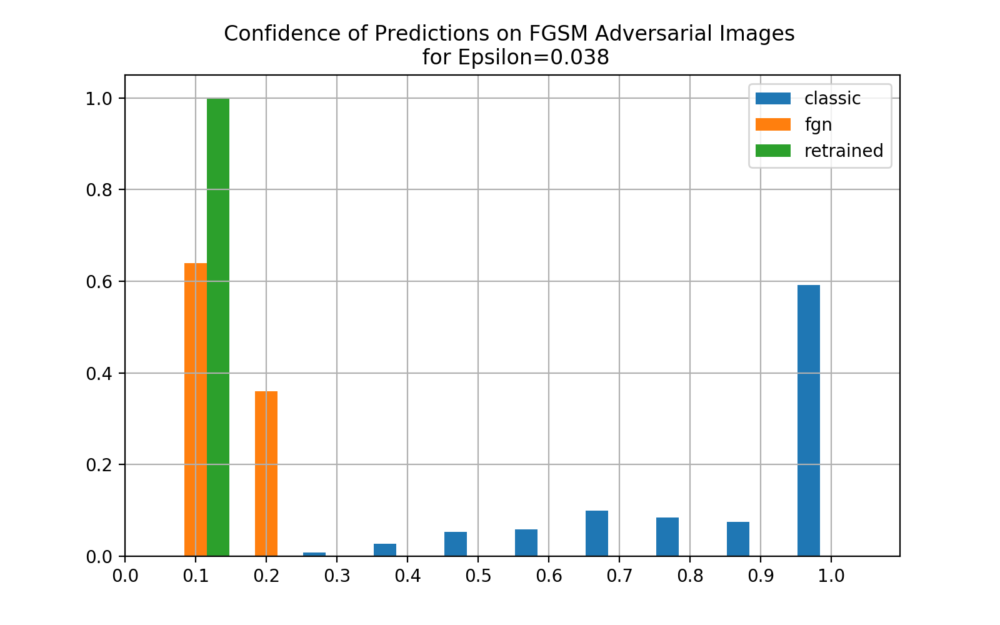

<IPython.core.display.Javascript object>


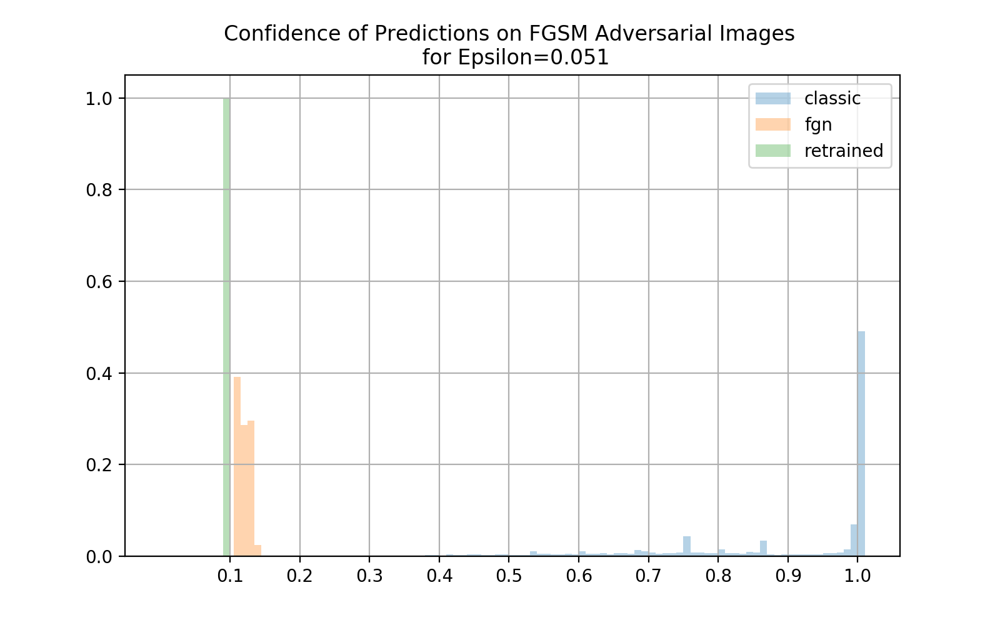

<IPython.core.display.Javascript object>


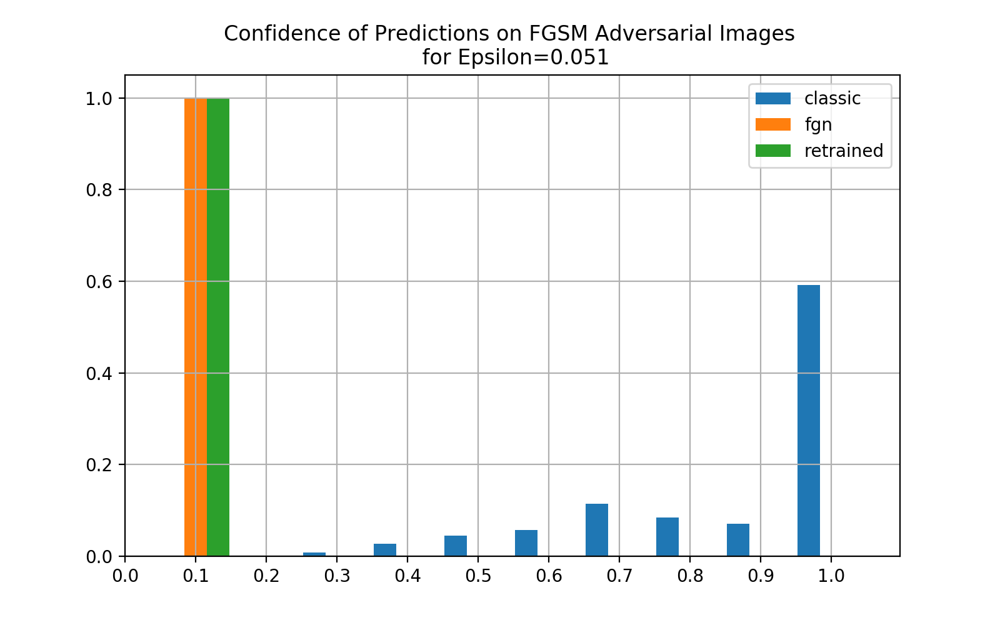

<IPython.core.display.Javascript object>


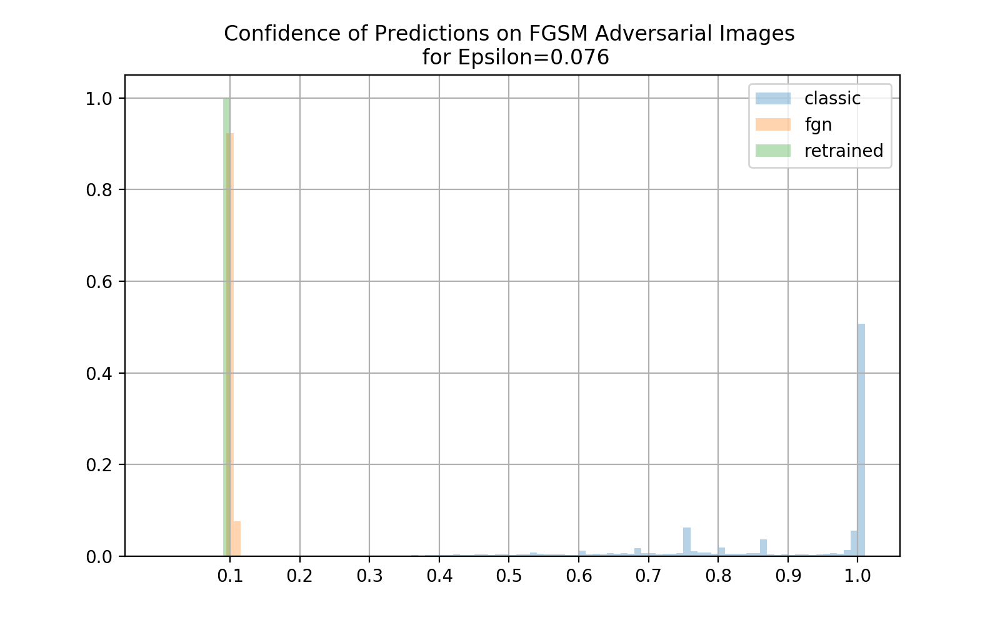

<IPython.core.display.Javascript object>


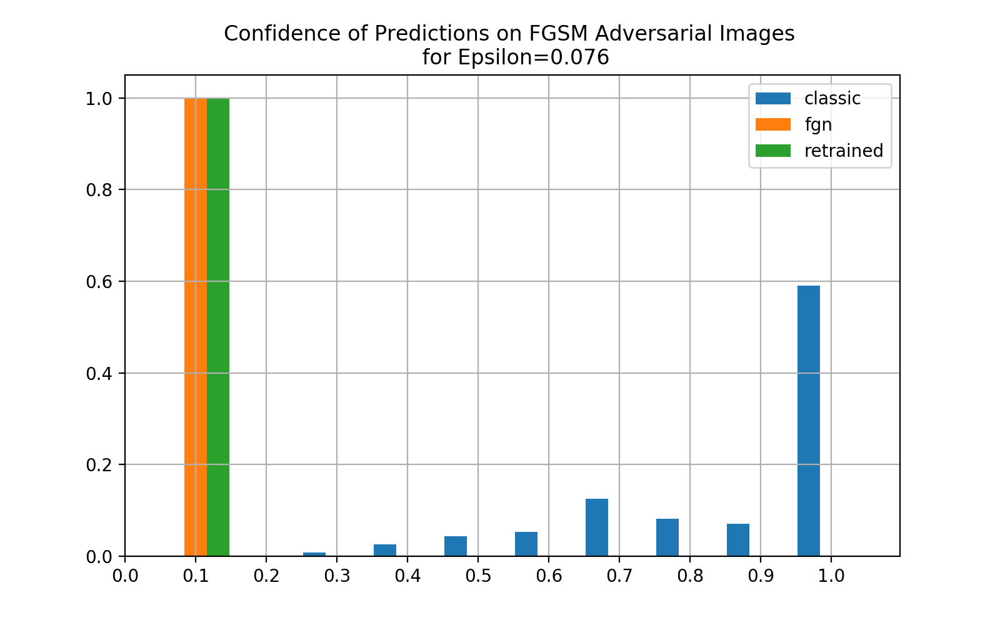

<IPython.core.display.Javascript object>


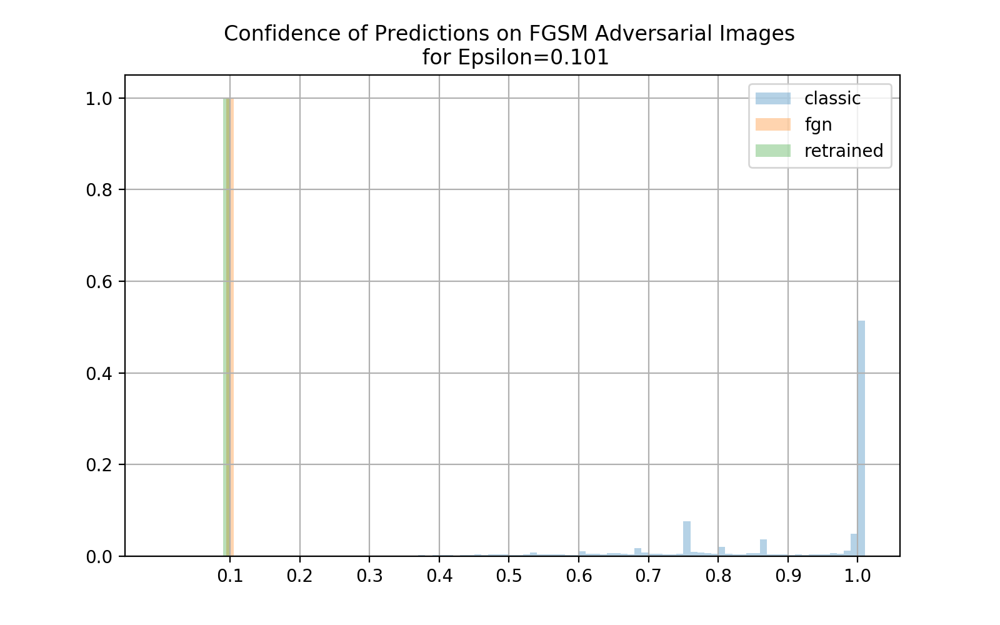

<IPython.core.display.Javascript object>


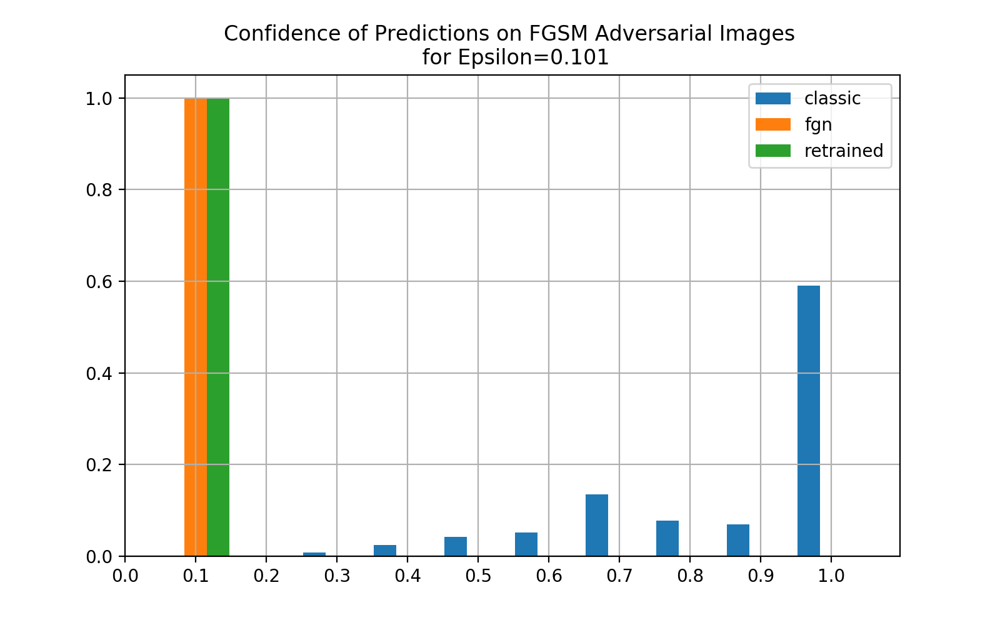

<IPython.core.display.Javascript object>


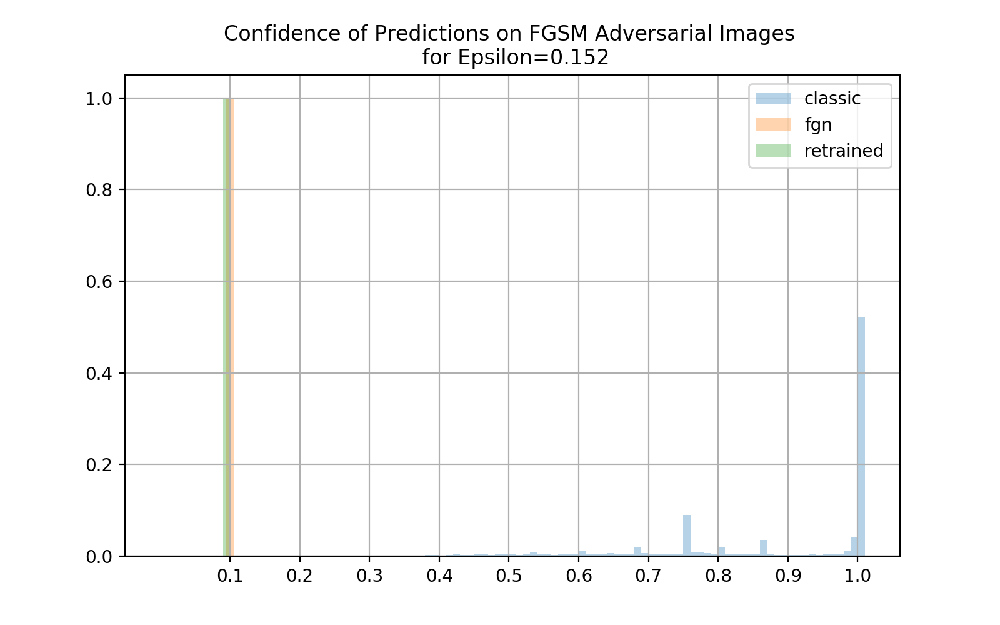

<IPython.core.display.Javascript object>


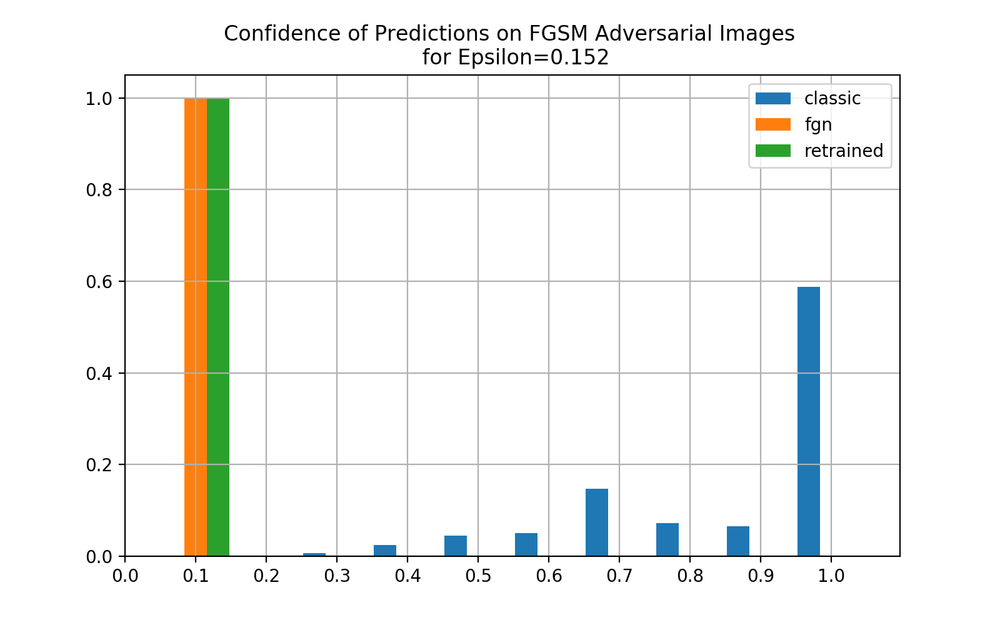

<IPython.core.display.Javascript object>


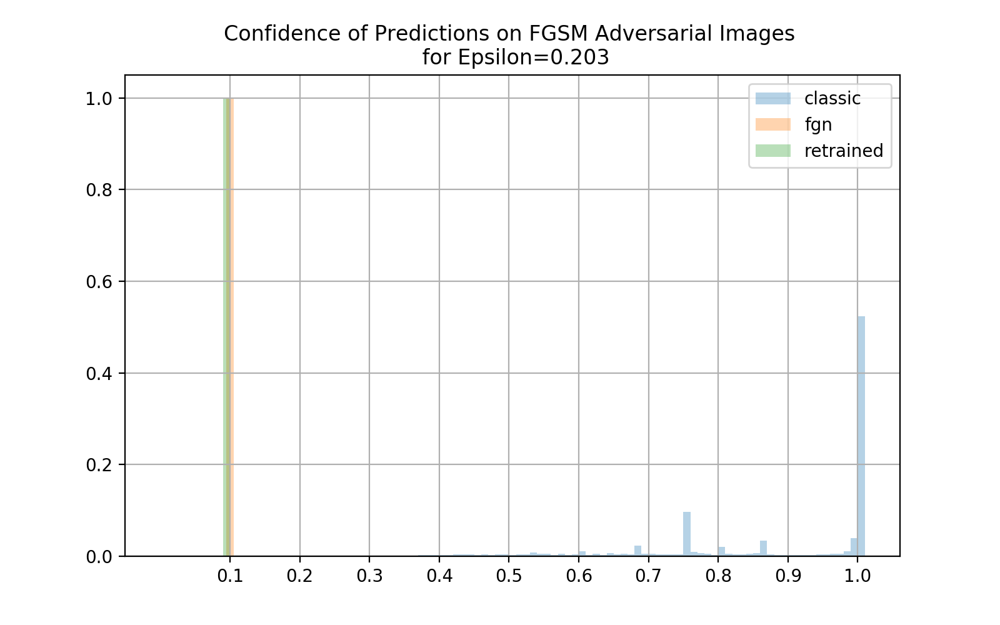

<IPython.core.display.Javascript object>


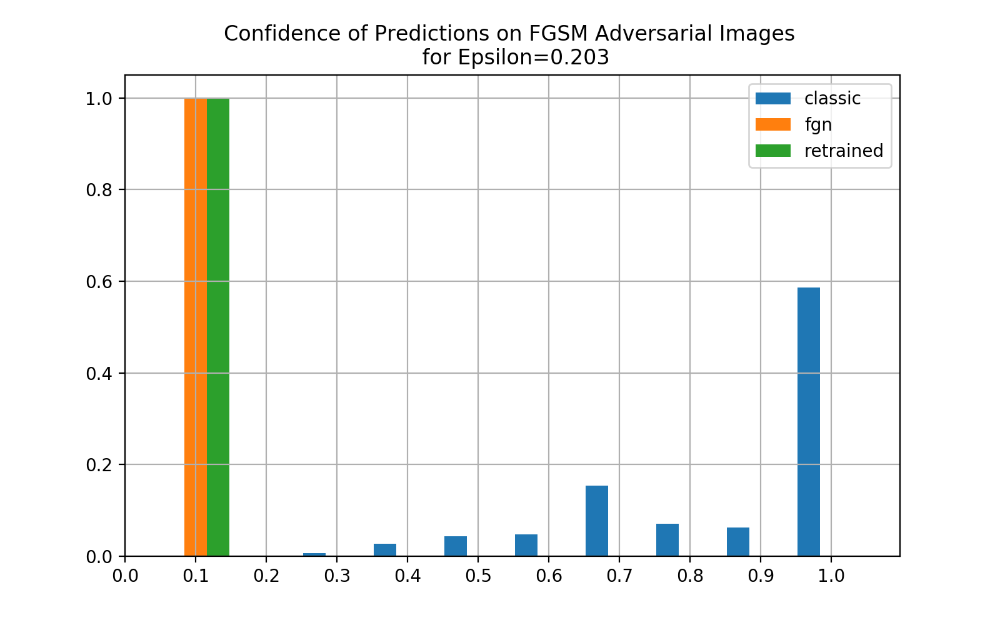

<IPython.core.display.Javascript object>


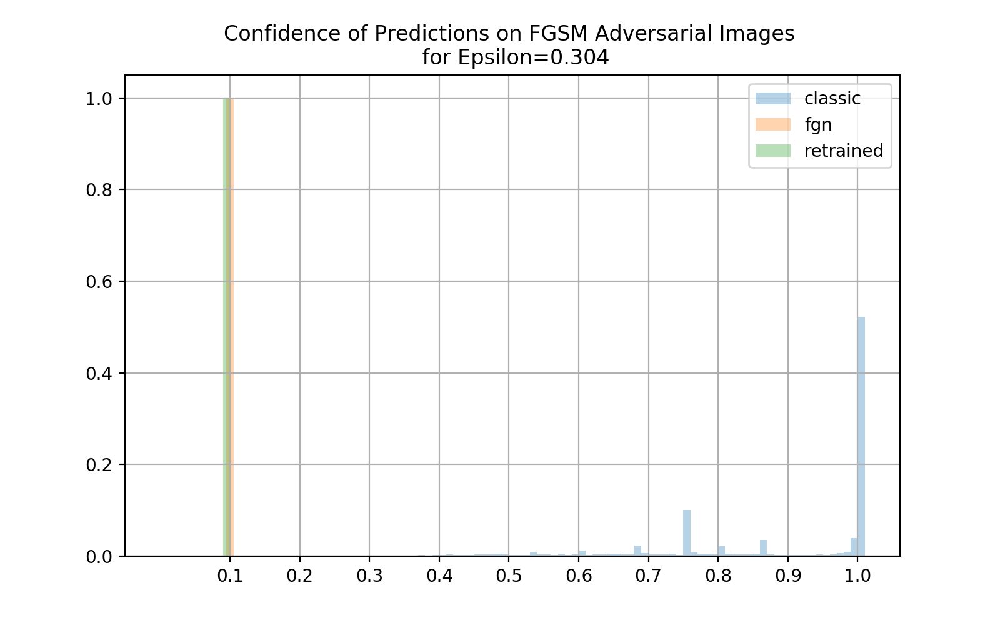

<IPython.core.display.Javascript object>


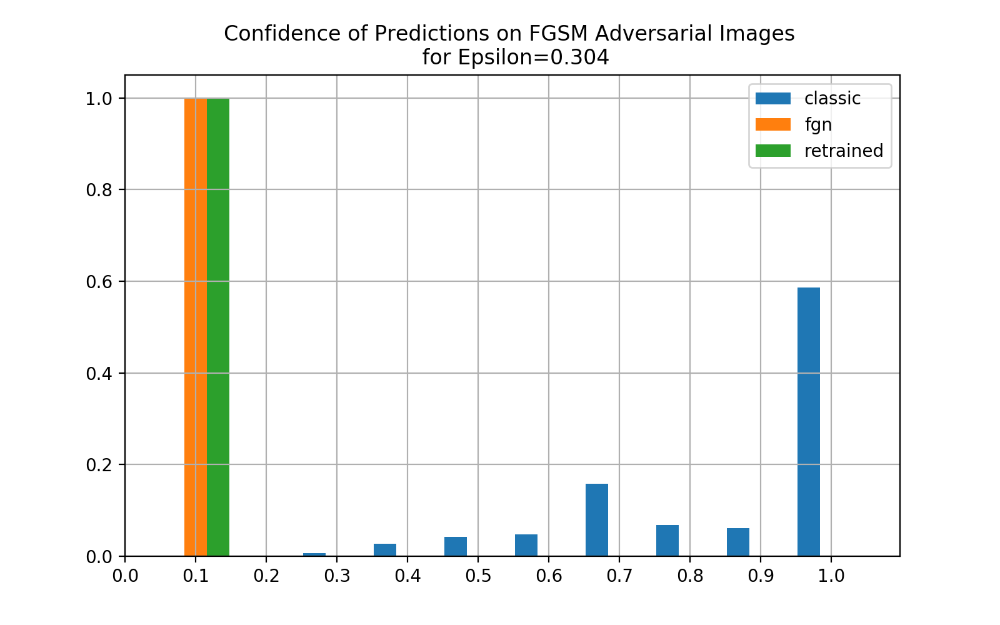

<IPython.core.display.Javascript object>


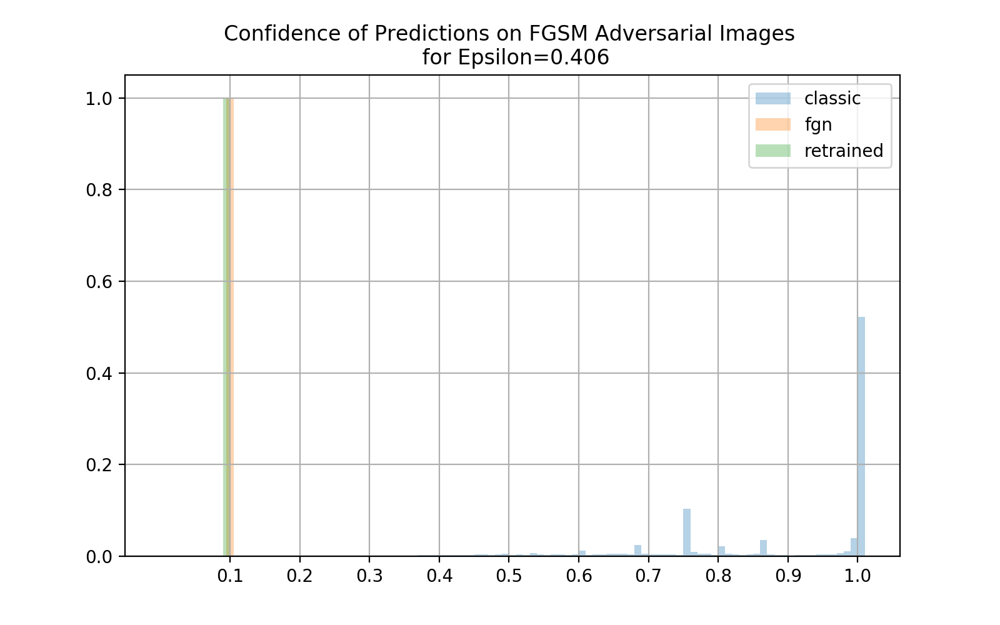

<IPython.core.display.Javascript object>


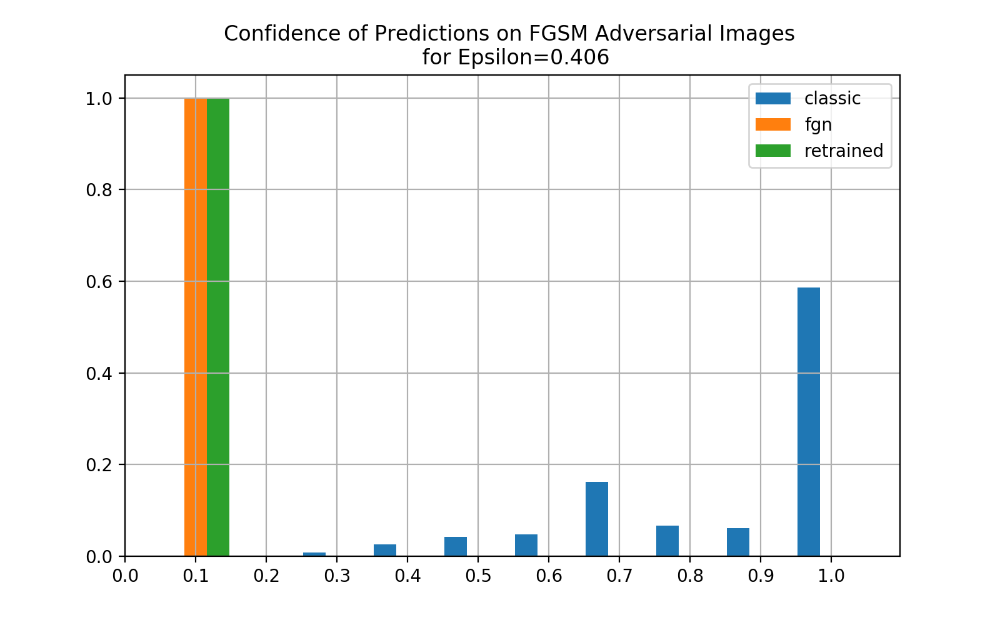

<IPython.core.display.Javascript object>


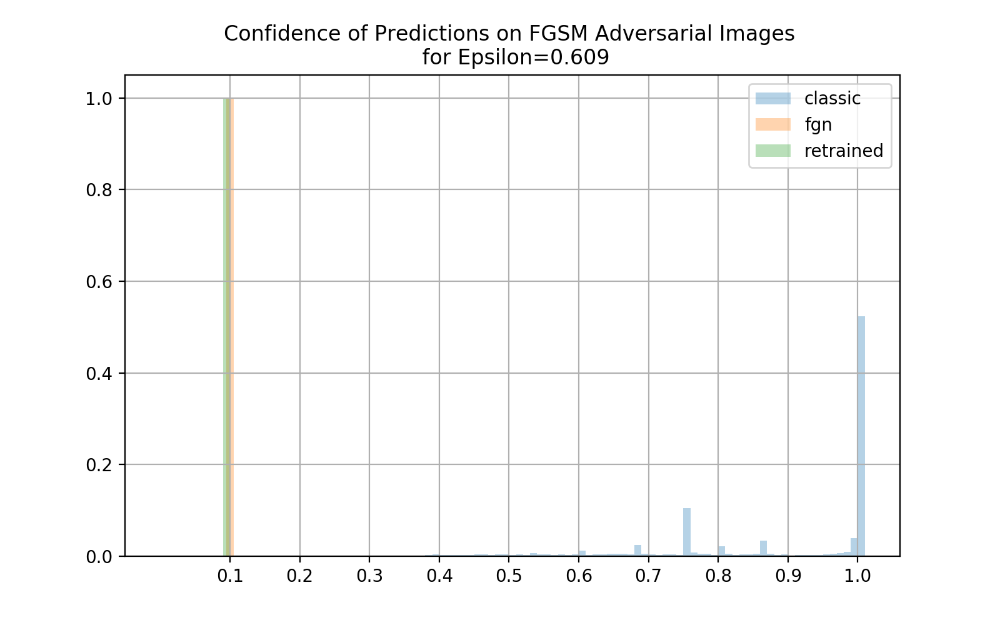

<IPython.core.display.Javascript object>


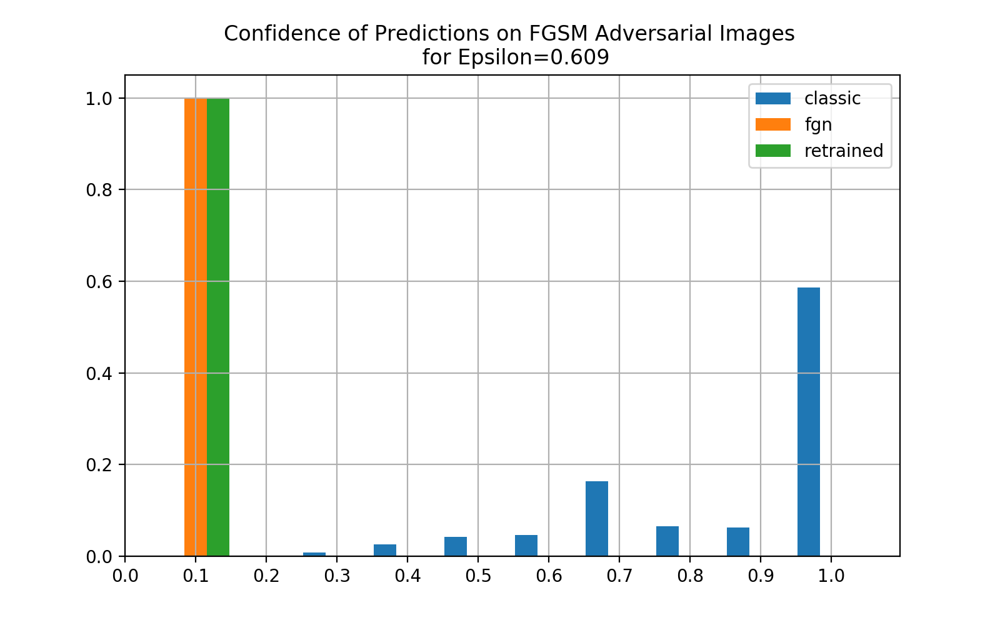

<IPython.core.display.Javascript object>


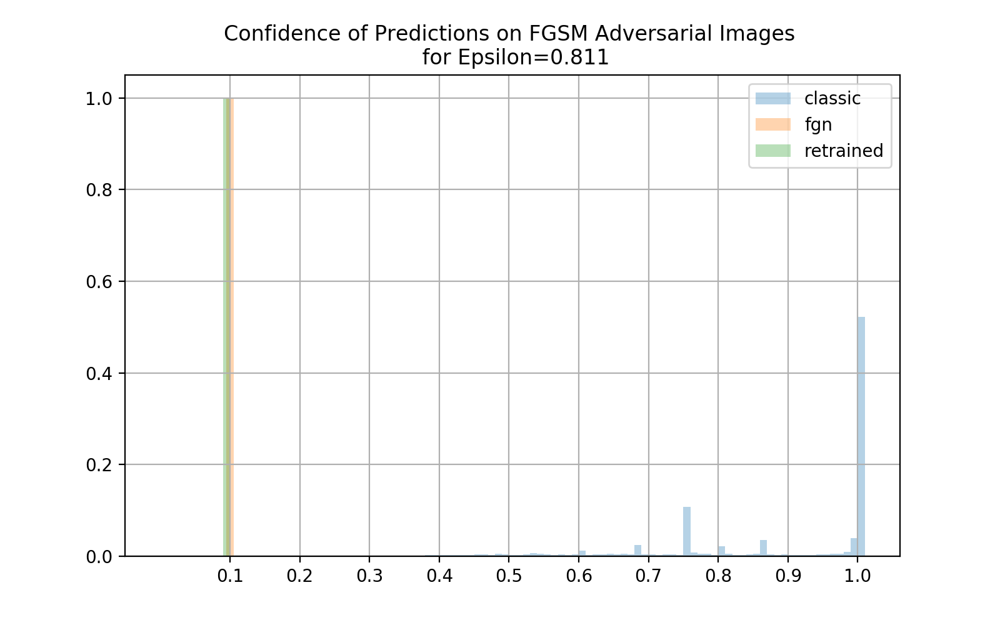

<IPython.core.display.Javascript object>


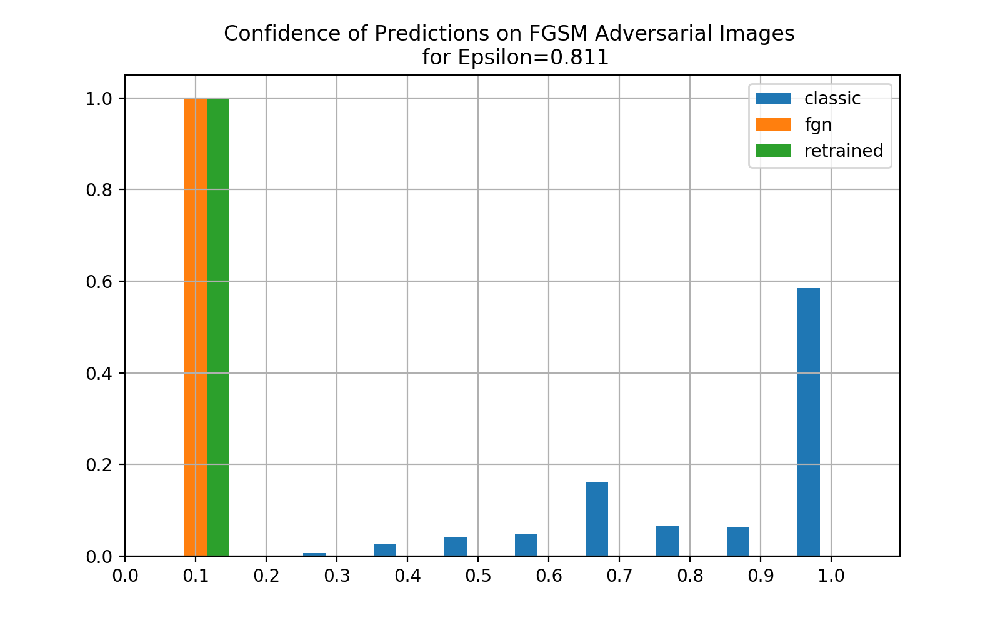

<IPython.core.display.Javascript object>


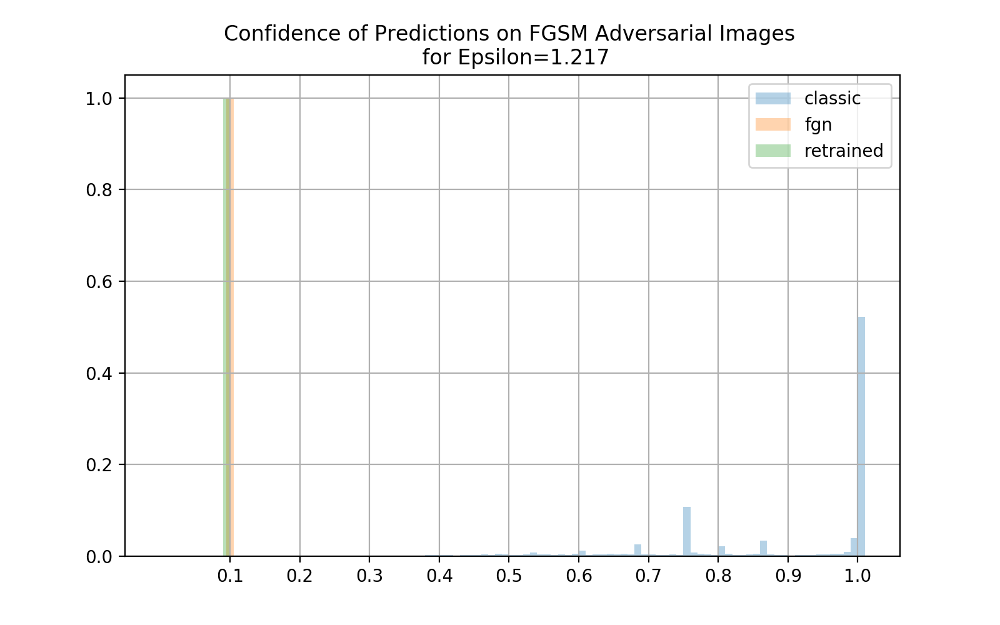

<IPython.core.display.Javascript object>


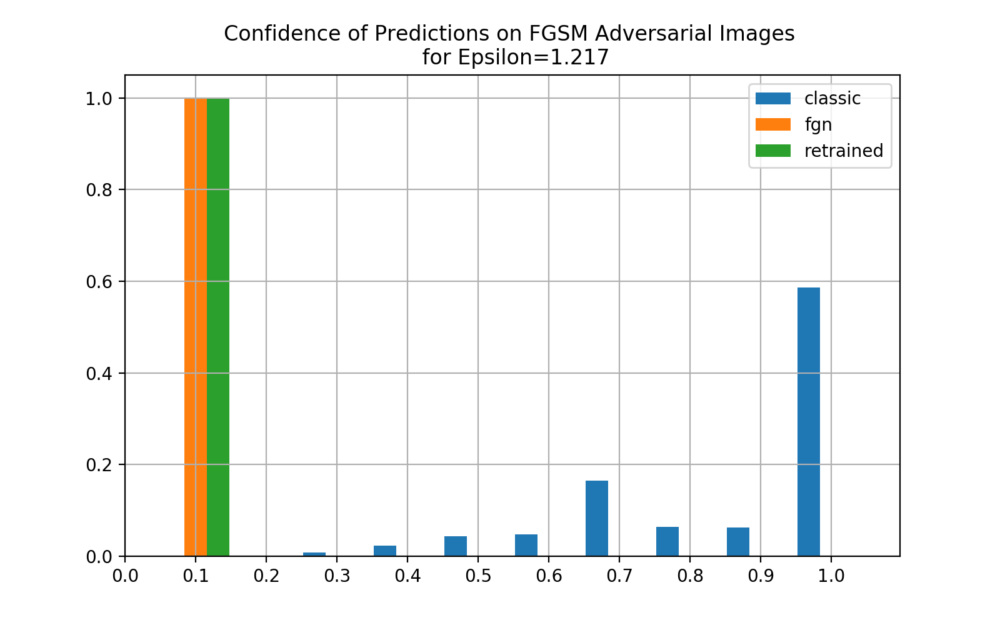

<IPython.core.display.Javascript object>


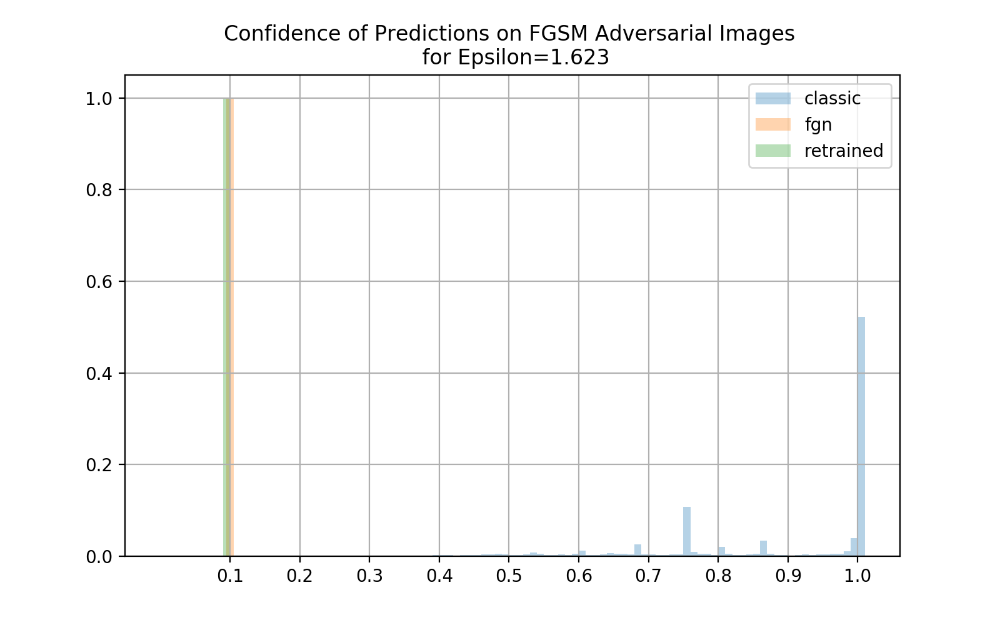

<IPython.core.display.Javascript object>


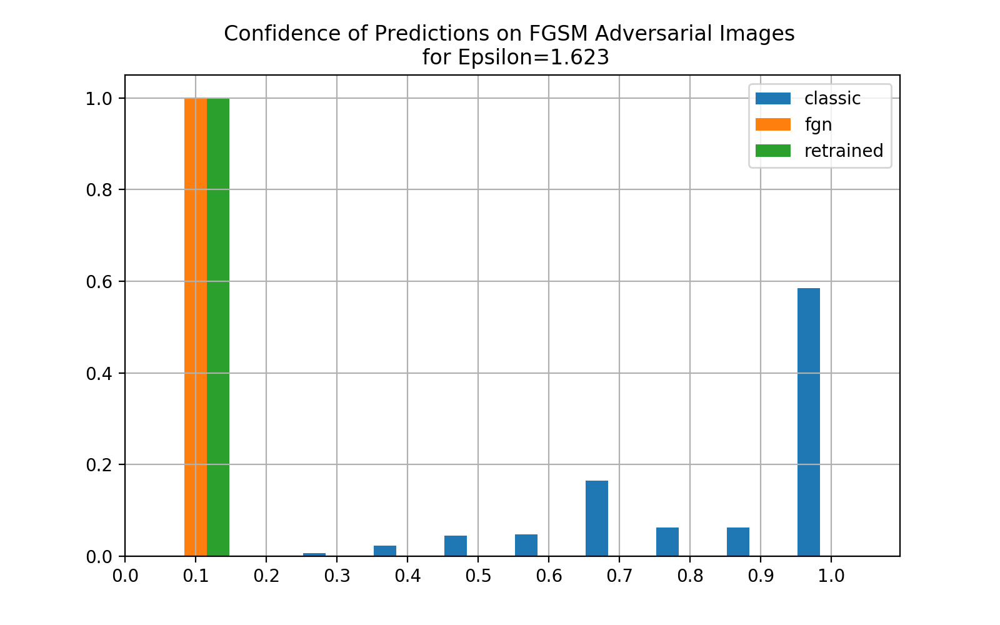

<IPython.core.display.Javascript object>


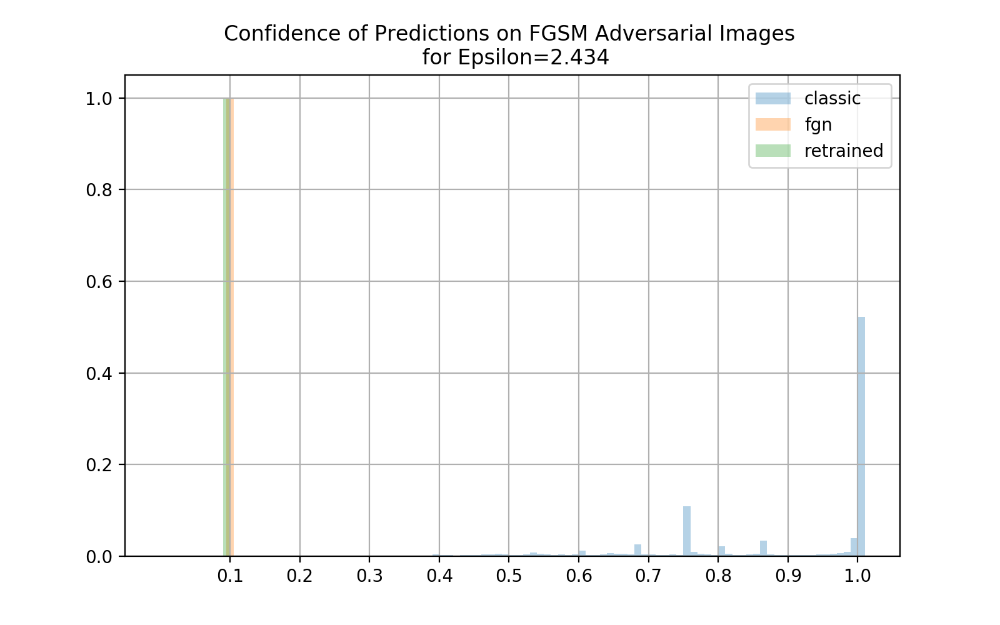

<IPython.core.display.Javascript object>


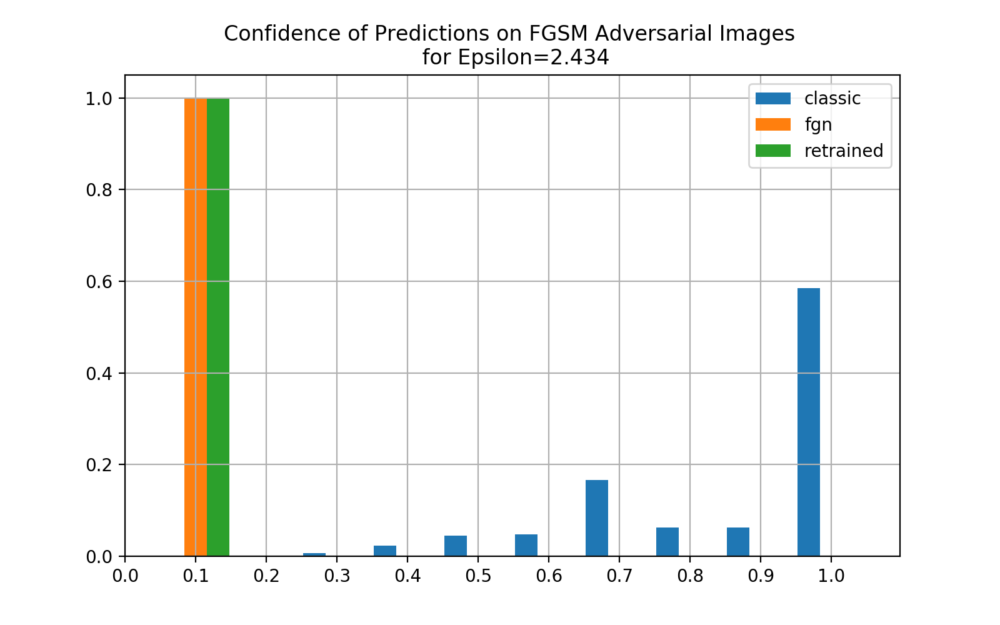

<IPython.core.display.Javascript object>


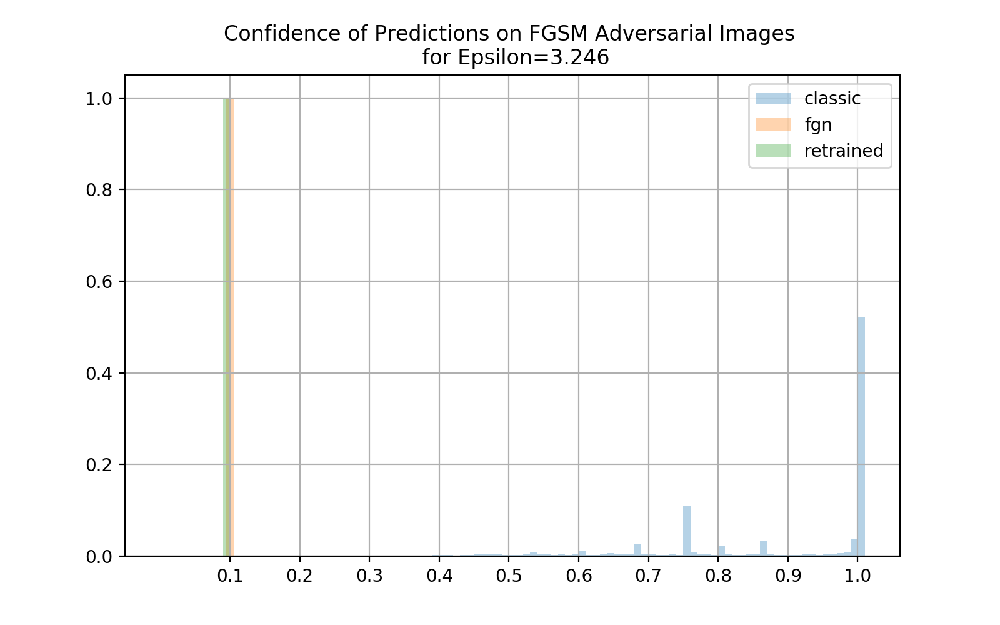

<IPython.core.display.Javascript object>


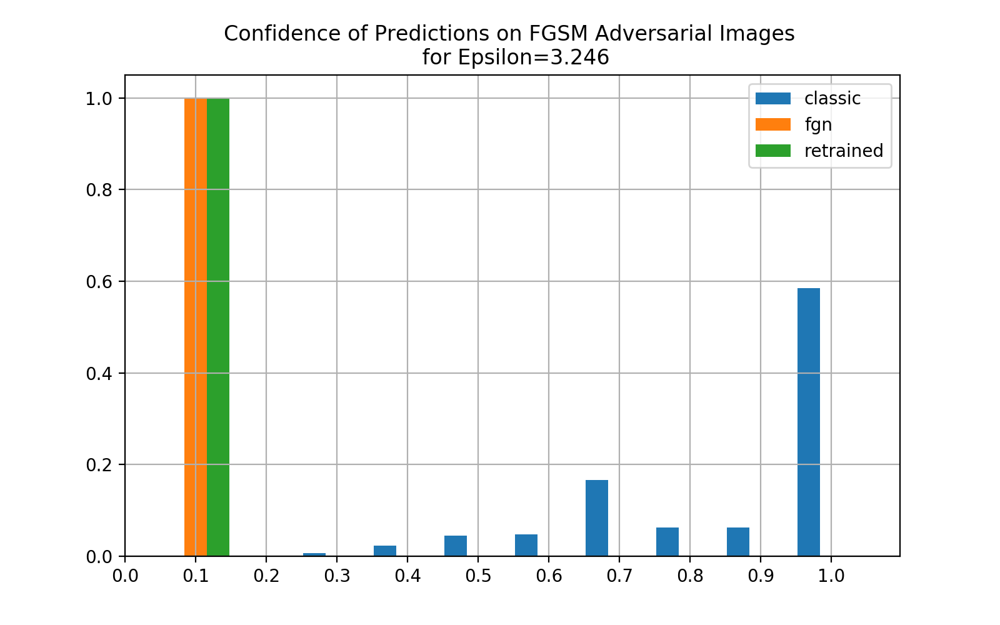

In [56]:
for i, clipped_images in enumerate(zip(classic_clipped, fgn_clipped, ret_fgn_clipped)):
    
    p = [] 
    for n, model in enumerate([classic_model, fgn_model, ret_fgn_model]):
        
        # compute predictions
        model.eval()
        with torch.no_grad(): preds = model(clipped_images[n].to(device))
        preds = preds.cpu().detach().numpy()
        
        # apply softmax for probabilities
        preds_softmax = np.array([np.exp(x)/sum(np.exp(x)) for x in preds.astype('float128')])
        # get the maximums
        preds_maxes = np.max(preds_softmax, axis=1)
        
        p.append(preds_maxes)
        
        # histogram
        plt.hist(preds_maxes,
                 bins=0.005+ np.arange(101)/100,
                 weights=[1/len(preds_maxes) for _ in preds_maxes], 
                 rwidth=1.2,
                 label=names[n],
                 align=al[n], 
                 alpha=0.33)
    plt.xticks((np.arange(10)+1)/10.0)
    plt.legend()
    plt.title('Confidence of Predictions on FGSM Adversarial Images \n for Epsilon={}'.format(np.round(epsilons[i],3)) )
    plt.grid(True)
    plt.show()
        
        
    # histogram
    # weights = np.ones_like(preds_maxes)/len(preds_maxes)
    plt.hist(p, bins= 0.05+ np.arange(11)/10,
             rwidth=0.95, weights=[[1/len(p[0]) for _ in p[0]] for _ in p],
             align='mid',
             label=names )
    plt.xticks(np.arange(11)/10.0)
    plt.legend()
    plt.title('Confidence of Predictions on FGSM Adversarial Images \n for Epsilon={}'.format(np.round(epsilons[i],3)) )
    plt.grid(True)
    plt.show()